### To run scRNA-seq analysis for CRC cancer patients

Reference: https://www.nature.com/articles/s41588-020-0636-z

data source: https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/


In [2]:
# Set up
required.packages <- c("Seurat", "dplyr", "SingleR", "celldex", "SingleCellExperiment",
                       "glue", 'readxl', 'cowplot', 'ggplot2', 'viridis', 'tidyr', 
                       'harmony',  'SeuratData', 'rio', 'Matrix', 'celldex', 'SingleR') 

# if(!requireNamespace('remotes', quietly = TRUE)){
#   install.packages('remotes')}
#   
# remotes::install_github('satijalab/azimuth', ref = 'master')
# devtools::install_github('satijalab/seurat-data')
# devtools::install_github("navinlabcode/copykat")

new.packages <- required.packages[!(required.packages %in% installed.packages()[,"Package"])]

if (!require("BiocManager", quietly = TRUE))
    install.packages("BiocManager")


if(length(new.packages) > 0 ) BiocManager::install(new.packages)

sapply(required.packages, function(pkg){suppressPackageStartupMessages(require(pkg, character.only = TRUE))})

Seurat                dplyr              SingleR 
                TRUE                 TRUE                 TRUE 
             celldex SingleCellExperiment                 glue 
                TRUE                 TRUE                 TRUE 
              readxl              cowplot              ggplot2 
                TRUE                 TRUE                 TRUE 
             viridis                tidyr              harmony 
                TRUE                 TRUE                 TRUE 
          SeuratData                  rio               Matrix 
                TRUE                 TRUE                 TRUE 
             celldex              SingleR 
                TRUE                 TRUE

In [3]:

# remotes::install_github("satijalab/seurat", "seurat5")
# install.packages('https://cran.r-project.org/src/contrib/Archive/Matrix/Matrix_1.6-5.tar.gz', repos = NULL)
# install.packages("irlba",type="source", dependencies=T)
# remotes::install_github("satijalab/seurat", "seurat5")
# remotes::install_github("satijalab/seurat-data", "seurat5")
# remotes::install_github('satijalab/azimuth', ref = 'master')
# remotes::install_github("satijalab/seurat-wrappers", "seurat5")
# remotes::install_github("stuart-lab/signac", ref = "develop")
# remotes::install_github("bnprks/BPCells")

In [4]:
data.dir <- "/media/josh/seagate/data/perm/scRNA_seq/Lee_CRC"

if(!dir.exists(data.dir)){
    dir.create(data.dir, recursive = T)
}

date.str <- "09212024"

project = 'Lee_CRC'

nFeature_lower <- 250
nFeature_upper <- 10000
nCount_lower <- 1000
nCount_upper <- 100000
pMT_lower <- 0
pMT_upper <- 25
pHB_lower <- 0
pHB_upper <- 5

In [5]:
# Data ref: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6530130/


URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/GSE132465_GEO_processed_CRC_10X_raw_UMI_count_matrix.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}


URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/GSE132465_GEO_processed_CRC_10X_cell_annotation.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}

URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/suppl/GSE132465_GEO_processed_CRC_10X_natural_log_TPM_matrix.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}

URL <- 'https://ftp.ncbi.nlm.nih.gov/geo/series/GSE132nnn/GSE132465/matrix/GSE132465_series_matrix.txt.gz'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}




In [6]:
### Download clinical data
URL <- 'https://static-content.springer.com/esm/art%3A10.1038%2Fs41588-020-0636-z/MediaObjects/41588_2020_636_MOESM3_ESM.xlsx'
file_name <- basename(URL)

if(!file.exists(glue('{data.dir}/{file_name}'))){
  system(sprintf("wget '%s' -P %s", URL, data.dir))
  # system(sprintf('tar -xvf %s/%s -C %s', data.dir, file_name, data.dir))
  # system(glue('rm {data.dir}/{file_name}'))
}

In [7]:
clinical_dat <- readxl::read_excel(glue('{data.dir}/41588_2020_636_MOESM3_ESM.xlsx'), sheet = 2, skip = 3)


In [8]:
table(clinical_dat$`Sample type`)


Colorectal cancer              Core           KUL01-T           KUL19-T 
               23                 1                 1                 1 
          KUL21-T           KUL28-T           KUL30-T           KUL31-T 
                1                 1                 1                 1 

In [9]:
names(clinical_dat)

[1] "Normal"               "Patient"              "Tumor"               
 [4] "Sample type"          "Gender"               "Age"                 
 [7] "TNM stage"            "Stage"                "Anatomic region"     
[10] "Left/Right-sided"     "MSI"                  "Pathological subtype"
[13] "No.of mutations"      "nearestCMS (RF)"      "predictedCMS (RF)"   
[16] "KRAS"                 "BRAF"                 "TP53"                
[19] "APC"                  "SMAD4"                "Alias (Tumor)"       
[22] "Alias (Normal)"

In [10]:
clinical_dat <- clinical_dat %>% 
filter(`Sample type` == 'Colorectal cancer') %>% 
select('Patient', 'Stage', 'Anatomic region', 'MSI', 'KRAS','BRAF','TP53','APC','SMAD4')
head(clinical_dat, 3)

Patient,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC02,IIIB,rectum,MSS,Wildtype,Wildtype,Mutant,Mutant,Mutant
SMC03,IIIC,hepatic flexure,MSI-H,Wildtype,Mutant,Wildtype,Mutant,Wildtype


In [11]:
table(clinical_dat$MSI, useNA = 'always')


MSI-H   MSS  <NA> 
    4    19     0 

In [10]:

dat <- GEOquery::getGEO(filename=glue('{data.dir}/GSE132465_series_matrix.txt.gz'),GSEMatrix = FALSE,getGPL = FALSE)

meta <- pData(dat)

# pheno <- meta %>% select( geo_accession, source_name_ch1,  supplementary_file_1, 'tissue type:ch1')
pheno <- meta %>% select( geo_accession,   'patient_id:ch1', 'tissue type:ch1', 'pathologic:ch1')

pheno <- data.table::setnames(pheno, c('tissue type:ch1', 'patient_id:ch1', 'pathologic:ch1'), 
                              c('Class', 'patient_id', 'pathologic_grade')) %>% unique()

# # pheno$sample_name <- paste0(pheno$geo_accession, '_', pheno$title)

# # head(pheno, 1)
# pheno$Disease_type <- sapply(strsplit(gsub('.tar.gz', '', basename(pheno$supplementary_file_1)), '_'), '[', 2)
# pheno$Disease_type <- gsub('1|2', '', pheno$Disease_type)
pheno$Class[pheno$Class == 'Normal mucosa'] <- 'Normal'
pheno$Class[pheno$Class == 'Colorectal cancer'] <- 'Cancer'


Setting options('download.file.method.GEOquery'='auto')

Setting options('GEOquery.inmemory.gpl'=FALSE)



In [11]:
head(pheno)

,geo_accession,patient_id,Class,pathologic_grade
,<chr>,<chr>,<chr>,<chr>
GSM3868425,GSM3868425,SMC01,Cancer,Well differentiated
GSM3868426,GSM3868426,SMC02,Cancer,Well differentiated
GSM3868427,GSM3868427,SMC03,Cancer,Poorly differntiated
GSM3868428,GSM3868428,SMC04,Cancer,Moderately differenttiated
GSM3868429,GSM3868429,SMC05,Cancer,Well differentiated with mucin production (<10%)
GSM3868430,GSM3868430,SMC06,Cancer,Well differentiated


In [12]:
table(pheno$Histology)

< table of extent 0 >

In [ ]:
cnts <- read.table(glue('{data.dir}/GSE132465_GEO_processed_CRC_10X_raw_UMI_count_matrix.txt.gz'), sep = "\t", row.names=1, header=T)
cnts <- Matrix(as.matrix(cnts), sparse=T)

In [9]:
seu_obj <- CreateSeuratObject(counts = cnts, project = project, min.cells = 3, min.features = 200)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”


In [10]:
ann <- read.table(glue('{data.dir}/GSE132465_GEO_processed_CRC_10X_cell_annotation.txt.gz'), sep = '\t', header = T, row.names=1)
row.names(ann) <- gsub('-', '.', row.names(ann))

In [11]:
head(ann, 2)

,Patient,Class,Sample,Cell_type,Cell_subtype
,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2
SMC01.T_AAACCTGGTCGCATAT,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2


In [12]:
head(seu_obj@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268


In [13]:
if( all(row.names(seu_obj@meta.data) == row.names(ann))){
    seu_obj <- AddMetaData(seu_obj, metadata = ann)


}

In [14]:
head(seu_obj@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2


In [15]:
seu_obj

An object of class Seurat 
25655 features across 63689 samples within 1 assay 
Active assay: RNA (25655 features, 0 variable features)
 2 layers present: counts, data

In [16]:
gc()
### calculate mitochondrial, hemoglobin and ribosomal gene counts
seu_obj <- PercentageFeatureSet(seu_obj, pattern = "^MT-", col.name = "pMT")
seu_obj <- PercentageFeatureSet(seu_obj, pattern = "^HBA|^HBB", col.name = "pHB")
seu_obj <- PercentageFeatureSet(seu_obj, pattern = "^RPS|^RPL", col.name = "pRP")

# Data Filtering 

seu_obj_filtered <- subset(seu_obj, subset = nFeature_RNA > nFeature_lower & nFeature_RNA < nFeature_upper & pMT < pMT_upper )


seu_obj_filtered

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9732947,519.8,17538792,936.7,17538792,936.7
Vcells,377635844,2881.2,4343612956,33139.2,5429497869,41423.8


An object of class Seurat 
25655 features across 63638 samples within 1 assay 
Active assay: RNA (25655 features, 0 variable features)
 2 layers present: counts, data

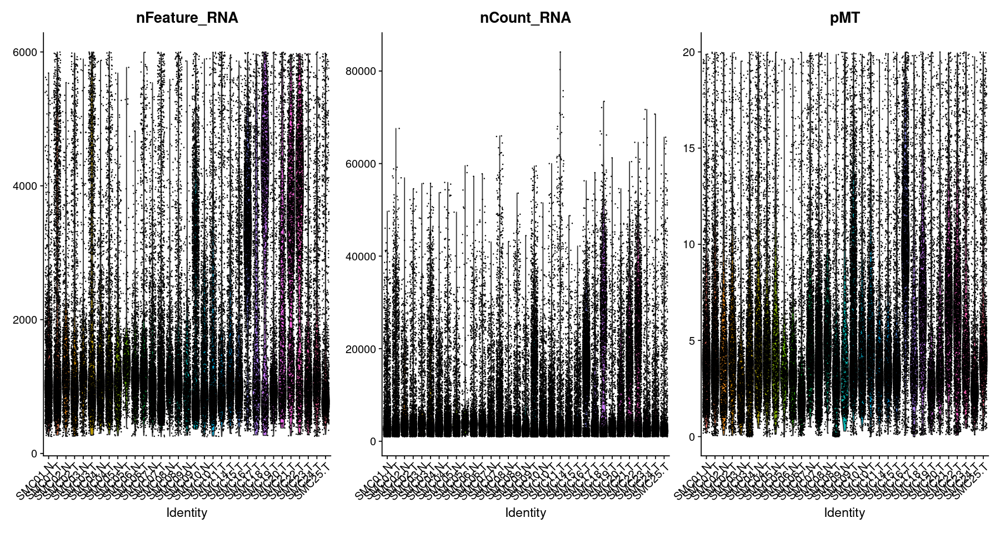

In [17]:
options(repr.plot.width = 15, repr.plot.height = 8)
VlnPlot(seu_obj_filtered, features = c("nFeature_RNA", "nCount_RNA", "pMT"), ncol = 3)

In [18]:
# Data normalization
gc()
# seu_obj_filtered <- SCTransform(seu_obj_filtered, verbose = FALSE, vars.to.regress = c("nCount_RNA", "pMT"))
seu_obj_filtered <- SCTransform(seu_obj_filtered, verbose = FALSE, vars.to.regress = c("nCount_RNA", "pMT"))

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,9941520,531.0,17538792,936.7,17538792,936.7
Vcells,739138849,5639.2,3474890365,26511.4,5429497869,41423.8


,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,10018654,535.1,17538792,936.7,17538792,936.7
Vcells,1158102567,8835.7,6935034909,52910.2,8668762993,66137.5


Warning message:
“Quick-TRANSfer stage steps exceeded maximum (= 3181900)”


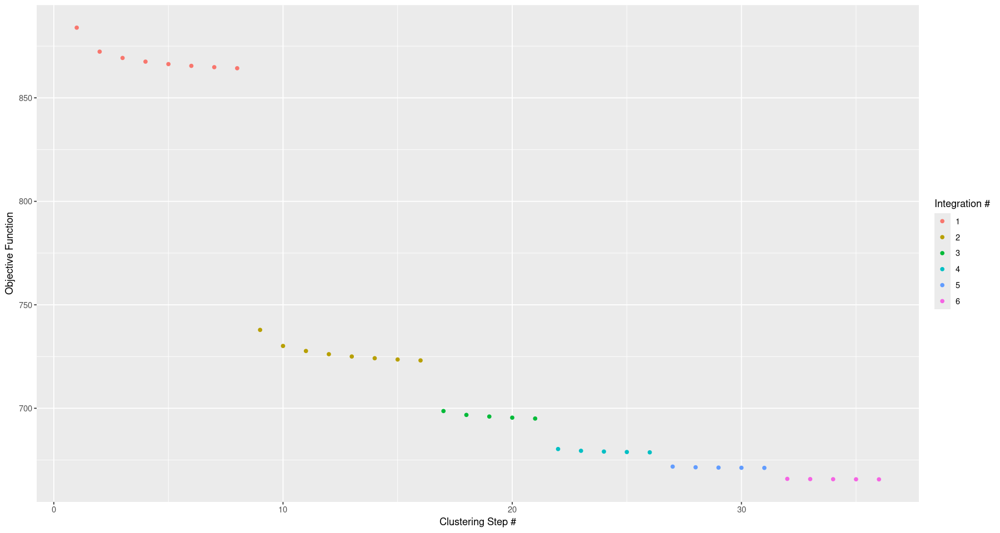

In [19]:

gc()
# Dimensionality reduction
seu_obj_filtered <- RunPCA(seu_obj_filtered, verbose = FALSE)

seu_obj_filtered <- seu_obj_filtered %>% 
    RunHarmony("orig.ident", plot_convergence = TRUE, assay.use = "SCT", verbose = FALSE)


In [4]:

# seu_obj_filtered <- RunUMAP(seu_obj_filtered, reduction = "harmony")
seu_obj_filtered <- seu_obj_filtered %>% 
    RunUMAP(reduction = "harmony", dims = 1:20, verbose = FALSE) %>% 
    FindNeighbors(reduction = "harmony", dims = 1:20, verbose = FALSE)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”


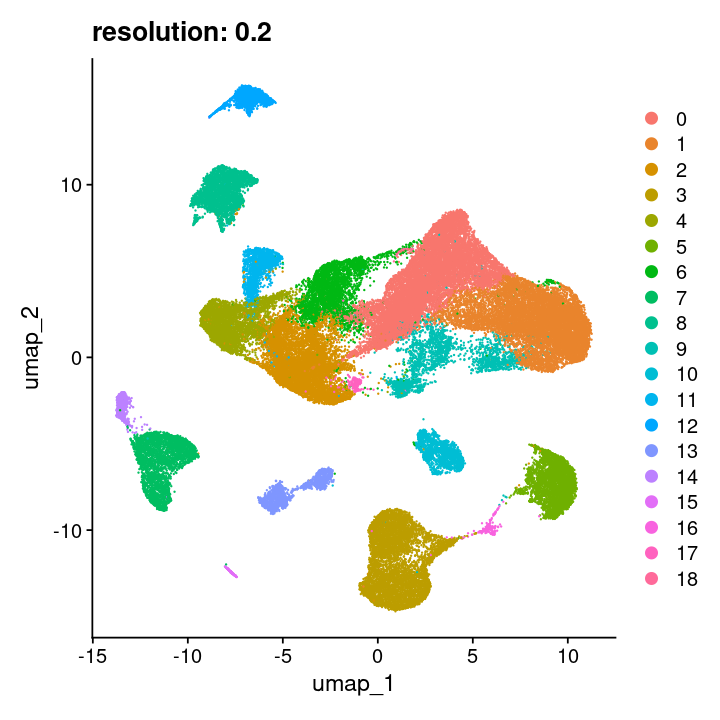

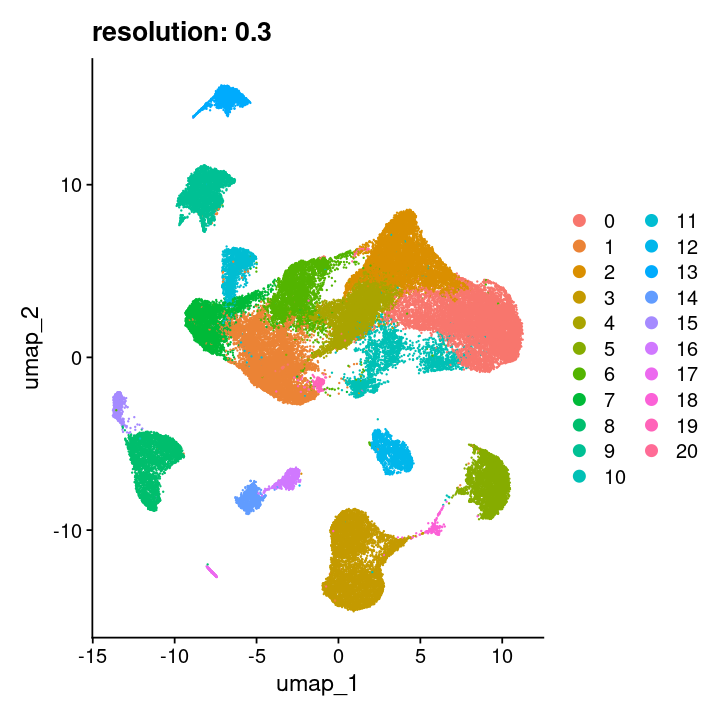

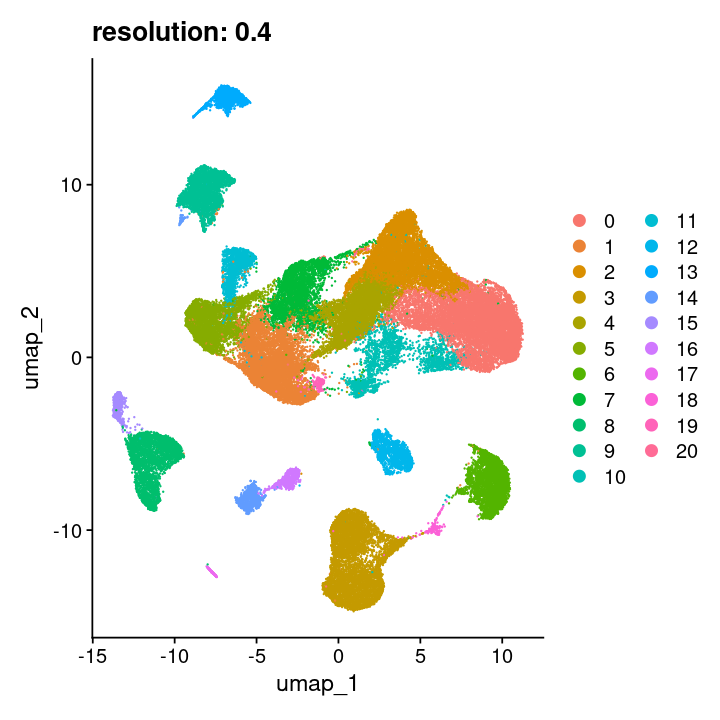

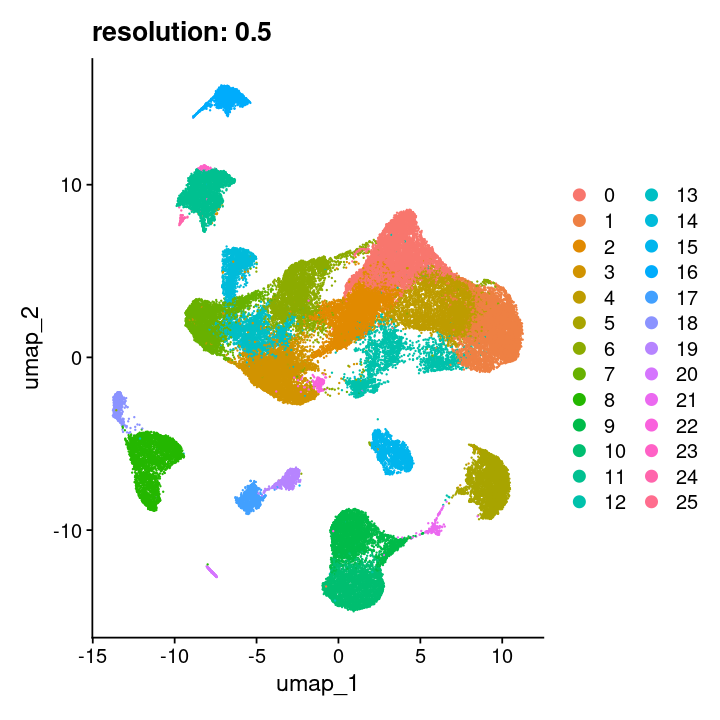

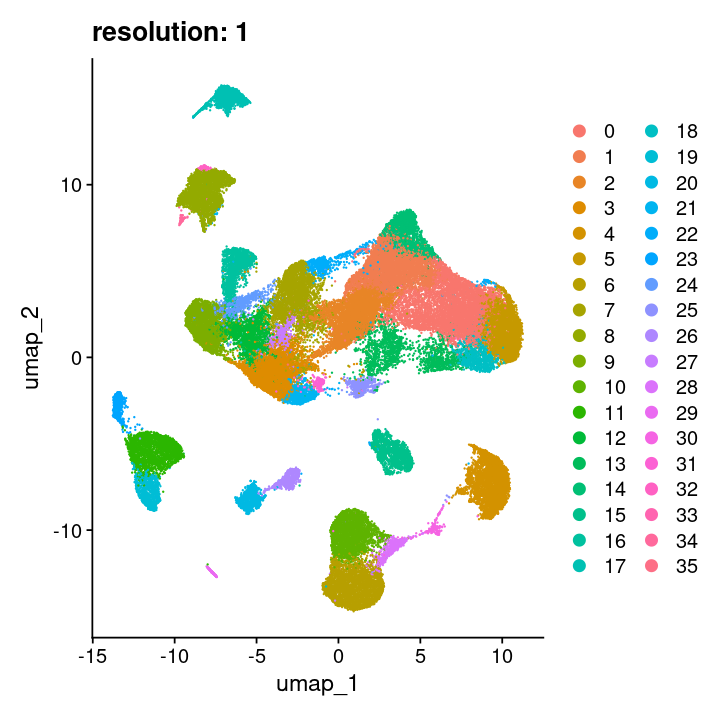

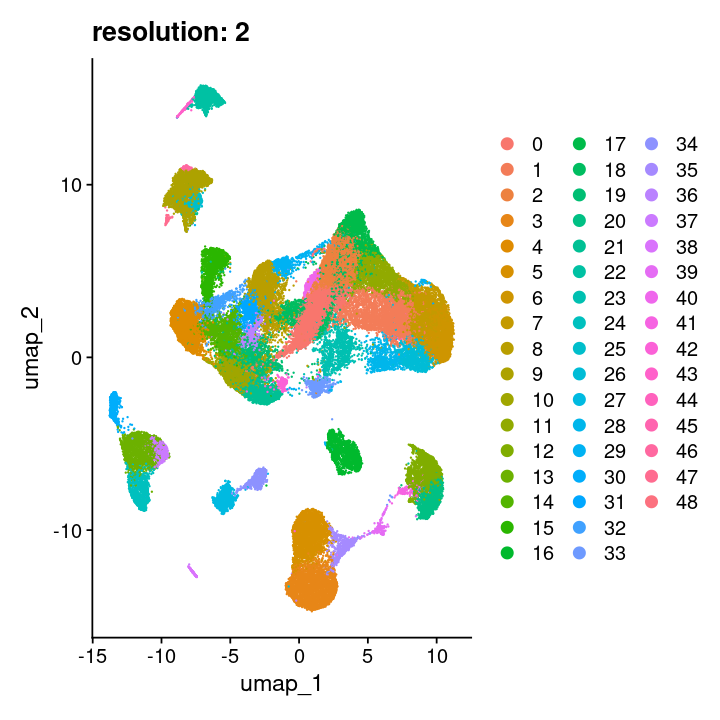

In [5]:
options(repr.plot.width = 6, repr.plot.height = 6)
# Data normalization
# gc()
# seu_obj_filtered <- SCTransform(seu_obj_filtered, verbose = FALSE, vars.to.regress = c("nCount_RNA", "pMT"), conserve.memory = T)

for (i in c(0.2, 0.3, 0.4, 0.5, 1, 2)) {
  seu_obj_filtered <- FindClusters(seu_obj_filtered, resolution = i, verbose = FALSE)
  print(DimPlot(seu_obj_filtered, reduction = "umap") + labs(title = paste0("resolution: ", i)))
}



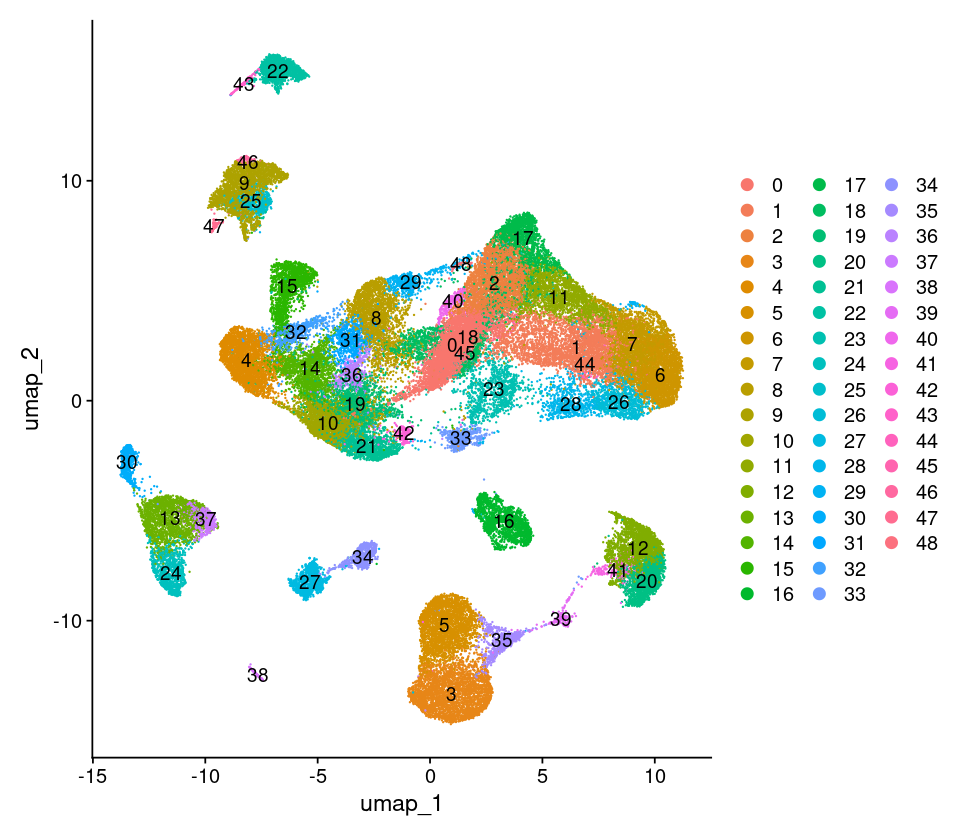

In [6]:
options(repr.plot.width = 8, repr.plot.height = 7)

DimPlot(seu_obj_filtered, label = TRUE)

In [12]:
# saveRDS(seu_obj_filtered, glue('{data.dir}/Lee_CRC_cancer.rds'))
seu_obj_filtered <- readRDS(glue('{data.dir}/Lee_CRC_cancer.rds'))

In [13]:
head(seu_obj_filtered@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,pRP,nCount_SCT,nFeature_SCT,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5,SCT_snn_res.1,SCT_snn_res.2
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,23.12625,4581,1578,6,8,6,7,6,7,8
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,23.15556,4758,2014,6,8,6,7,6,7,8


In [14]:
seu_obj_filtered

An object of class Seurat 
50207 features across 63638 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [15]:
cell_meta <- seu_obj_filtered@meta.data %>% select('Patient') 
cell_meta$ID <- row.names(cell_meta)
cell_meta <- merge(cell_meta, clinical_dat, by = 'Patient', all.x = T)
row.names(cell_meta) <- cell_meta$ID
cell_meta$ID <- NULL
cell_meta<- cell_meta[row.names(seu_obj_filtered@meta.data), ]

In [16]:
head(cell_meta, 3)

,Patient,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGTCCCTTGCA,SMC01,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


In [17]:
table(cell_meta$MSI, useNA = 'always')


MSI-H   MSS  <NA> 
12198 51440     0 

In [18]:
if( all(row.names(seu_obj_filtered@meta.data) == row.names(cell_meta))){
    seu_obj_filtered <- AddMetaData(seu_obj_filtered, metadata = cell_meta)

}
head(seu_obj_filtered@meta.data, 3)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGTCCCTTGCA,SMC01.T,7356,1714,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,19.711800,0,⋯,8,25,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


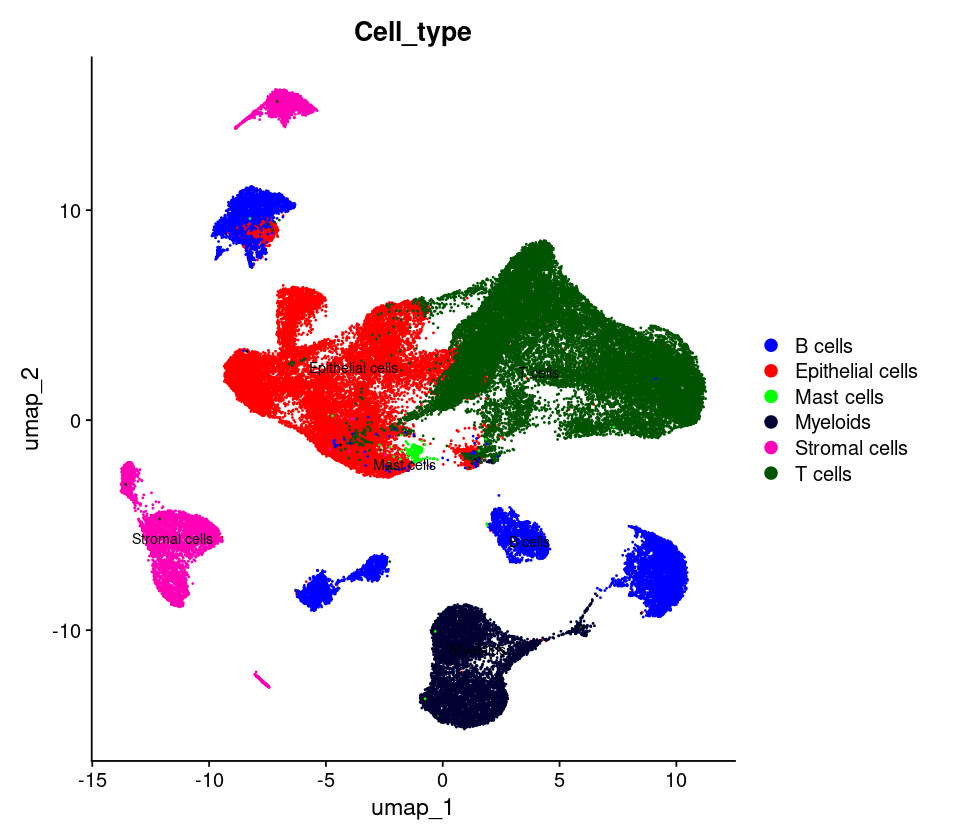

In [19]:
options(repr.plot.width = 8, repr.plot.height = 7)
n_colors <- length(levels(as.factor(seu_obj_filtered@meta.data$Cell_type)))
colors <- DiscretePalette(n_colors, palette = "glasbey")
DimPlot(seu_obj_filtered, group.by = "Cell_type", label = TRUE, label.size = 3, cols = colors, repel = T)


In [21]:
table(seu_obj_filtered@meta.data$Class)


Normal  Tumor 
 16385  47253 

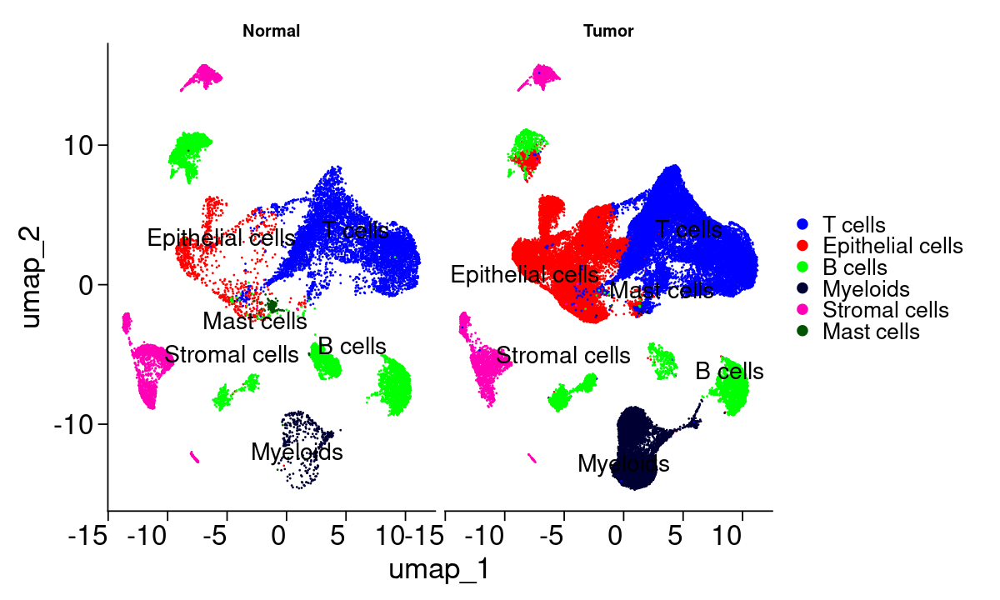

In [18]:
options(repr.plot.width = 10, repr.plot.height = 6)
cell_types <- table(seu_obj_filtered$Cell_type) %>% prop.table() %>% sort(decreasing = T) %>% names()
seu_obj_filtered@meta.data$Class <- factor(seu_obj_filtered@meta.data$Class, levels = c('Normal', 'Tumor'))
seu_obj_filtered@meta.data$Cell_type <- factor(seu_obj_filtered@meta.data$Cell_type, levels = cell_types)
n_colors <- length(cell_types)
colors <- DiscretePalette(n_colors, palette = "glasbey")
Idents(seu_obj_filtered) <- 'Cell_type'
# DimPlot(seu_obj_filtered, group.by = "bpe_cellTypes", label = TRUE, label.size = 3, cols = colors, repel = T, split.by = 'tumor_site')
DimPlot(seu_obj_filtered, label = TRUE, 
        label.size = 6, 
        cols = colors, repel = T, 
        split.by = 'Class') +
    theme(axis.ticks.length=unit(.25, "cm"),
          axis.text.x = element_text(size = 20,  hjust=1),
          axis.text.y = element_text(size = 20),  
          axis.title.x = element_text( size = 21),
          axis.title.y = element_text(size = 21), 
          axis.line = element_line( linewidth = 0.5), 
          legend.title=element_text(size=18),  
          legend.text=element_text(size=16))

In [21]:
table(seu_obj_filtered@meta.data$Cell_type, seu_obj_filtered@meta.data$`SCT_snn_res.0.2`)  %>% 
as.data.frame() %>% filter(Var2 == 0) %>% arrange(desc(Freq)) %>% head(6)

,Var1,Var2,Freq
,<fct>,<fct>,<int>
1,T cells,0,11023
2,Epithelial cells,0,1315
3,B cells,0,2
4,Myeloids,0,0
5,Stromal cells,0,0
6,Mast cells,0,0


Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


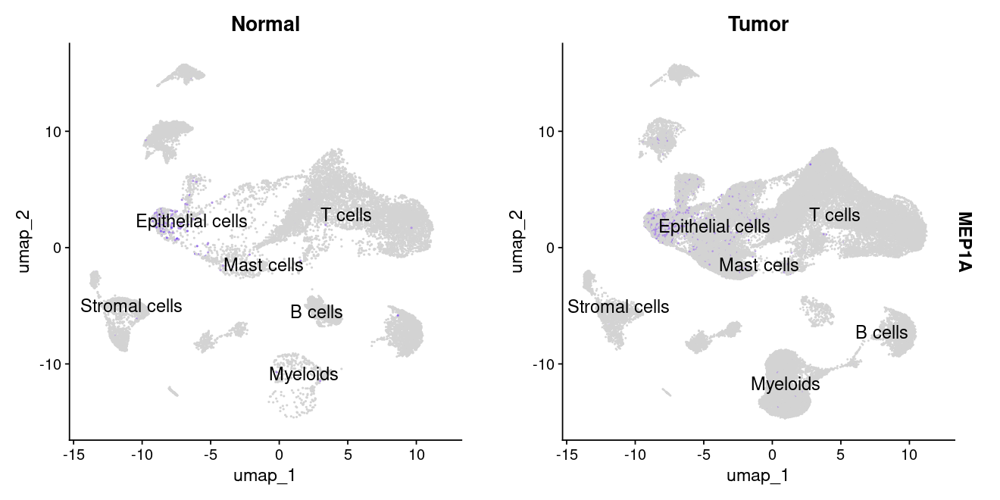

In [19]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'MEP1A')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

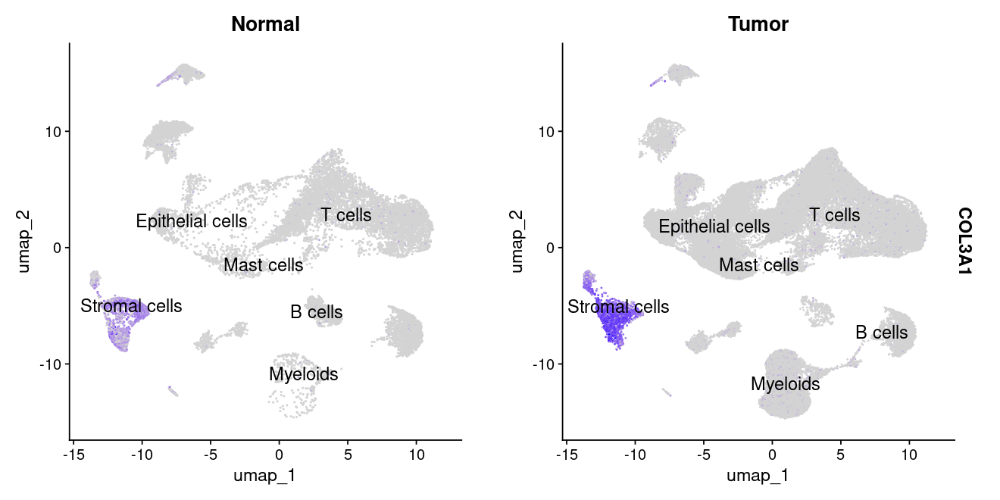

In [39]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'COL3A1')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

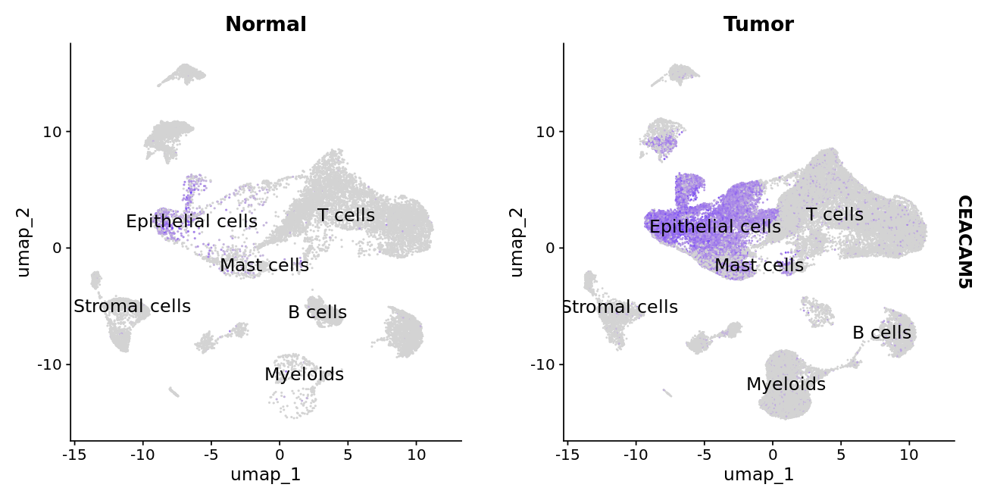

In [22]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CEACAM5')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

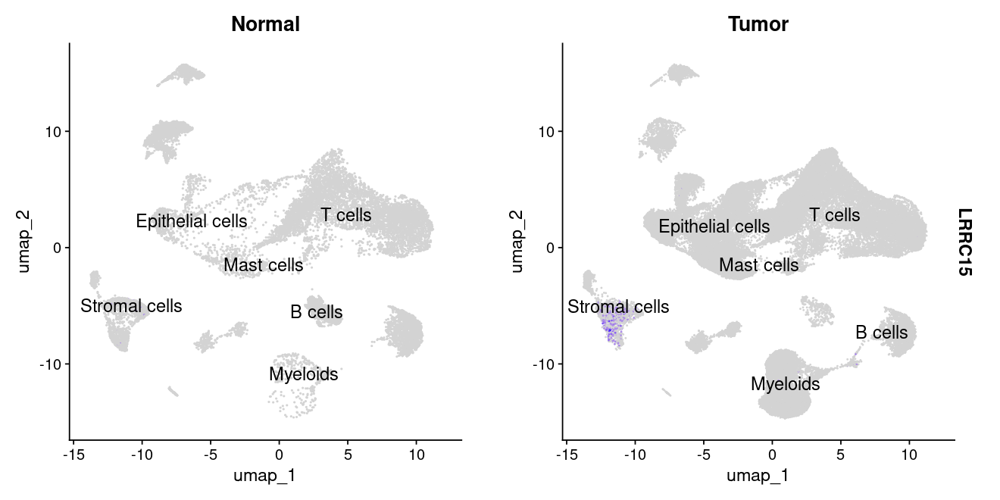

In [22]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LRRC15')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

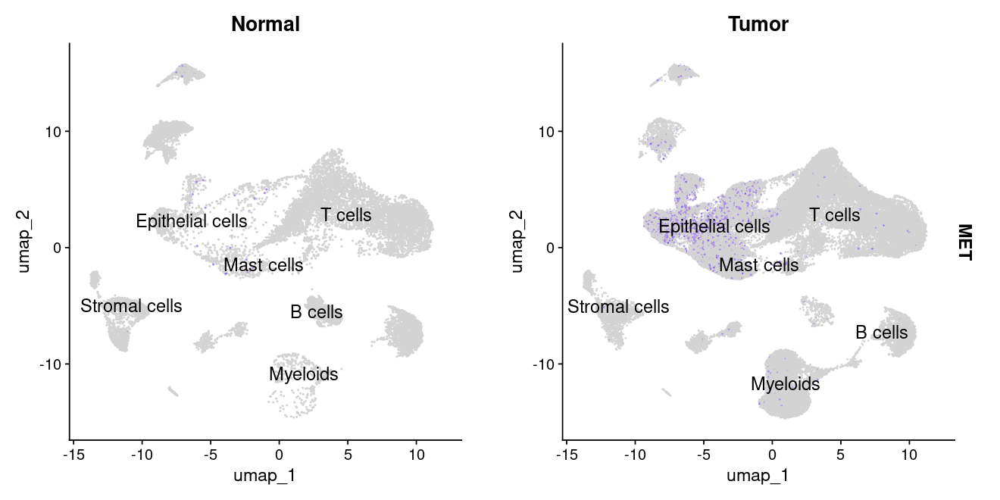

In [23]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'MET')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

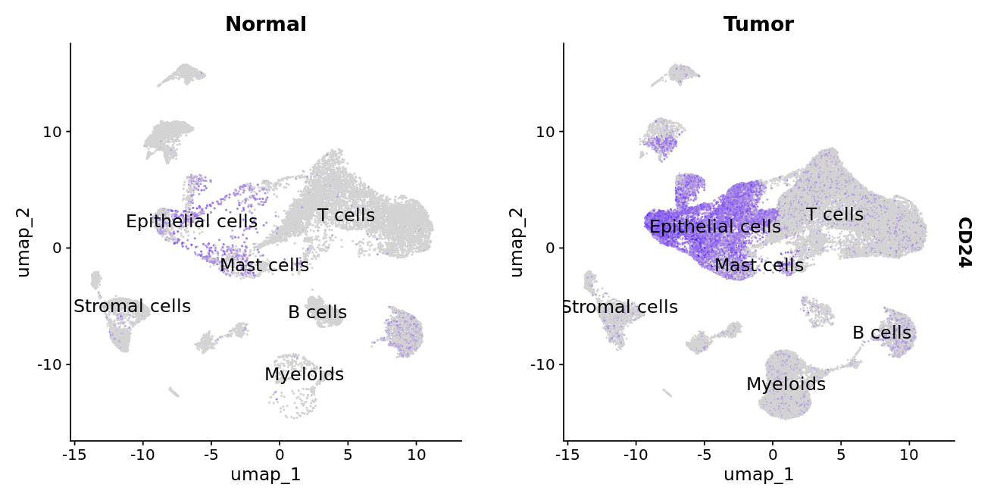

In [16]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CD24')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

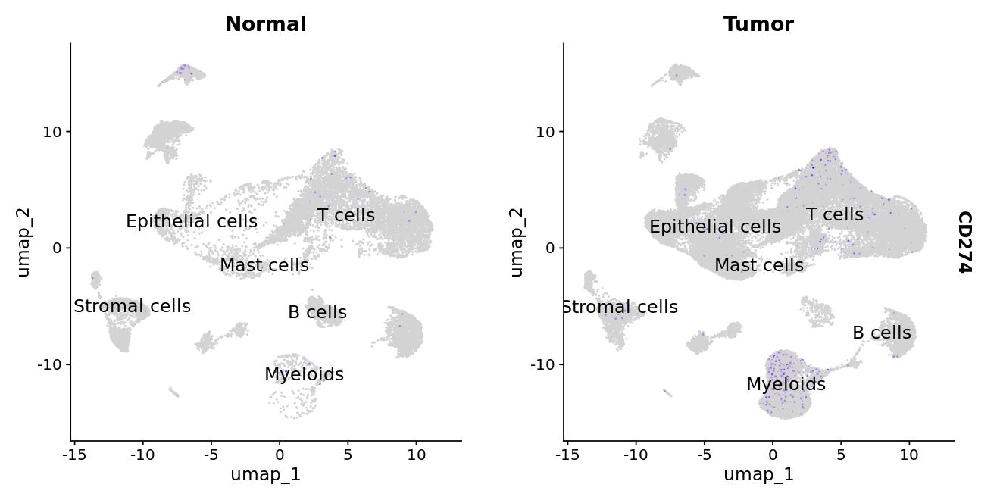

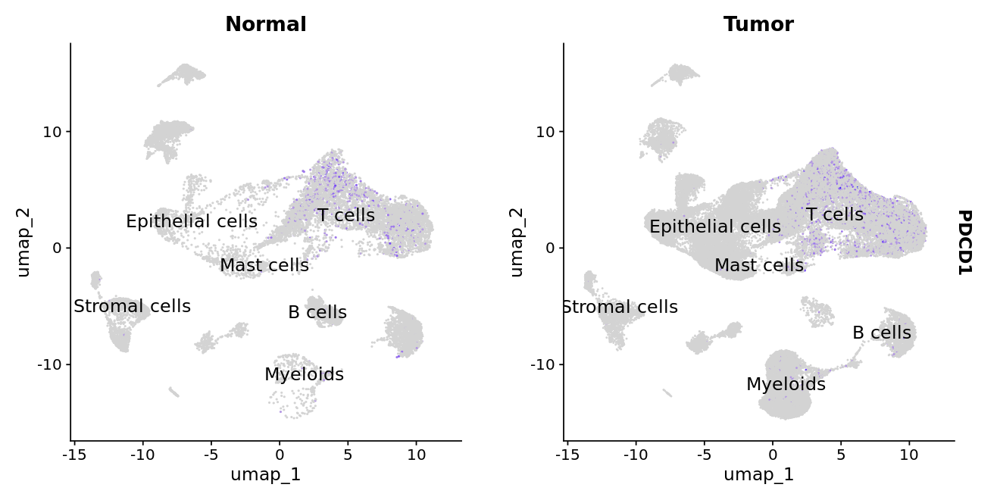

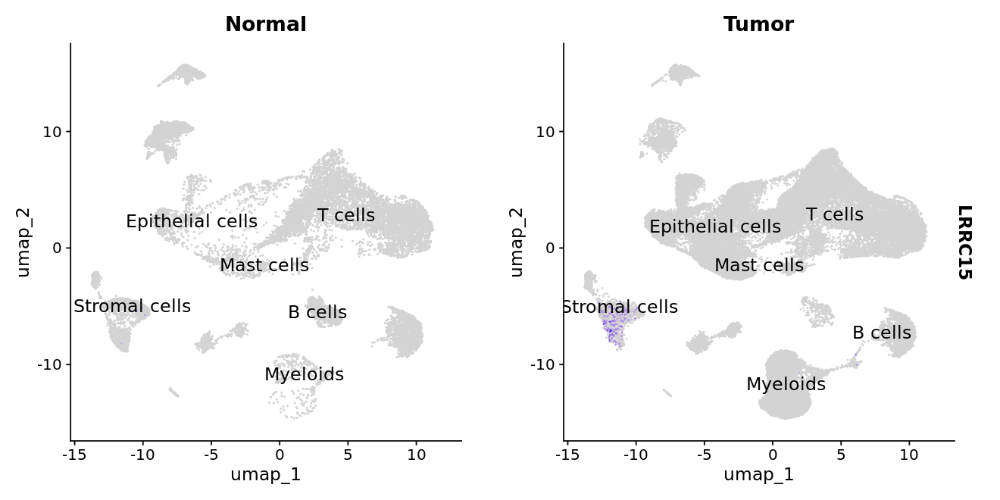

In [18]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CD274', 'PDCD1', 'LRRC15')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

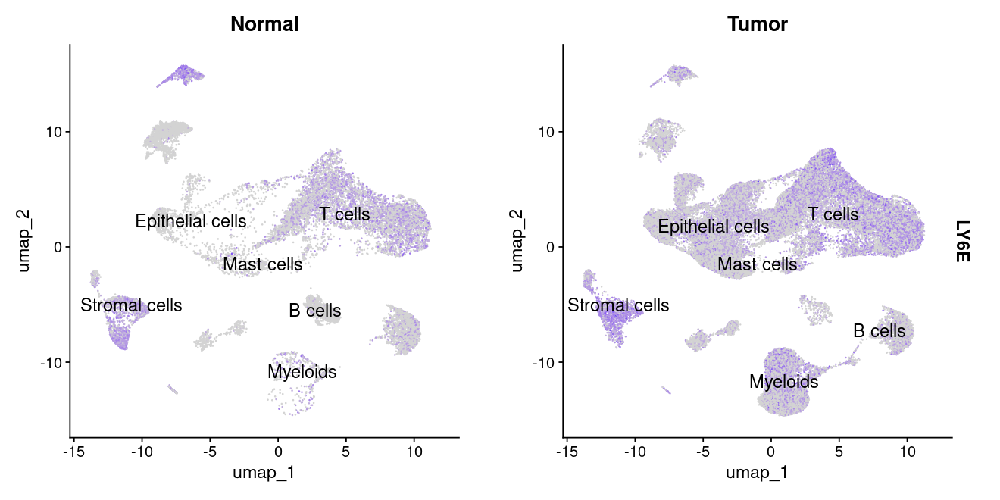

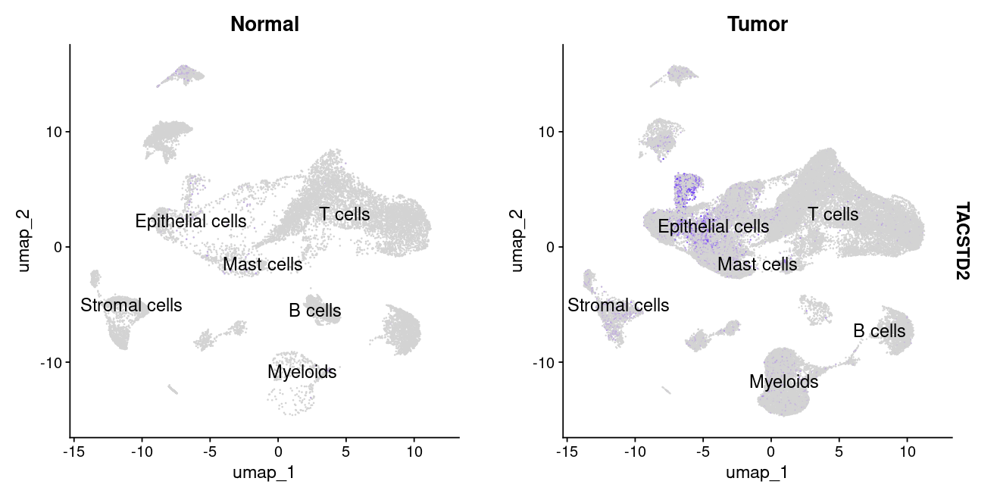

In [21]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LY6E', 'TACSTD2')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

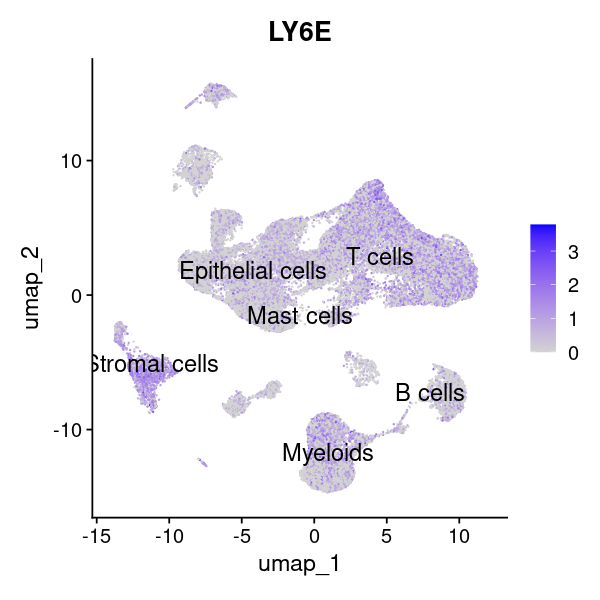

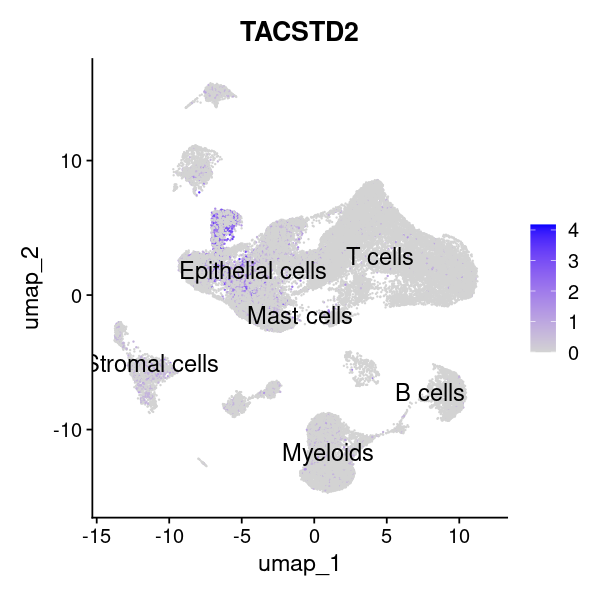

In [23]:
options(repr.plot.width = 5, repr.plot.height = 5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LY6E', 'TACSTD2')){
  
  print(FeaturePlot(subset(seu_obj_filtered, Class == 'Tumor'), features = gene, label = T, label.size = 5))
  
}

In [1]:
options(repr.plot.width = 11, repr.plot.height = 5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CGAS')){
  
  print(FeaturePlot(subset(seu_obj_filtered, Class == 'Tumor'), split.by = 'MSI', features = gene, label = T, label.size = 5))
  
}

ERROR: Error in FeaturePlot(subset(seu_obj_filtered, Class == "Tumor"), split.by = "MSI", : could not find function "FeaturePlot"


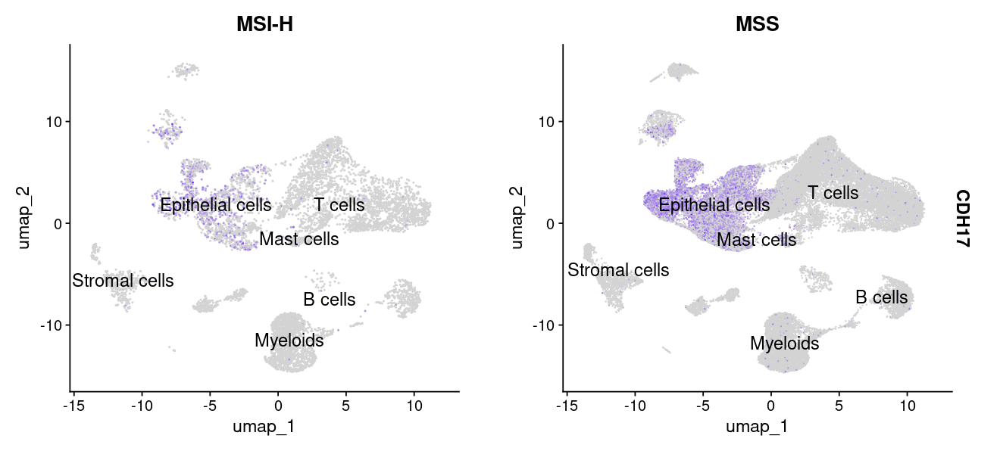

In [17]:
options(repr.plot.width = 11, repr.plot.height = 5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CDH17')){
  
  print(FeaturePlot(subset(seu_obj_filtered, Class == 'Tumor'), split.by = 'MSI', features = gene, label = T, label.size = 5))
  
}

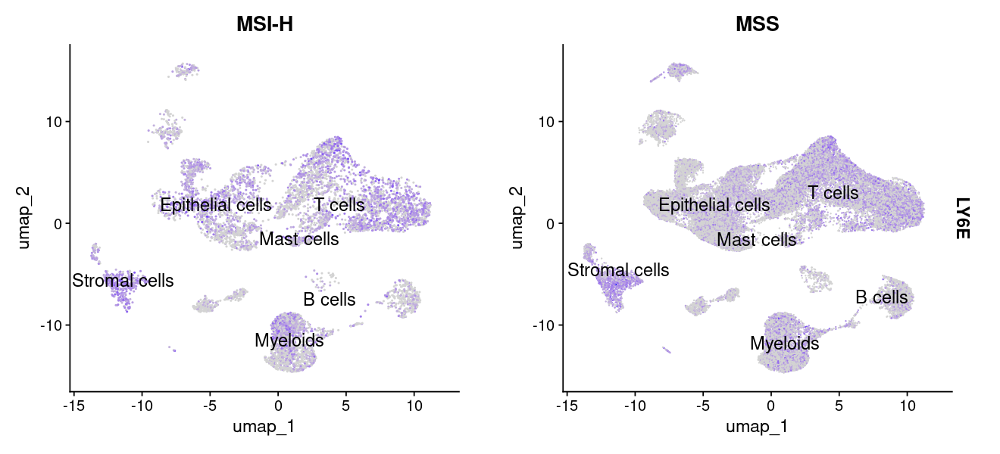

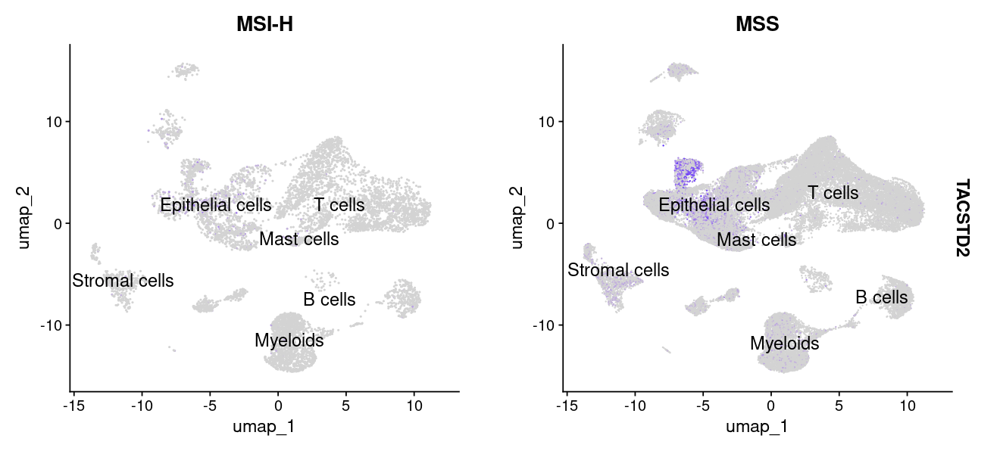

In [25]:
options(repr.plot.width = 11, repr.plot.height = 5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LY6E', 'TACSTD2')){
  
  print(FeaturePlot(subset(seu_obj_filtered, Class == 'Tumor'), split.by = 'MSI', features = gene, label = T, label.size = 5))
  
}

Warning message:
"All cells have the same value (0) of "LY6G6D""


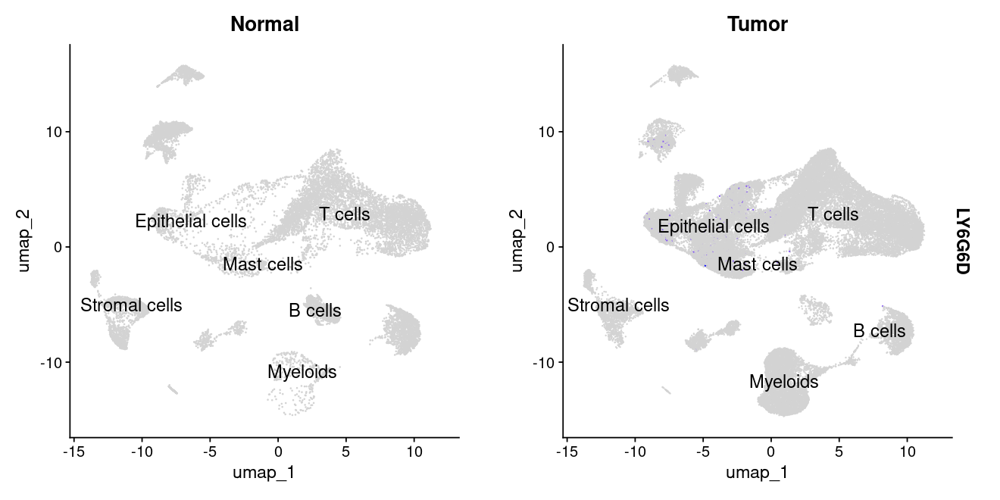

In [20]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LY6G6D')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

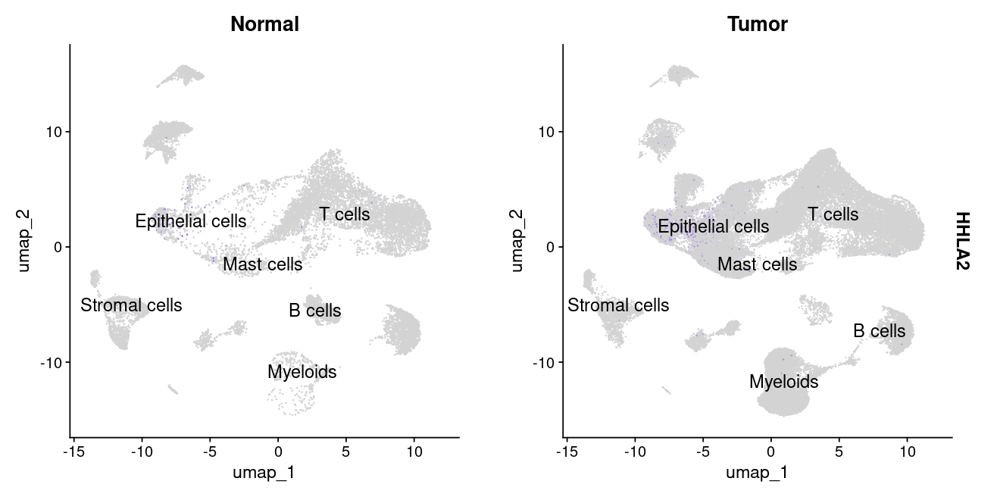

In [17]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'HHLA2')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

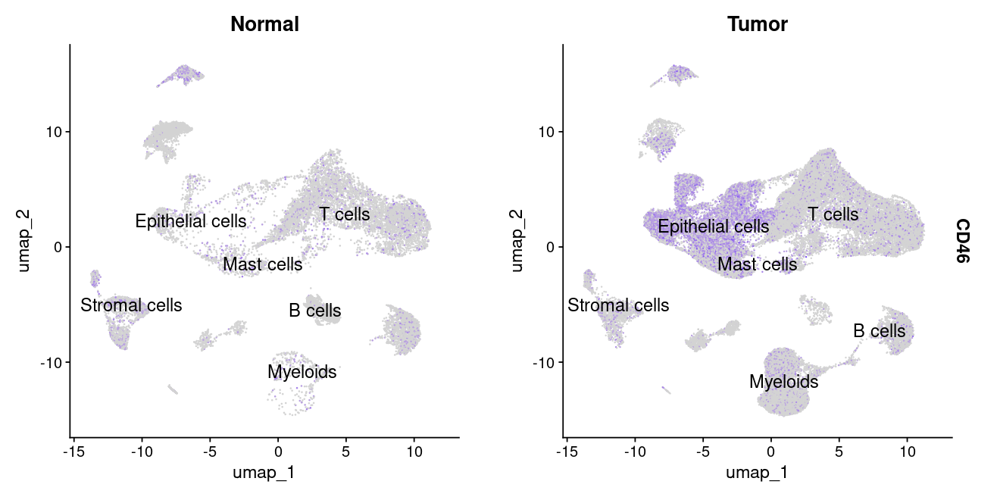

In [21]:
options(repr.plot.width = 11, repr.plot.height = 5.5)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'CD46')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class', , label = T, label.size = 5))
  
}

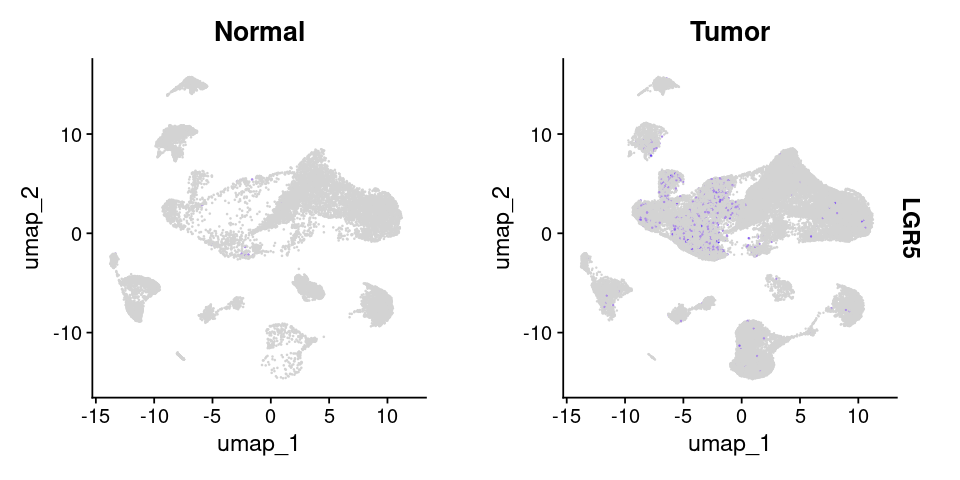

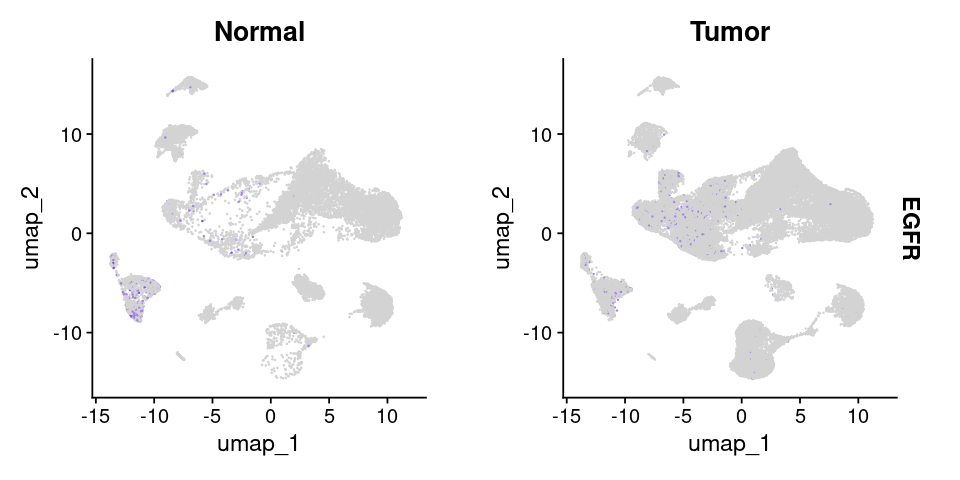

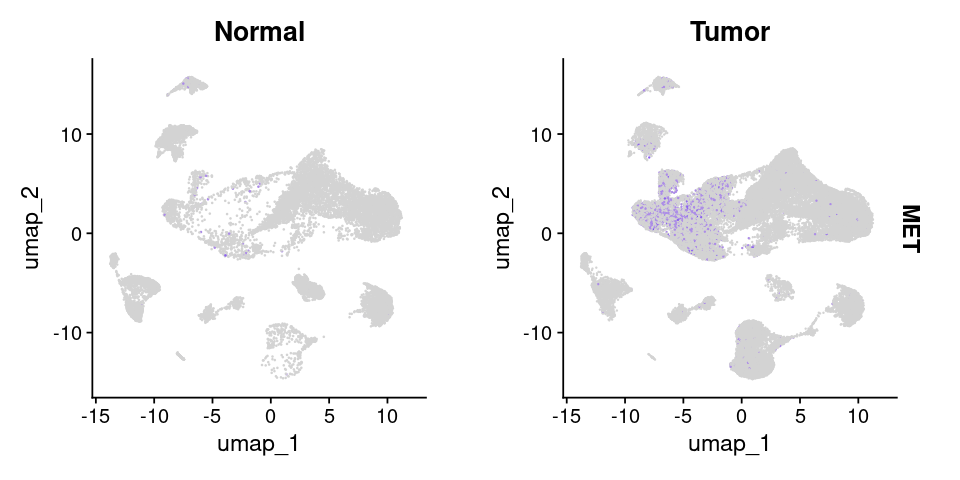

In [13]:
options(repr.plot.width = 8, repr.plot.height = 4)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'LGR5', 'EGFR', 'MET')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class'))
  
}

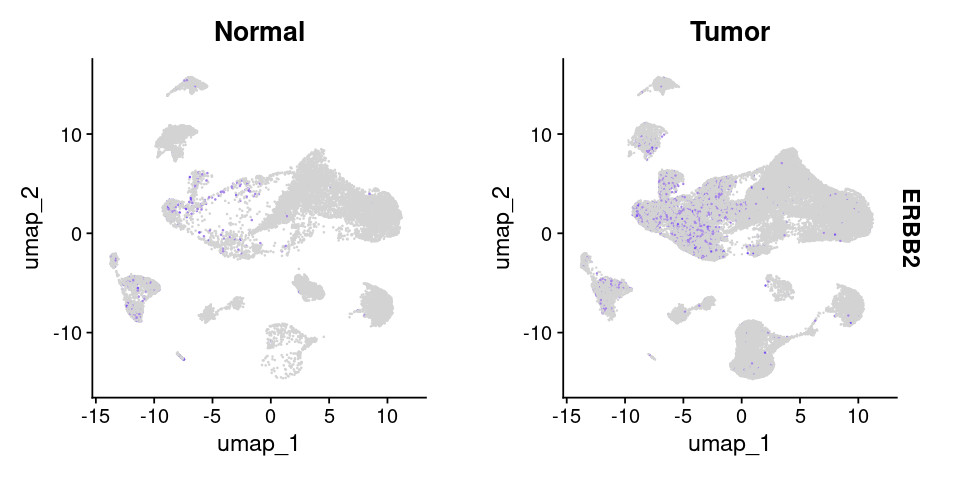

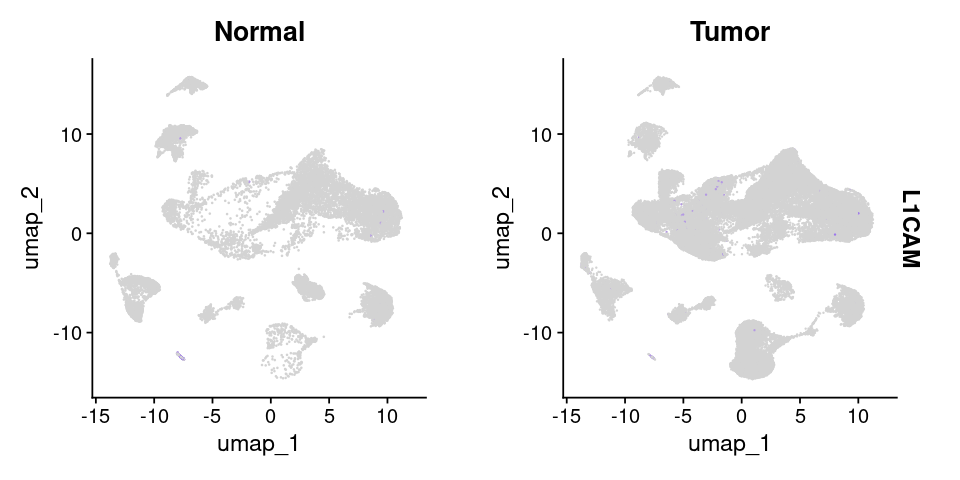

In [17]:
options(repr.plot.width = 8, repr.plot.height = 4)

# seu_obj_filtered$Disease_type <- factor(seu_obj_filtered$Disease_type, levels = c('Normal', 'pRCC', 'ccRCC', 'chRCC'))

for(gene in  c( 'ERBB2', 'L1CAM')){
  
  print(FeaturePlot(seu_obj_filtered, features = gene, split.by = 'Class'))
  
}

In [19]:
gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")

gene_of_interest <- 'L1CAM'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


In [23]:
options(repr.plot.width = 18, repr.plot.height = 7)

df.Normal <- df %>% filter((Class == 'Normal') & (Gene_cat == 'Positive') ) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame()

df.Normal$Cell_type <- 'Normal'

df.Cancer <- df %>% filter((Class == 'Tumor') & (Gene_cat == 'Positive')) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame() 
df.Cancer$Cell_type <- 'Tumor'

cell.sorted <- levels(df.Cancer$Cell_type)

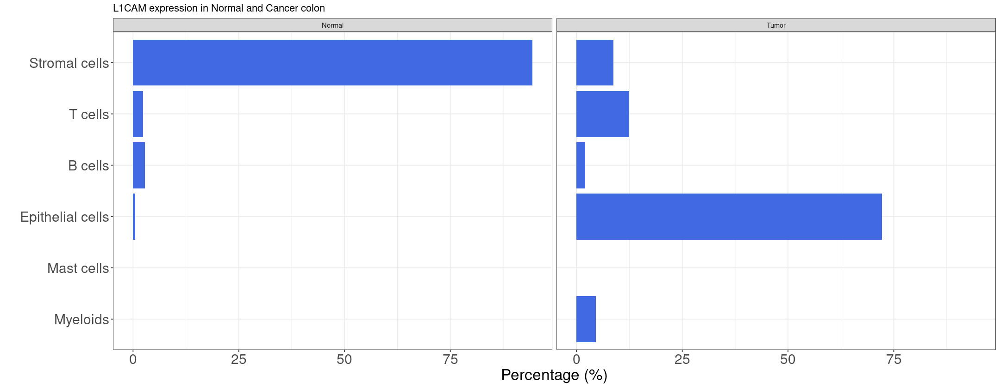

In [24]:
plot.df <- rbind(df.Normal, df.Cancer) %>% filter(Var2 == 'Positive') %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + facet_wrap(~Cell_type) +
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in Normal and Cancer colon'),
        x = "",
        y = "Percentage (%)")


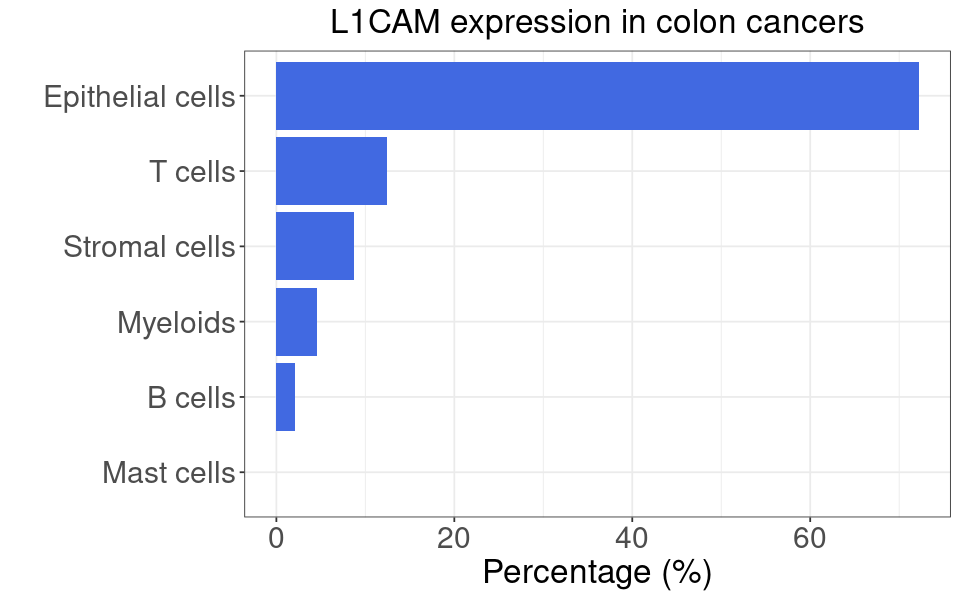

In [25]:
options(repr.plot.width = 8, repr.plot.height = 5)
df.Cancer$Freq <- df.Cancer$Freq * 100
df.Cancer <- df.Cancer %>% arrange(Freq)
cell.sorted2 <- unique(df.Cancer$Var1)
df.Cancer$Var1 <- factor(df.Cancer$Var1, levels = cell.sorted2)


ggplot(df.Cancer, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') +
coord_flip() +
    labs(title = glue('{gene_of_interest} expression in colon cancers'),
        x = "",
        y = "Percentage (%)") +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), plot.title = element_text(size = 20, hjust = 0.5), 
          legend.position="none") 


In [26]:
df.Cancer

Var1,Var2,Freq,Cell_type
<fct>,<fct>,<dbl>,<chr>
Mast cells,Positive,0.000000,Tumor
B cells,Positive,2.074689,Tumor
Myeloids,Positive,4.564315,Tumor
Stromal cells,Positive,8.713693,Tumor
T cells,Positive,12.448133,Tumor
Epithelial cells,Positive,72.199170,Tumor


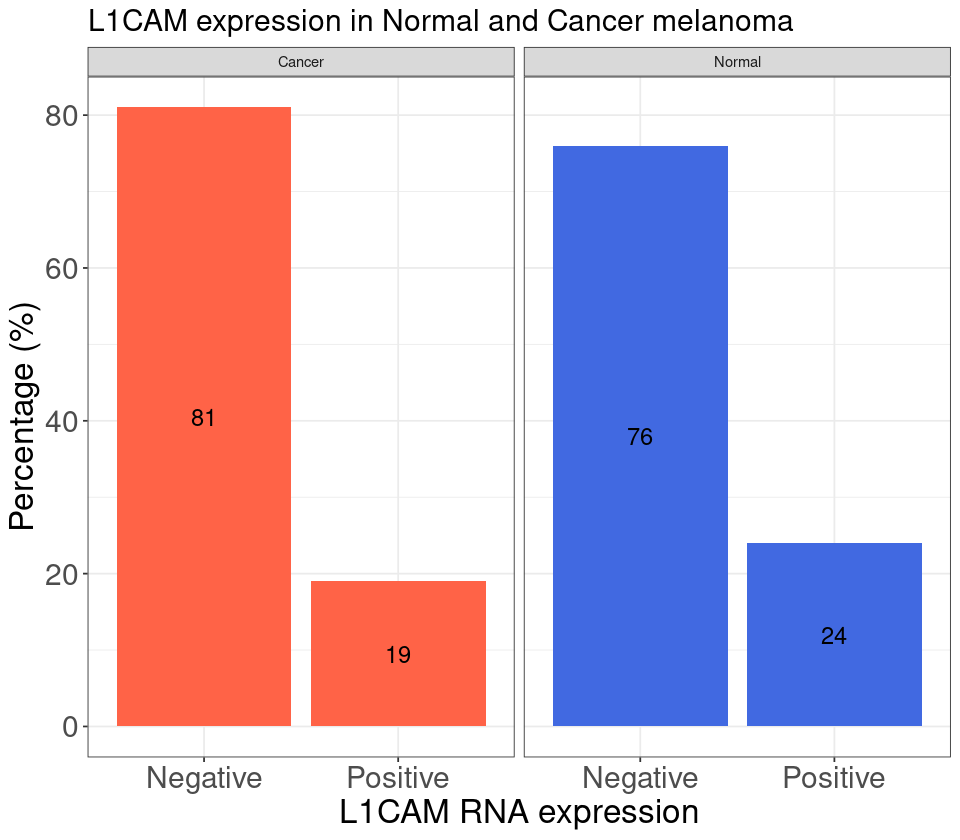

In [65]:
# Check the percentage of melanoma cancer cells expressing the gene
options(repr.plot.width = 8, repr.plot.height = 7)
# df.melanoma <-
df.m1 <- df %>% filter((bpe_cellType == 'Epithelial cells') & (Class == 'Normal')) %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()
df.m1$Class <- 'Normal'

df.m2 <- df %>% filter((bpe_cellType == 'Epithelial cells') & (Class == 'Cancer')) %>% {table(.$Gene_cat)} %>% 
prop.table() %>% as.data.frame()
df.m2$Class <- 'Cancer'
plot.df2 <- rbind(df.m1, df.m2)
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, fill = Class, label = Freq)) +
geom_bar(stat = 'identity') + facet_wrap(~Class) +
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          plot.title = element_text(size=18),
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in Normal and Cancer melanoma'),
        x = glue("{gene_of_interest} RNA expression"),
        y = "Percentage (%)")

In [14]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LGR5',  'EGFR', 'MET')

cnt <- GetAssayData(object = seu_obj_filtered, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(seu_obj_filtered@meta.data, cnt, by = 'row.names')
head(df, 2)

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


,Row.names,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,⋯,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5,SCT_snn_res.1,SCT_snn_res.2,LGR5,EGFR,MET
,<I<chr>>,<fct>,<dbl>,<int>,<chr>,<fct>,<chr>,<fct>,<chr>,<dbl>,⋯,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<dbl>,<dbl>
1,SMC01.N_AAACCTGGTGTAATGA,SMC01.N,2988,953,SMC01,Normal,SMC01-N,T cells,CD4+ T cells,5.321285,⋯,0,2,2,2,0,1,2,0,0,0
2,SMC01.N_AAACCTGTCACCTCGT,SMC01.N,5733,1484,SMC01,Normal,SMC01-N,T cells,CD4+ T cells,2.145474,⋯,0,2,2,2,0,1,2,0,0,0


In [19]:

df.sub <- df %>% filter((Cell_type == 'Epithelial cells') & (Class == 'Tumor'))
write.table(df.sub, "data/count_matrix.select_gene_exp.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

In [18]:
table(df$Class)


Normal  Tumor 
 16385  47253 

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


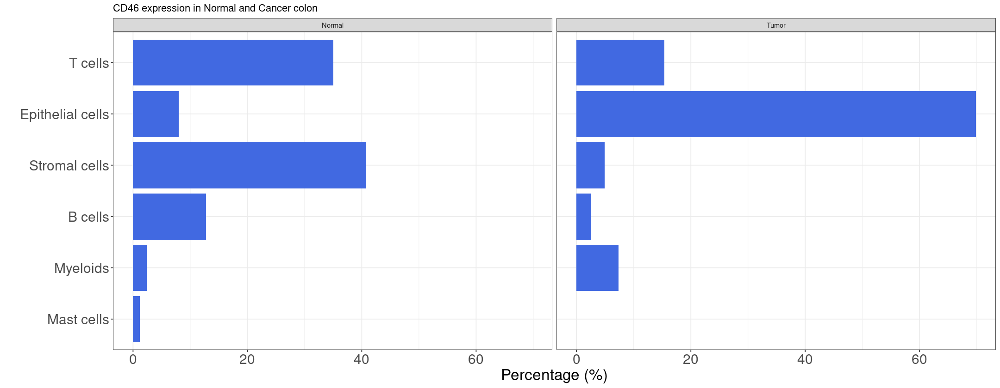

In [11]:
options(repr.plot.width = 18, repr.plot.height = 7)
gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")

gene_of_interest <- 'CD46'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')



df.Normal <- df %>% filter((Class == 'Normal') & (Gene_cat == 'Positive') ) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame()

df.Normal$Cell_type <- 'Normal'

df.Cancer <- df %>% filter((Class == 'Tumor') & (Gene_cat == 'Positive')) %>% {table( .$Cell_type, .$Gene_cat)} %>% 
prop.table() %>% as.data.frame() 
df.Cancer$Cell_type <- 'Tumor'

cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- rbind(df.Normal, df.Cancer) %>% filter(Var2 == 'Positive') %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + facet_wrap(~Cell_type) +
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in Normal and Cancer colon'),
        x = "",
        y = "Percentage (%)")


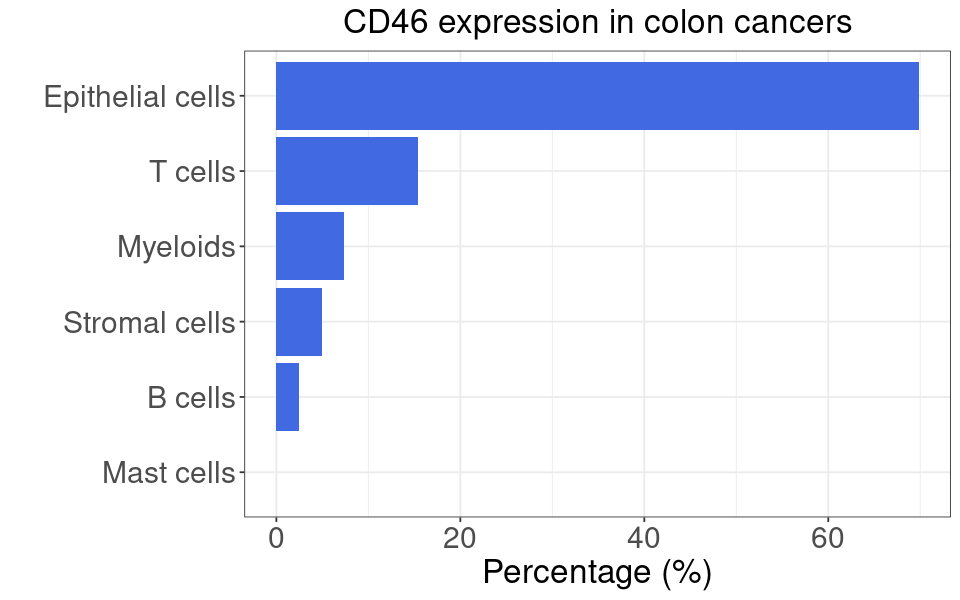

In [12]:
options(repr.plot.width = 8, repr.plot.height = 5)
df.Cancer$Freq <- df.Cancer$Freq * 100
df.Cancer <- df.Cancer %>% arrange(Freq)
cell.sorted2 <- unique(df.Cancer$Var1)
df.Cancer$Var1 <- factor(df.Cancer$Var1, levels = cell.sorted2)


ggplot(df.Cancer, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') +
coord_flip() +
    labs(title = glue('{gene_of_interest} expression in colon cancers'),
        x = "",
        y = "Percentage (%)") +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), plot.title = element_text(size = 20, hjust = 0.5), 
          legend.position="none") 

In [16]:
head(df)

,Row.names,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,⋯,nFeature_SCT,SCT_snn_res.0.2,seurat_clusters,SCT_snn_res.0.3,SCT_snn_res.0.4,SCT_snn_res.0.5,SCT_snn_res.1,SCT_snn_res.2,Gene_exp,Gene_cat
,<I<chr>>,<fct>,<dbl>,<int>,<chr>,<fct>,<chr>,<fct>,<chr>,<dbl>,⋯,<int>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>,<dbl>,<chr>
1,SMC01.N_AAACCTGGTGTAATGA,SMC01.N,2988,953,SMC01,Normal,SMC01-N,T cells,CD4+ T cells,5.321285,⋯,953,0,2,2,2,0,1,2,0.0000000,Negative
2,SMC01.N_AAACCTGTCACCTCGT,SMC01.N,5733,1484,SMC01,Normal,SMC01-N,T cells,CD4+ T cells,2.145474,⋯,1484,0,2,2,2,0,1,2,0.6931472,Positive
3,SMC01.N_AAACGGGCAACACCTA,SMC01.N,2582,500,SMC01,Normal,SMC01-N,B cells,IgA+ Plasma,15.143300,⋯,524,8,9,9,9,11,8,9,0.0000000,Negative
4,SMC01.N_AAACGGGCAAGCCGTC,SMC01.N,7384,1022,SMC01,Normal,SMC01-N,B cells,IgA+ Plasma,6.635970,⋯,963,8,9,9,9,11,8,9,0.0000000,Negative
5,SMC01.N_AAACGGGCAGCGTCCA,SMC01.N,2336,834,SMC01,Normal,SMC01-N,Mast cells,Mast cells,8.604452,⋯,835,17,42,19,19,22,31,42,0.0000000,Negative
6,SMC01.N_AAAGATGAGGACTGGT,SMC01.N,2394,910,SMC01,Normal,SMC01-N,T cells,CD8+ T cells,6.850459,⋯,911,1,1,0,0,4,0,1,0.0000000,Negative


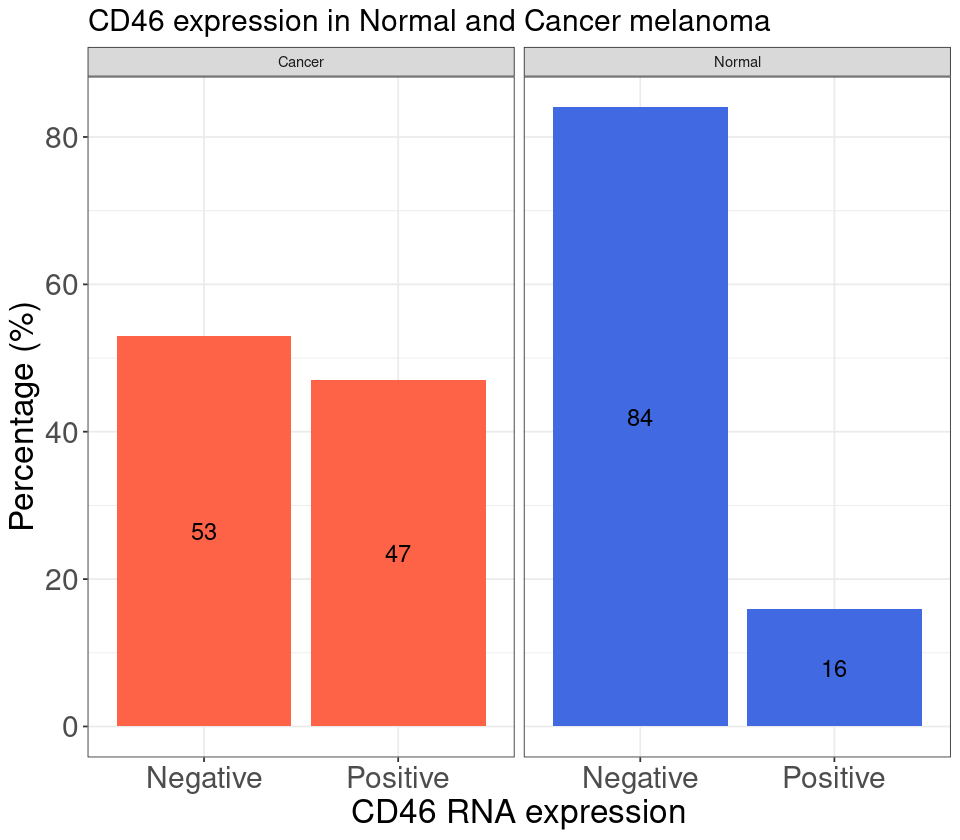

In [18]:
# Check the percentage of melanoma cancer cells expressing the gene
options(repr.plot.width = 8, repr.plot.height = 7)
# df.melanoma <-
df.m1 <- df %>% filter((Cell_type == 'Epithelial cells') & (Class == 'Normal')) %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()
df.m1$Class <- 'Normal'

df.m2 <- df %>% filter((Cell_type == 'Epithelial cells') & (Class == 'Tumor')) %>% {table(.$Gene_cat)} %>% 
prop.table() %>% as.data.frame()
df.m2$Class <- 'Cancer'
plot.df2 <- rbind(df.m1, df.m2)
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, fill = Class, label = Freq)) +
geom_bar(stat = 'identity') + facet_wrap(~Class) +
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          plot.title = element_text(size=18),
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in Normal and Cancer melanoma'),
        x = glue("{gene_of_interest} RNA expression"),
        y = "Percentage (%)")

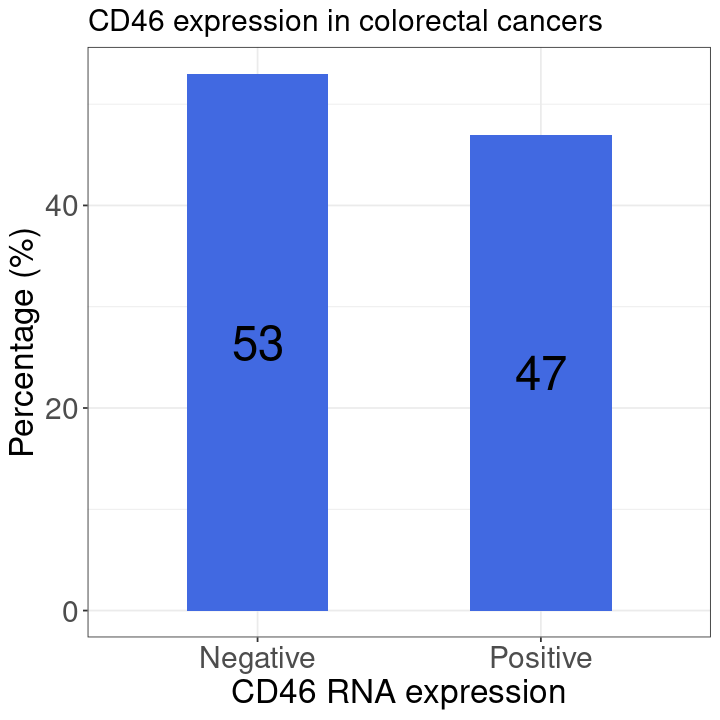

In [29]:
# Check the percentage of melanoma cancer cells expressing the gene
options(repr.plot.width = 6, repr.plot.height = 6)

df.m2 <- df %>% filter((Cell_type == 'Epithelial cells') & (Class == 'Tumor')) %>% {table(.$Gene_cat)} %>% 
prop.table() %>% as.data.frame()
df.m2$Class <- 'Cancer'
plot.df2 <- df.m2
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue', width = 0.5) + 
geom_text(size = 10, position = position_stack(vjust = 0.5)) +
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          plot.title = element_text(size=18),
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in colorectal cancers'),
        x = glue("{gene_of_interest} RNA expression"),
        y = "Percentage (%)")

In [20]:
df.m2

Var1,Freq,Class
<fct>,<dbl>,<chr>
Negative,0.5334975,Cancer
Positive,0.4665025,Cancer


In [30]:
table(df$Class)


Normal  Tumor 
 16385  47253 

In [34]:
length(df %>% filter(Class == 'Tumor') %>% pull(Sample) %>% unique())

[1] 23

In [35]:
length(df %>% filter(Class == 'Normal') %>% pull(Sample) %>% unique())

[1] 10

In [18]:
meta.df <- seu_obj_filtered@meta.data
head(meta.df, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


In [53]:
table(meta.df$Class)


Normal  Tumor 
 16385  47253 

In [54]:
table(meta.df$Cell_type)


         B cells Epithelial cells       Mast cells         Myeloids 
            9117            18532              187             6754 
   Stromal cells          T cells 
            5933            23115 

`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


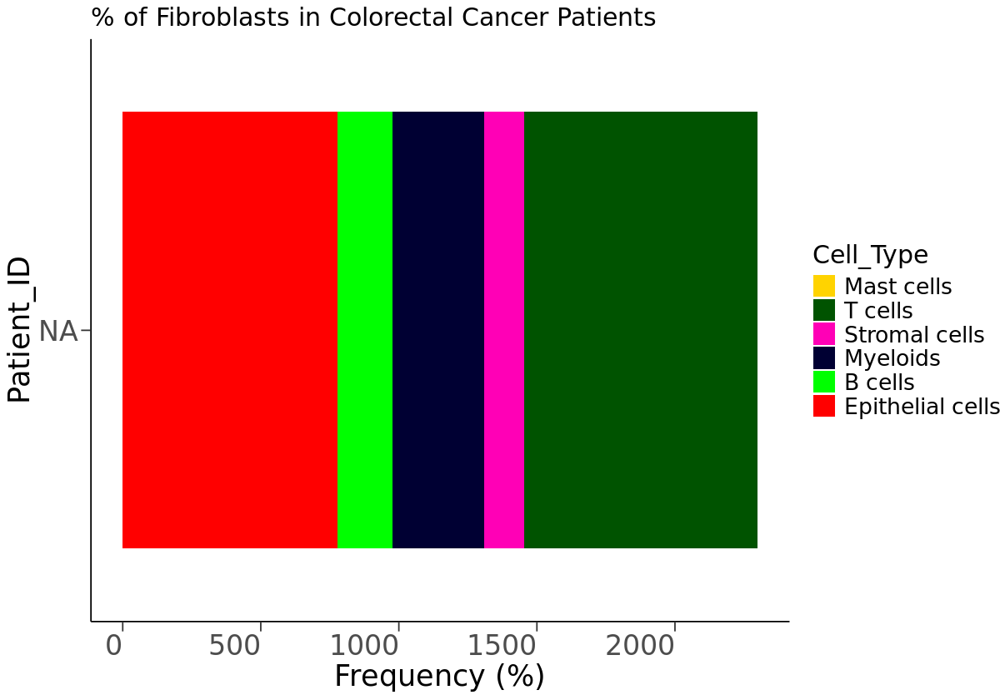

In [19]:

plot.df <- meta.df %>% filter(Class == 'Tumor') %>%  group_by(Patient, Cell_type) %>%
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))
plot.df$freq <- 100 * plot.df$freq

patients.sorted <- plot.df %>% filter(Cell_type == 'Myofibroblasts') %>% arrange(freq) %>% pull(Patient)
plot.df$Patient <- factor(plot.df$Patient, levels = patients.sorted)

options(repr.plot.width = 10, repr.plot.height = 7)
cell.types <- unique(plot.df$Cell_type)

cell.type.factors <- rev(unique(c('Myofibroblasts', 'Epithelial cells', cell.types)))

n_colors <- length(cell.type.factors)
colors <- rev(DiscretePalette(n_colors, palette = "glasbey"))
plot.df$Cell_type <- factor(plot.df$Cell_type, levels = cell.type.factors)

ggplot(plot.df, aes(x = Patient, y = freq, fill = Cell_type)) +
       geom_bar(stat = 'identity') + 
scale_fill_manual(name="Cell_Type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts in Colorectal Cancer Patients'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18)) 


In [60]:
table(meta.df$Cell_subtype, meta.df$Cell_type)

                           
                            B cells Epithelial cells Mast cells Myeloids
  CD19+CD20+ B                 3733                0          0        0
  CD4+ T cells                    0                0          0        0
  CD8+ T cells                    0                0          0        0
  cDC                             0                0          0      482
  CMS1                            0             1201          0        0
  CMS2                            0            10768          0        0
  CMS3                            0             5484          0        0
  CMS4                            0               11          0        0
  Enteric glial cells             0                0          0        0
  gamma delta T cells             0                0          0        0
  Goblet cells                    0              139          0        0
  IgA+ Plasma                  3540                0          0        0
  IgG+ Plasma          

`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


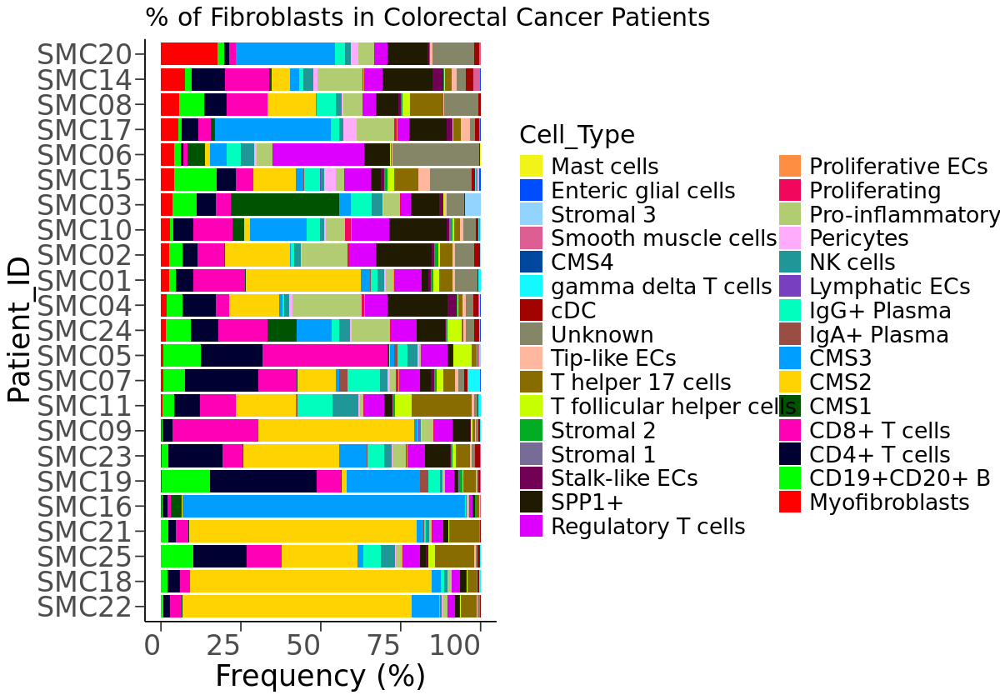

In [33]:
meta.df <- seu_obj_filtered@meta.data
plot.df <- meta.df %>% filter(Class == 'Tumor') %>%  group_by(Patient, Cell_subtype) %>%
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))
plot.df$freq <- 100 * plot.df$freq

patients.sorted <- plot.df %>% filter(Cell_subtype == 'Myofibroblasts') %>% arrange(freq) %>% pull(Patient)
plot.df$Patient <- factor(plot.df$Patient, levels = patients.sorted)

options(repr.plot.width = 10, repr.plot.height = 7)
cell.types <- unique(plot.df$Cell_subtype)

cell.type.factors <- rev(unique(c('Myofibroblasts', 'Epithelial cells', cell.types)))

n_colors <- length(cell.type.factors)
colors <- rev(DiscretePalette(n_colors, palette = "glasbey"))
plot.df$Cell_subtype <- factor(plot.df$Cell_subtype, levels = cell.type.factors)

ggplot(plot.df, aes(x = Patient, y = freq, fill = Cell_subtype)) +
       geom_bar(stat = 'identity') + 
scale_fill_manual(name="Cell_Type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts in Colorectal Cancer Patients'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18)) 


`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


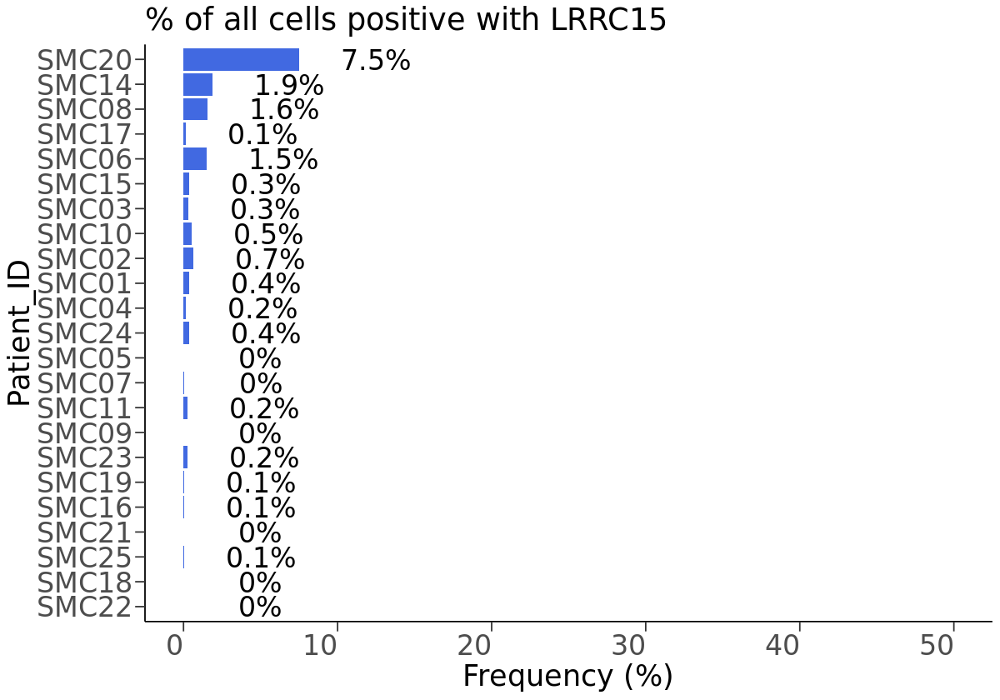

In [34]:
gene_exp <- GetAssayData(object = subset(seu_obj_filtered, Class == 'Tumor'), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(subset(seu_obj_filtered, Class == 'Tumor')@meta.data, gene_exp_sub, by = 'row.names')
# df.Cancer <- df %>% filter(celltype_major !='Normal Epithelial') %>% filter(Gene_cat == 'Positive') %>% {table( .$celltype_major)} %>% 
# prop.table() %>% as.data.frame() %>% arrange(Freq)

tmp.df <- df %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n))
tmp.df <- tmp.df[, 'Patient', drop = F] %>% unique()

df.all.cells <- df %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n)) %>% filter(Gene_cat == 'Positive') 
df.all.cells <- merge(tmp.df, df.all.cells, by = 'Patient', all.x = T) %>% arrange(freq)
df.all.cells$freq[is.na(df.all.cells$freq)] <- 0
rio::export(df.all.cells, 'LRRC15_positivity_all_cells.CRC.csv')
# patients.sorted <- df.all.cells$Patient
df.all.cells$Patient <- factor(df.all.cells$Patient, levels = patients.sorted)
df.all.cells$freq <- df.all.cells$freq *100
df.all.cells$label <- paste0(round(df.all.cells$freq, 1), '%')

ggplot(df.all.cells, aes(x = Patient, y = freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(aes(label= label), nudge_y = 5, size = 7) +
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 50)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of all cells positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22))

`stat_bin()` using `bins = 30`. Pick better value with `binwidth`.


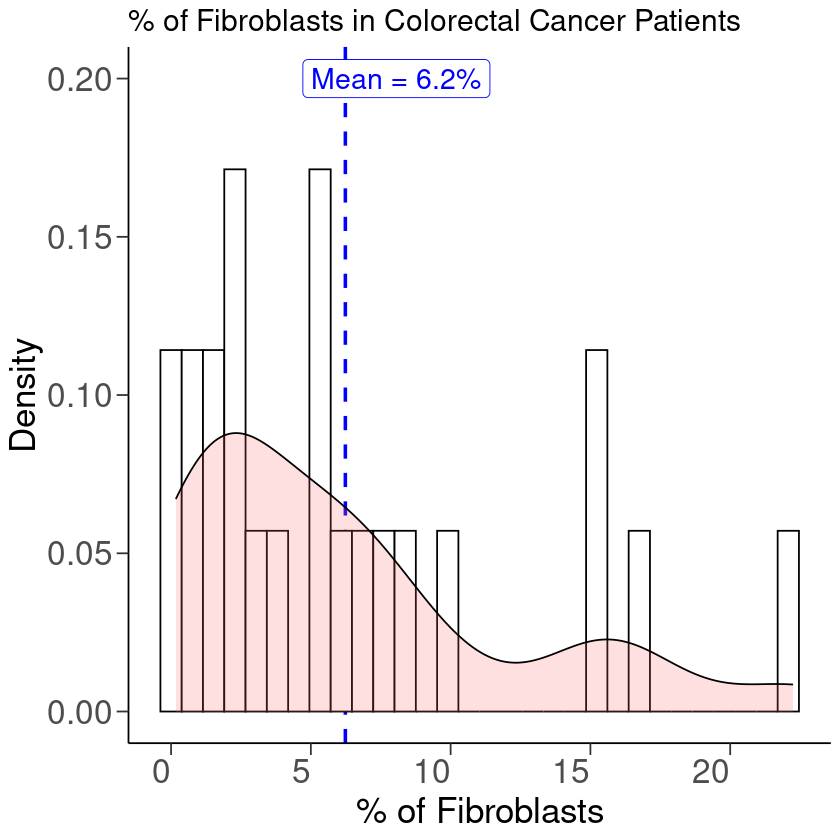

In [ ]:
options(repr.plot.width = 7, repr.plot.height = 7)

mean.firboblast <- round(mean(plot.df$freq[plot.df$Cell_type == 'Stromal cells']), 1)

plot.df %>% filter(Cell_type == 'Stromal cells') %>% ggplot( aes(x=freq)) + 
geom_vline(aes(xintercept=mean(freq)),
            color="blue", linetype="dashed", size=1) +
 geom_histogram(aes(y=..density..), colour="black", fill="white")+
 geom_density(alpha=.2, fill="#FF6666") +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts in Colorectal Cancer Patients'),
        x = "% of Fibroblasts",
        y = "Density") +
annotate("label", x = mean.firboblast * 1.3, y = 0.2, 
         label = glue('Mean = {mean.firboblast}%'), 
         colour = 'blue', size = 6) +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18)) 

In [10]:
summary(plot.df$freq[plot.df$Cell_type == 'Stromal cells']) %>% as.matrix() %>% t() %>% as.data.frame()

length(unique(plot.df$Patient))
meta.df %>% filter(Class == 'Tumor') %>% nrow()

Min.,1st Qu.,Median,Mean,3rd Qu.,Max.
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
0.1703578,1.835547,5.13766,6.234355,7.836065,22.24866


[1] 23

[1] 47253

In [21]:
seu_obj_cancer <- subset(seu_obj_filtered, Class == 'Tumor')

In [22]:
head(seu_obj_cancer@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<fct>,<chr>,<fct>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


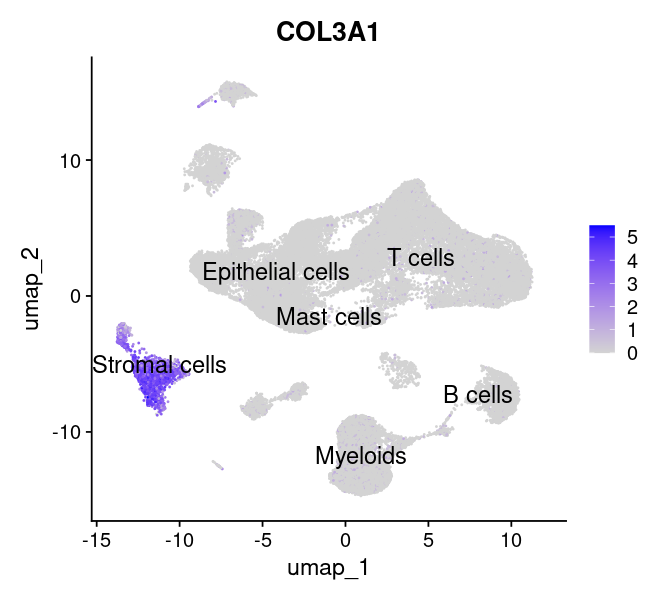

In [40]:
options(repr.plot.width = 5.5, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
# seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'COL3A1')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene,  label = T, label.size = 5))
  
}

Picking joint bandwidth of 0.0846

Picking joint bandwidth of 1.73e-06

Picking joint bandwidth of 0.0239

Picking joint bandwidth of 1.71e-06



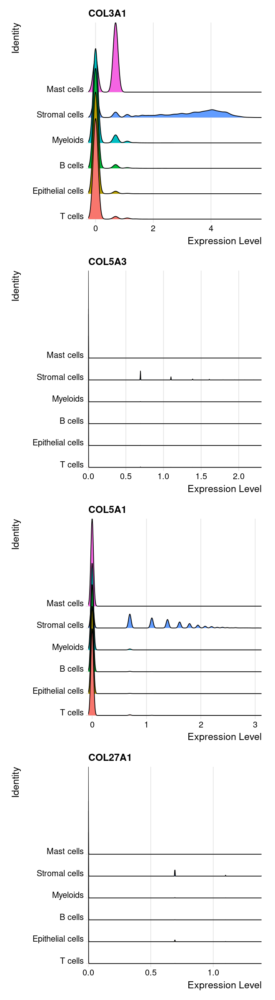

In [45]:
genes <- c('COL3A1', 'COL5A3', 'COL5A1', 'COL27A1')
options(repr.plot.width = 5.5, repr.plot.height = 20)
Idents(seu_obj_cancer) <- 'Cell_type'

RidgePlot(seu_obj_cancer, features = genes, ncol = 1)

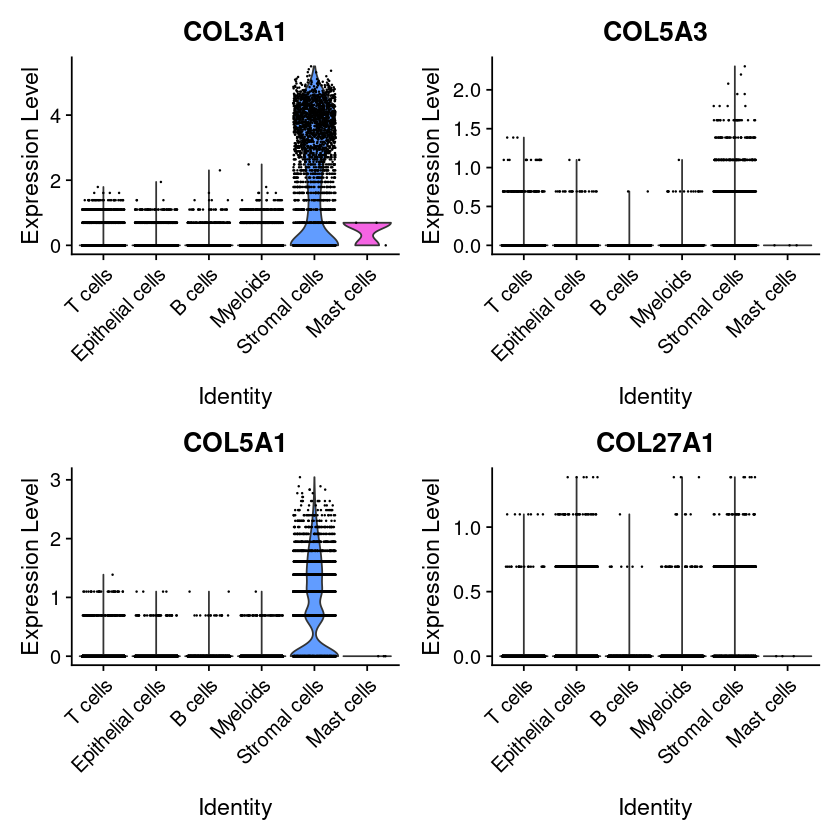

In [47]:

genes <- c('COL3A1', 'COL5A3', 'COL5A1', 'COL27A1')
options(repr.plot.width = 7, repr.plot.height = 7)
Idents(seu_obj_cancer) <- 'Cell_type'
VlnPlot(seu_obj_cancer, features = genes, ncol = 2)


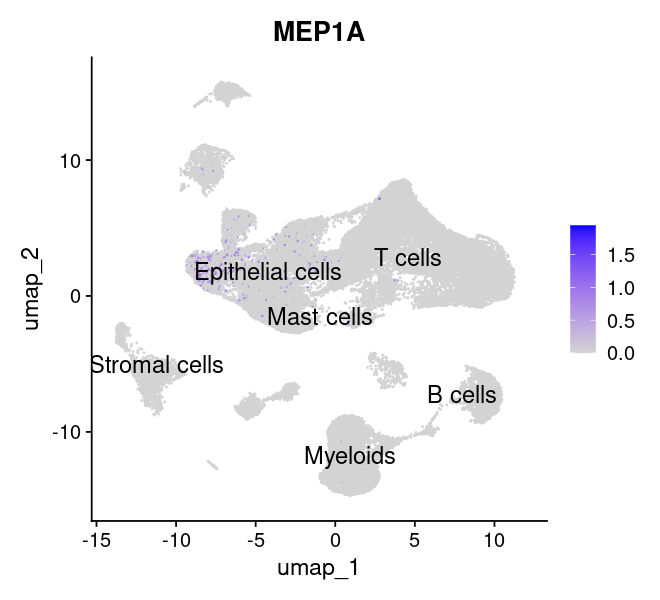

In [28]:
options(repr.plot.width = 5.5, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'MEP1A')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene,  label = T, label.size = 5))
  
}

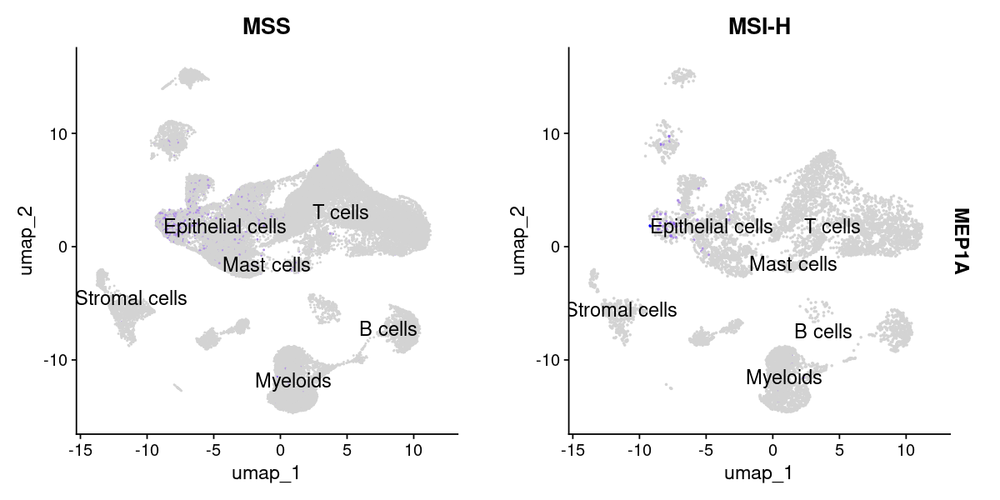

In [23]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'MEP1A')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

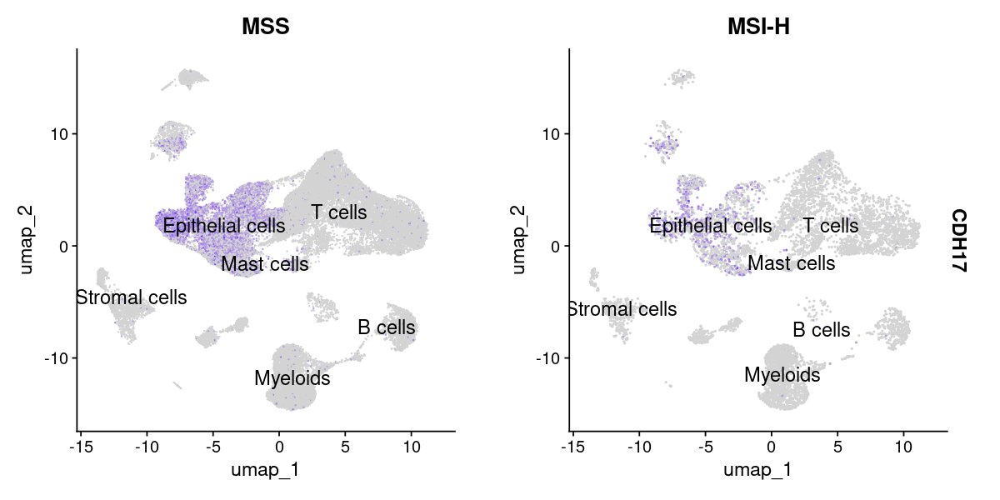

In [28]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'CDH17')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

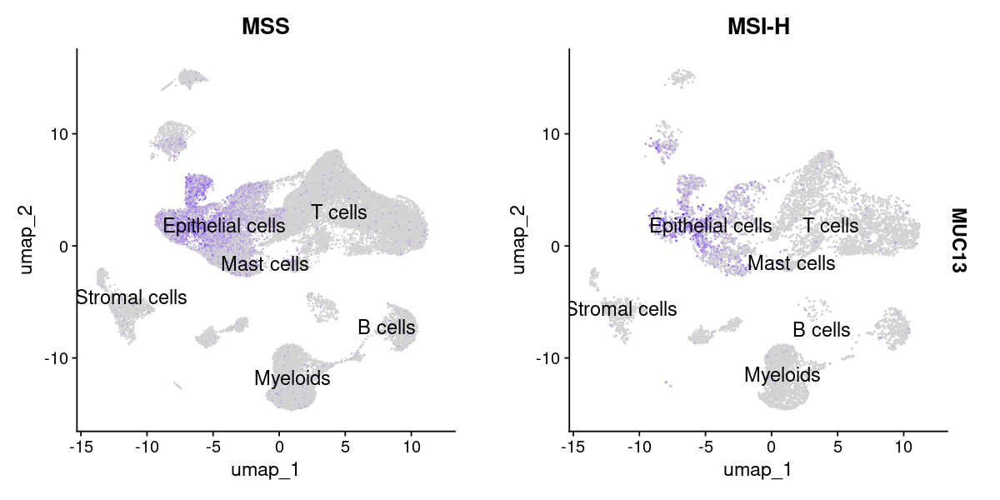

In [66]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'MUC13')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

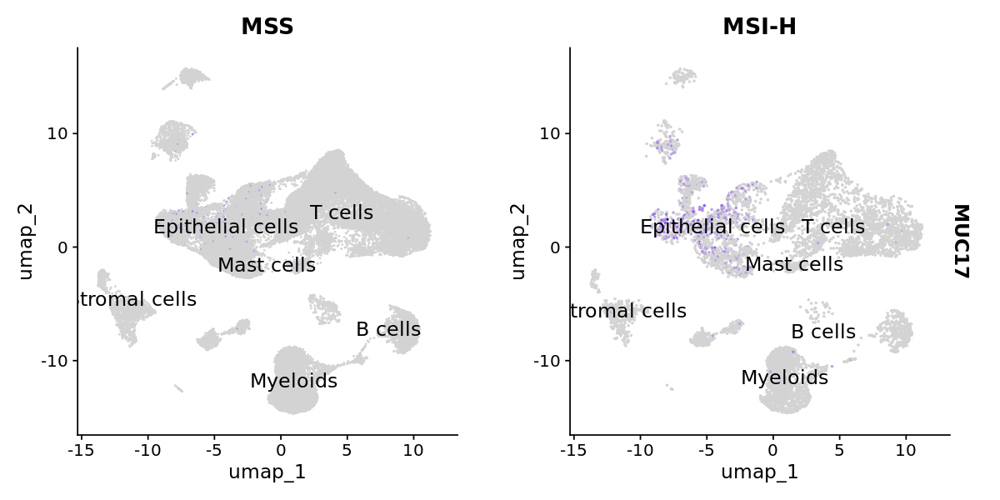

In [19]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$MSI <- factor(seu_obj_cancer$MSI, levels = c('MSS', 'MSI-H'))
for(gene in  c( 'MUC17')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

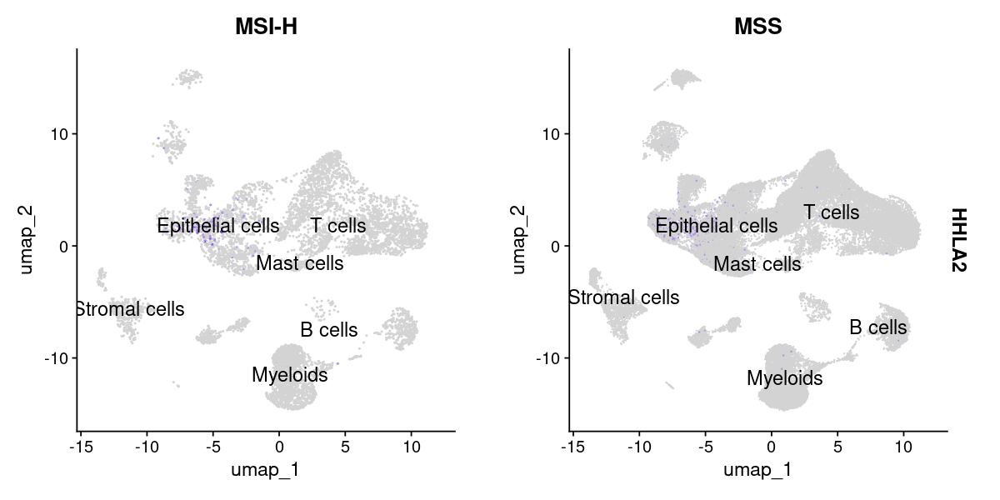

In [47]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
for(gene in  c( 'HHLA2')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

Warning message:
"All cells have the same value (0) of "LY6G6D""


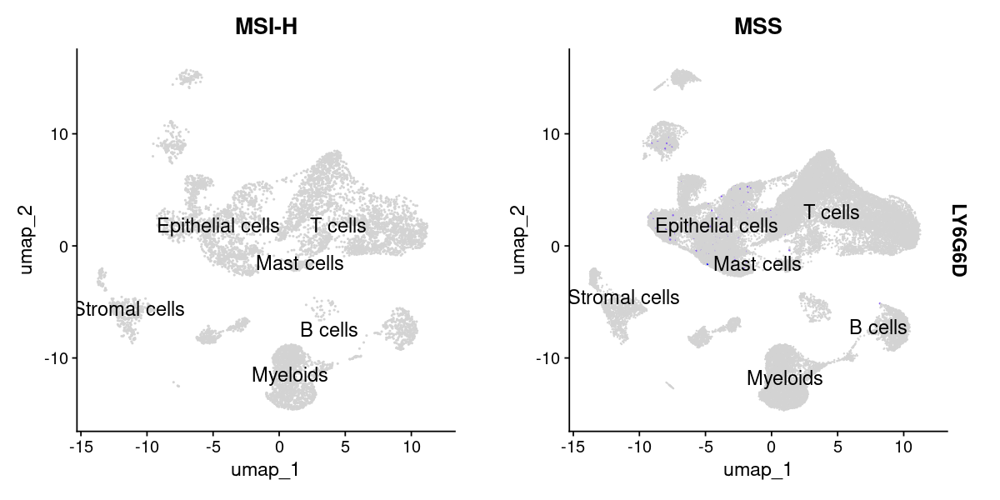

In [48]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
for(gene in  c( 'LY6G6D')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

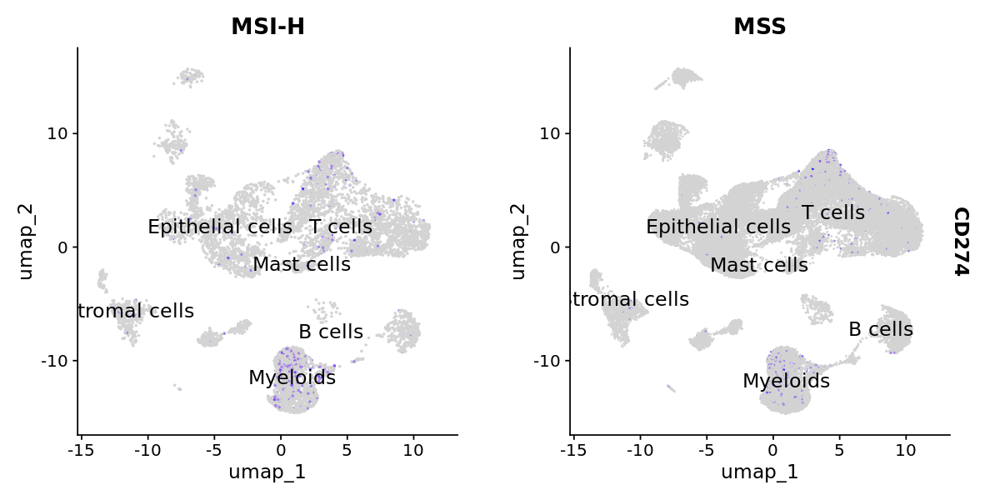

In [22]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
for(gene in  c( 'CD274')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

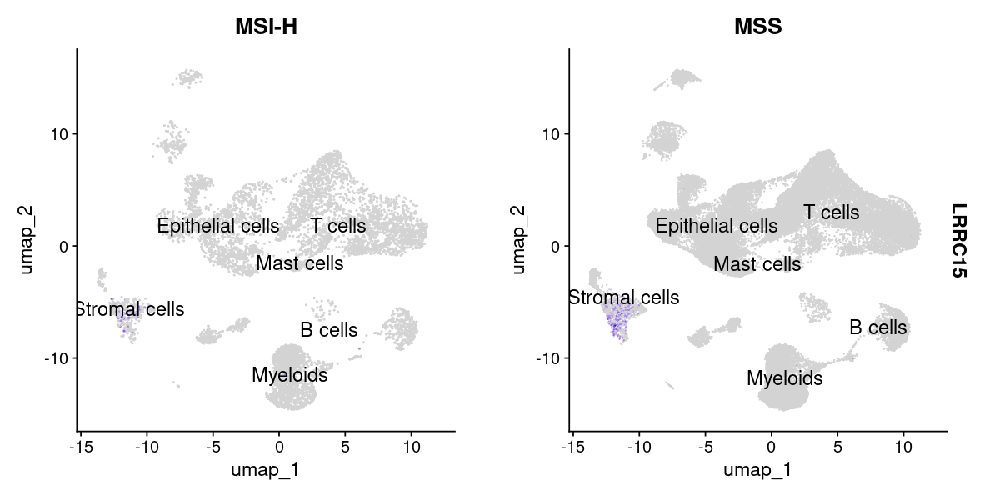

In [60]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
for(gene in  c( 'LRRC15')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5))
  
}

Warning message:
"ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps"


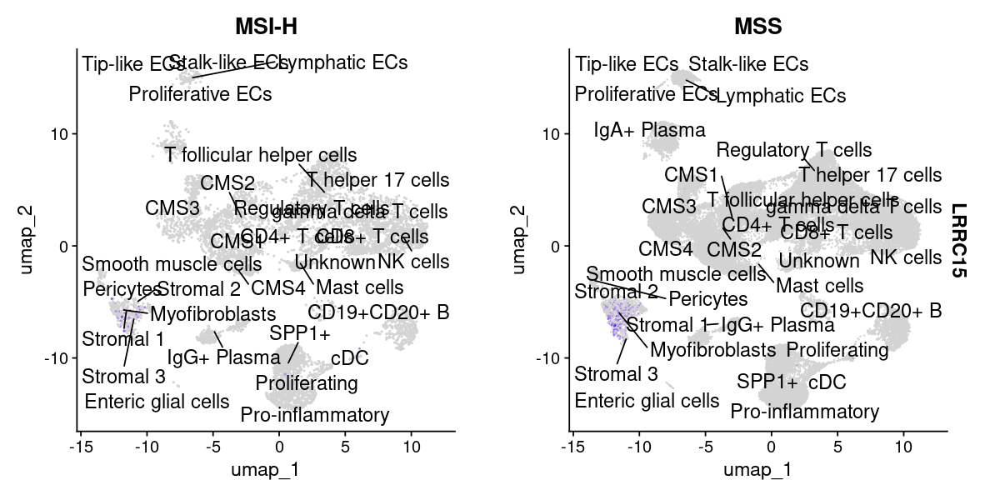

In [62]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_subtype'
for(gene in  c( 'LRRC15')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'MSI',  label = T, label.size = 5, repel = T))
  
}

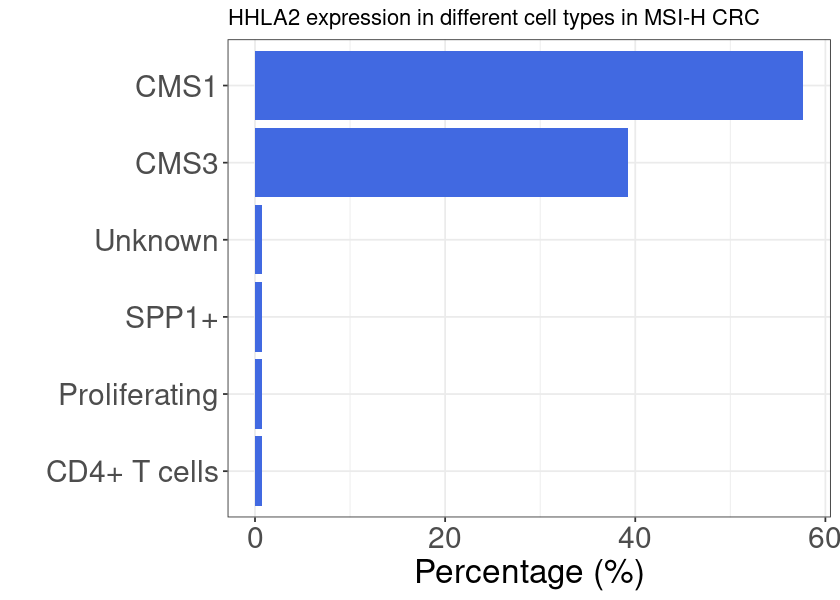

In [29]:
msi_status <- 'MSI-H'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, MSI == msi_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'HHLA2'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {msi_status} CRC'),
        x = "",
        y = "Percentage (%)")


In [21]:
plot.df

Var1,Freq
<fct>,<dbl>
CD4+ T cells,0.7692308
Proliferating,0.7692308
SPP1+,0.7692308
Unknown,0.7692308
CMS3,39.2307692
CMS1,57.6923077


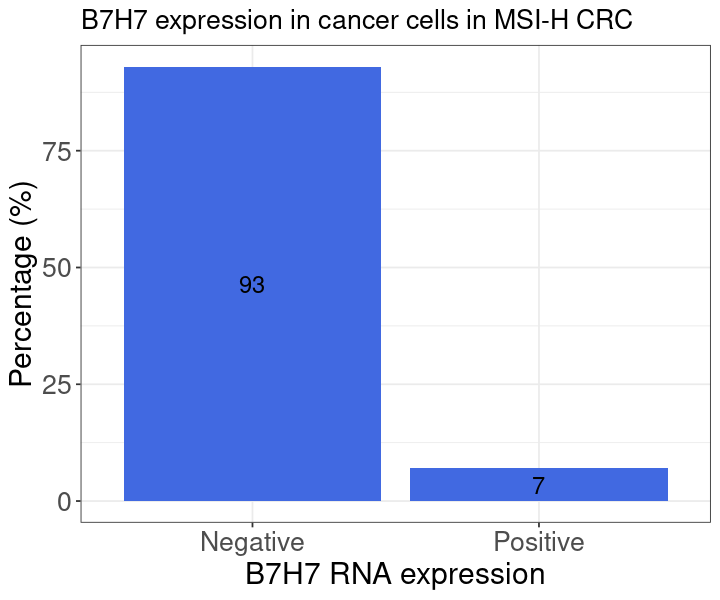

In [30]:
options(repr.plot.width = 6, repr.plot.height = 5)
# df.melanoma <-
msi_status <- 'MSI-H'

df.m1 <- df %>% filter(MSI == !!msi_status) %>% filter(Cell_type == 'Epithelial cells') %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()

plot.df2 <- df.m1
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),  
        axis.title.x = element_text( size = 18),
        axis.title.y = element_text(size = 18), 
          plot.title = element_text(size=16),
          legend.position="none") +
    labs(title = glue('B7H7 expression in cancer cells in {msi_status} CRC'),
        x = "B7H7 RNA expression",
        y = "Percentage (%)")

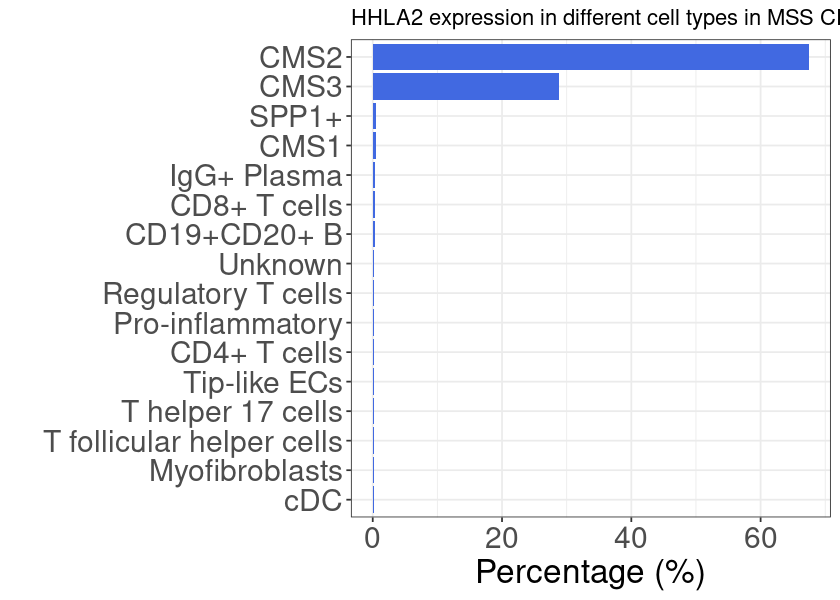

In [31]:
msi_status <- 'MSS'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, MSI == msi_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'HHLA2'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {msi_status} CRC'),
        x = "",
        y = "Percentage (%)")


In [27]:
plot.df

Var1,Freq
<fct>,<dbl>
cDC,0.1240695
Myofibroblasts,0.1240695
T follicular helper cells,0.1240695
T helper 17 cells,0.1240695
Tip-like ECs,0.1240695
CD4+ T cells,0.2481390
Pro-inflammatory,0.2481390
Regulatory T cells,0.2481390
Unknown,0.2481390


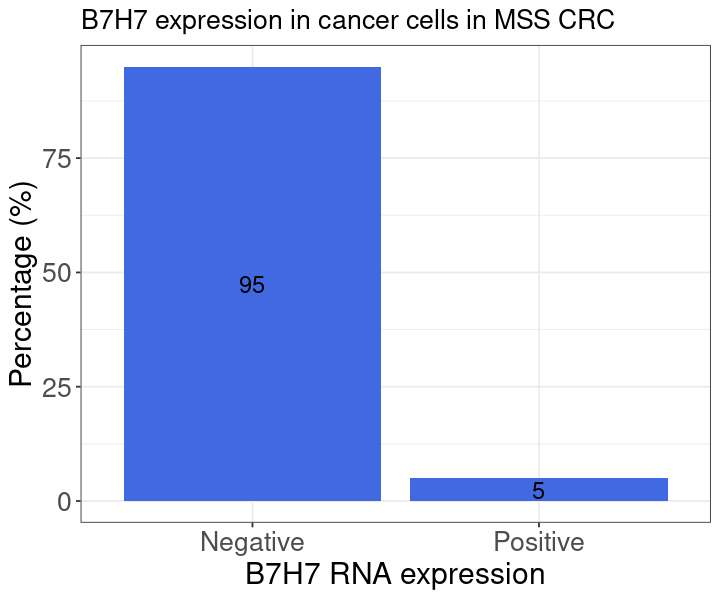

In [32]:
options(repr.plot.width = 6, repr.plot.height = 5)
# df.melanoma <-
msi_status <- 'MSS'

df.m1 <- df %>% filter(MSI == !!msi_status) %>% filter(Cell_type == 'Epithelial cells') %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()

plot.df2 <- df.m1
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),  
        axis.title.x = element_text( size = 18),
        axis.title.y = element_text(size = 18), 
          plot.title = element_text(size=16),
          legend.position="none") +
    labs(title = glue('B7H7 expression in cancer cells in {msi_status} CRC'),
        x = "B7H7 RNA expression",
        y = "Percentage (%)")

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


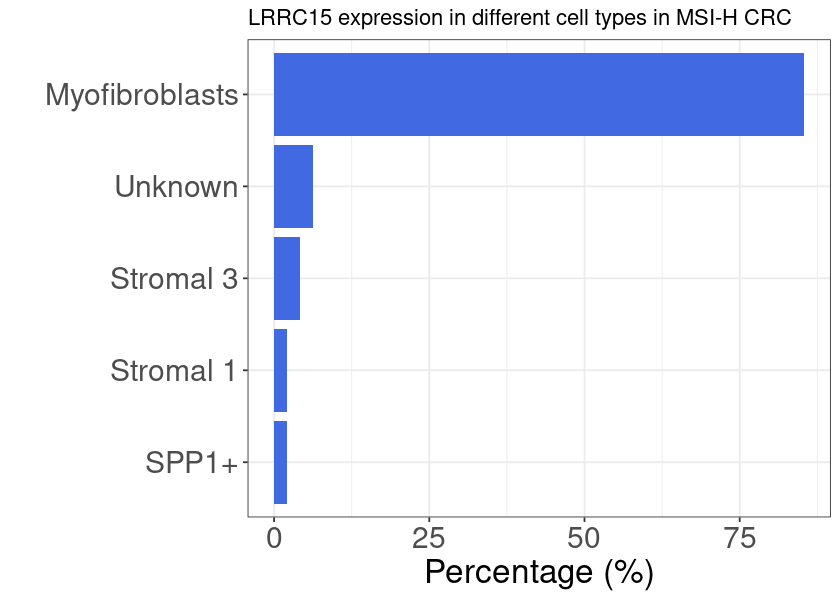

In [21]:
msi_status <- 'MSI-H'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, MSI == msi_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {msi_status} CRC'),
        x = "",
        y = "Percentage (%)")


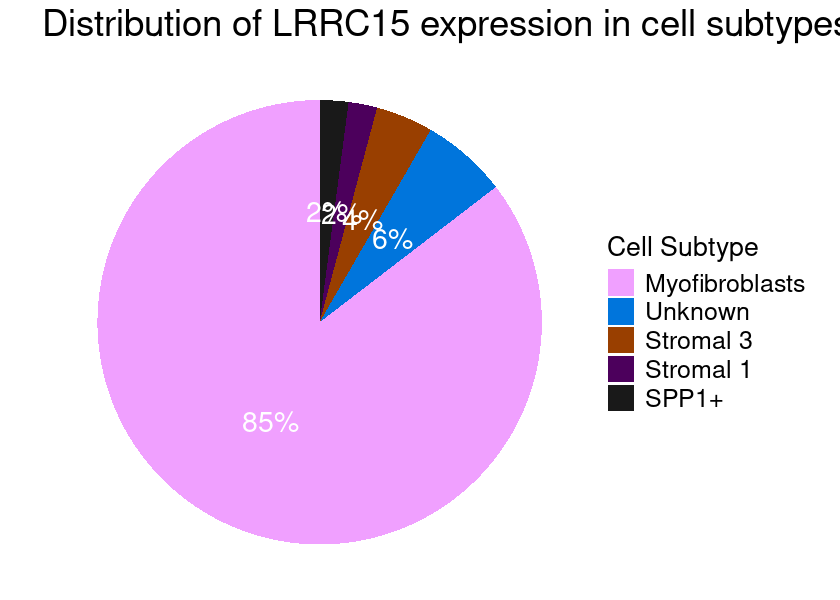

In [22]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

In [53]:
plot.df

Var1,Freq
<fct>,<dbl>
SPP1+,2.083333
Stromal 1,2.083333
Stromal 3,4.166667
Unknown,6.250000
Myofibroblasts,85.416667


Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


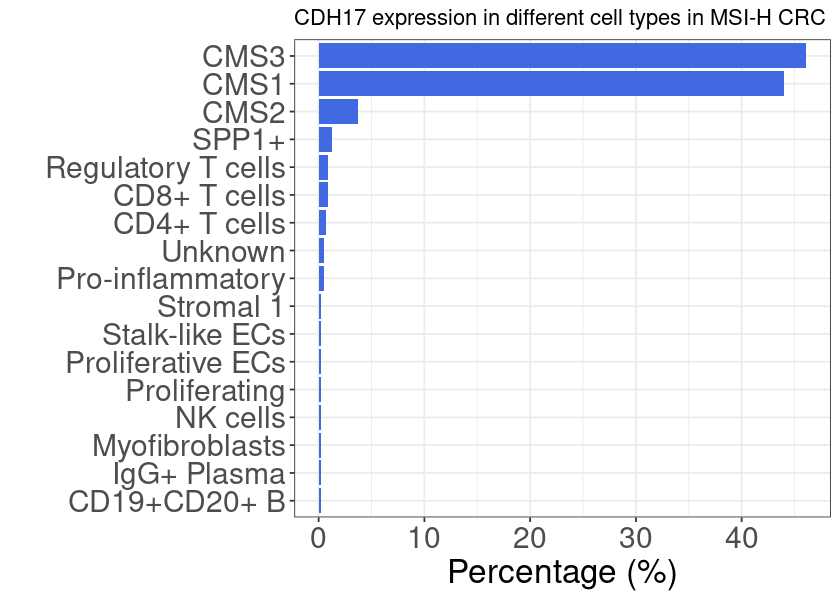

In [21]:
msi_status <- 'MSI-H'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, MSI == msi_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'CDH17'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {msi_status} CRC'),
        x = "",
        y = "Percentage (%)")


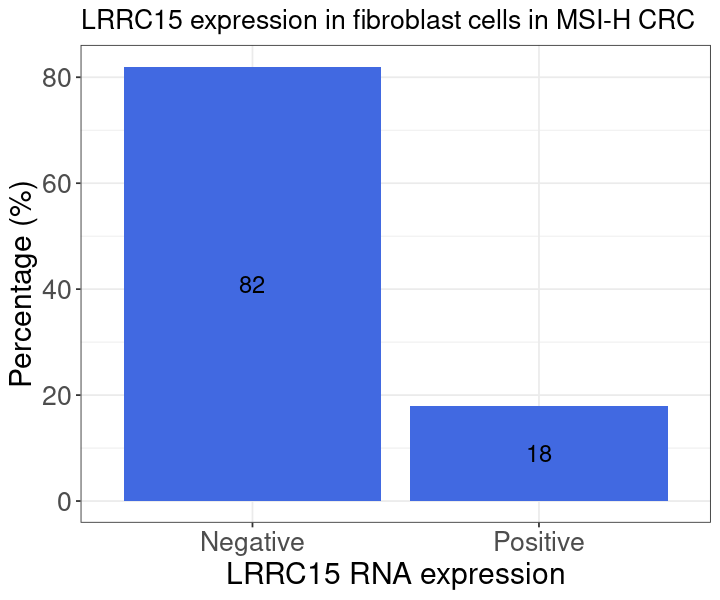

In [54]:
options(repr.plot.width = 6, repr.plot.height = 5)
# df.melanoma <-
msi_status <- 'MSI-H'

df.m1 <- df %>% filter(MSI == !!msi_status) %>% filter(Cell_subtype == 'Myofibroblasts') %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()

plot.df2 <- df.m1
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),  
        axis.title.x = element_text( size = 18),
        axis.title.y = element_text(size = 18), 
          plot.title = element_text(size=16),
          legend.position="none") +
    labs(title = glue('LRRC15 expression in fibroblast cells in {msi_status} CRC'),
        x = "LRRC15 RNA expression",
        y = "Percentage (%)")

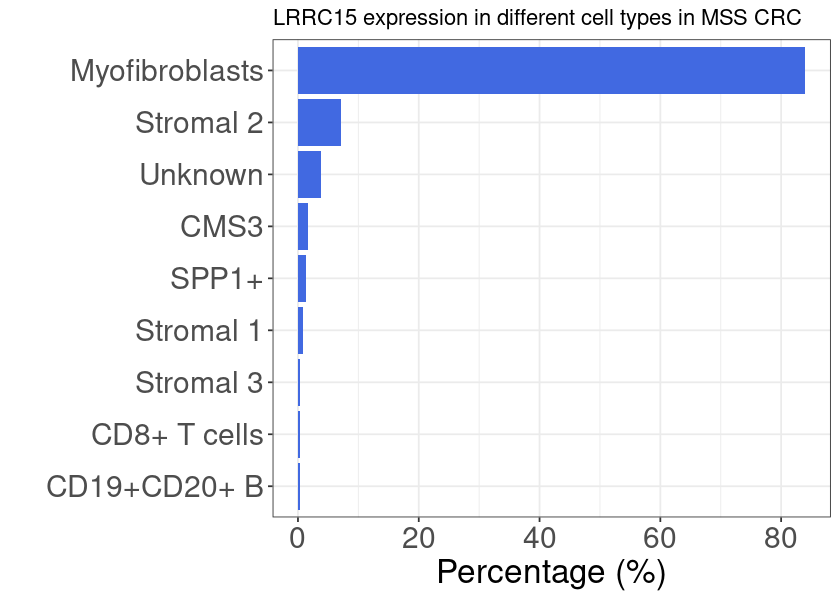

In [23]:
msi_status <- 'MSS'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, MSI == msi_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {msi_status} CRC'),
        x = "",
        y = "Percentage (%)")


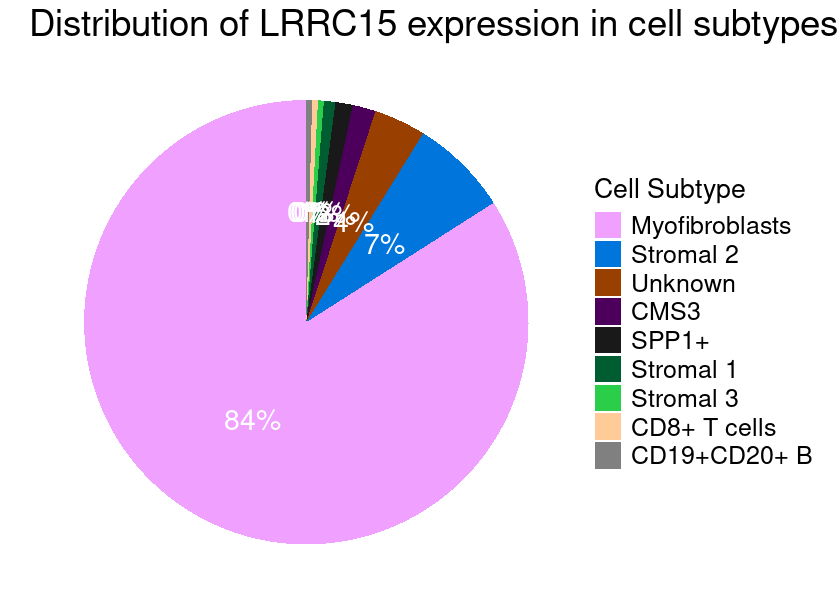

In [24]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

In [56]:
plot.df

Var1,Freq
<fct>,<dbl>
CD19+CD20+ B,0.4201681
CD8+ T cells,0.4201681
Stromal 3,0.4201681
Stromal 1,0.8403361
SPP1+,1.2605042
CMS3,1.6806723
Unknown,3.7815126
Stromal 2,7.1428571
Myofibroblasts,84.0336134


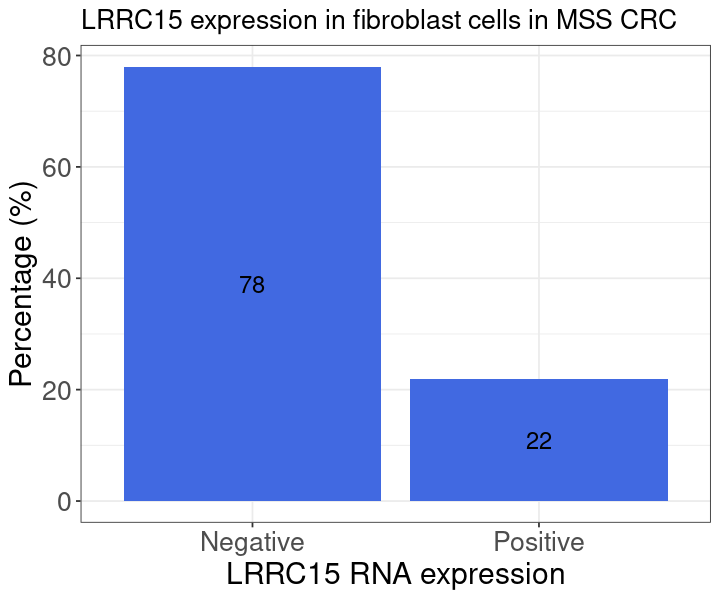

In [57]:
options(repr.plot.width = 6, repr.plot.height = 5)
# df.melanoma <-
msi_status <- 'MSS'

df.m1 <- df %>% filter(MSI == msi_status) %>% filter(Cell_subtype == 'Myofibroblasts') %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()

plot.df2 <- df.m1
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),  
        axis.title.x = element_text( size = 18),
        axis.title.y = element_text(size = 18), 
          plot.title = element_text(size=16),
          legend.position="none") +
    labs(title = glue('LRRC15 expression in fibroblast cells in {msi_status} CRC'),
        x = "LRRC15 RNA expression",
        y = "Percentage (%)")

In [64]:
table(seu_obj_cancer$MSI)


MSI-H   MSS 
 7442 39811 

In [81]:
seu_obj_cancer@meta.data %>% select(Patient, SMAD4) %>% unique() %>% {table(.$SMAD4)}


  Mutant Wildtype 
       4       19 

In [82]:
table(seu_obj_cancer$SMAD4)


  Mutant Wildtype 
    6947    40306 

Warning message:
"The following variables were found in both object meta data and the default assay: SMAD4
Returning meta data; if you want the feature, please use the assay's key (eg. sct_SMAD4)"


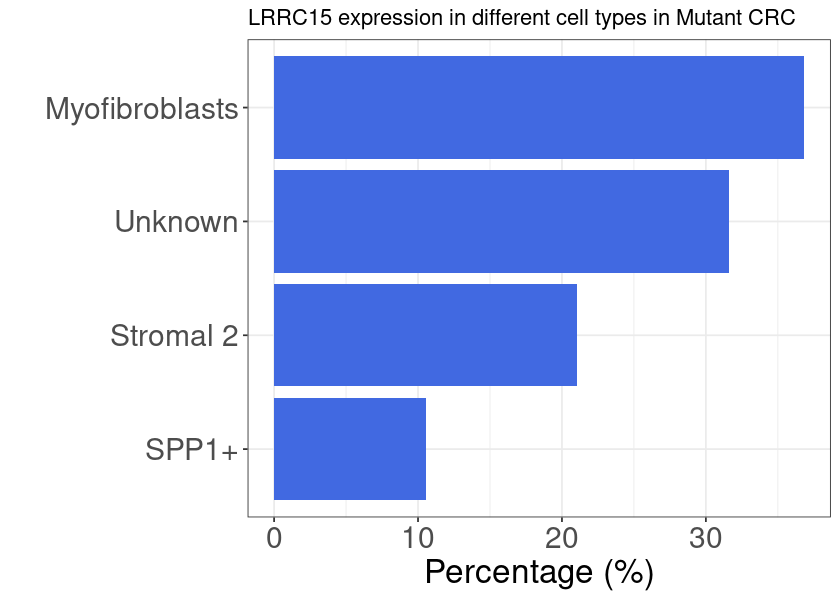

In [90]:
gene_status <- 'Mutant'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, SMAD4 == gene_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {gene_status} CRC'),
        x = "",
        y = "Percentage (%)")


In [91]:
plot.df

Var1,Freq
<fct>,<dbl>
SPP1+,10.52632
Stromal 2,21.05263
Unknown,31.57895
Myofibroblasts,36.84211


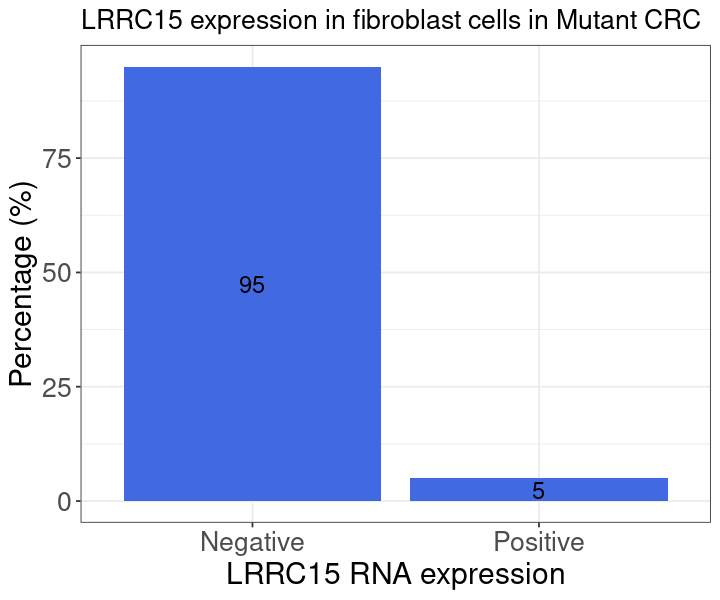

In [84]:
options(repr.plot.width = 6, repr.plot.height = 5)
# df.melanoma <-
gene_status <- 'Mutant'

df.m1 <- df %>% filter(SMAD4 == gene_status) %>% filter(Cell_subtype == 'Myofibroblasts') %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()

plot.df2 <- df.m1
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),  
        axis.title.x = element_text( size = 18),
        axis.title.y = element_text(size = 18), 
          plot.title = element_text(size=16),
          legend.position="none") +
    labs(title = glue('LRRC15 expression in fibroblast cells in {gene_status} CRC'),
        x = "LRRC15 RNA expression",
        y = "Percentage (%)")

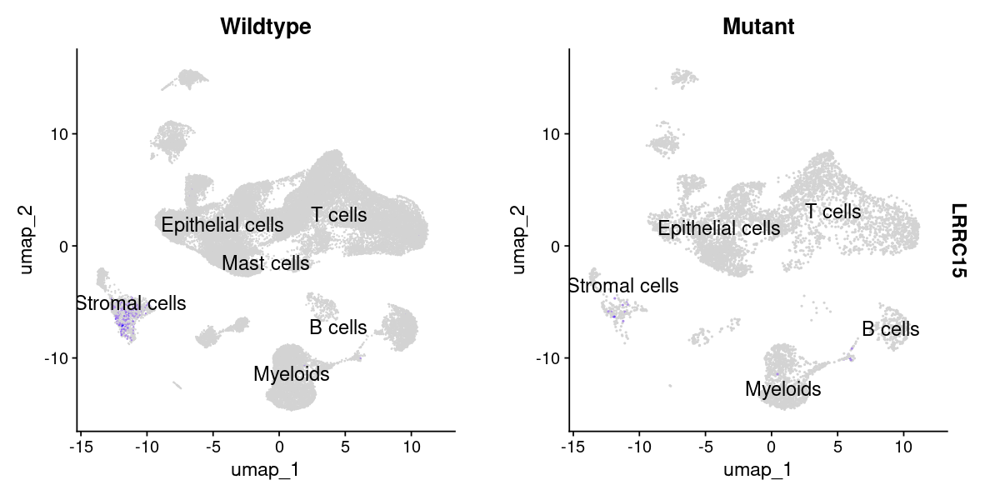

In [89]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(seu_obj_cancer) <- 'Cell_type'
seu_obj_cancer$SMAD4 <- factor(seu_obj_cancer$SMAD4, levels = c('Wildtype', 'Mutant'))
for(gene in  c( 'LRRC15')){
  
  print(FeaturePlot(seu_obj_cancer, features = gene, split.by = 'SMAD4',  label = T, label.size = 5))
  
}

Warning message:
"The following variables were found in both object meta data and the default assay: SMAD4
Returning meta data; if you want the feature, please use the assay's key (eg. sct_SMAD4)"


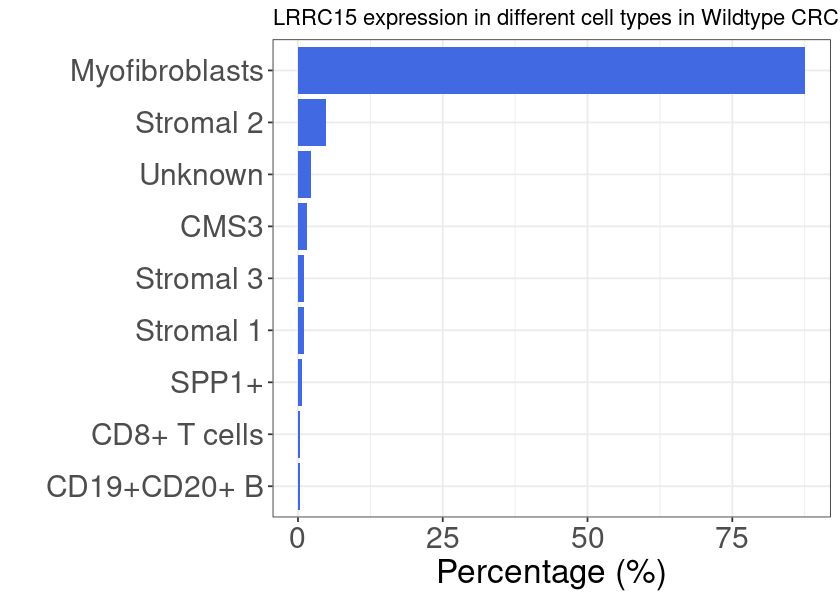

In [85]:
gene_status <- 'Wildtype'
gene_exp <- GetAssayData(object = subset(seu_obj_cancer, SMAD4 == gene_status), slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(seu_obj_filtered@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% filter(Gene_cat == 'Positive') %>% {table( .$Cell_subtype)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


# cell.sorted <- levels(df.Cancer$celltype_major)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in different cell types in {gene_status} CRC'),
        x = "",
        y = "Percentage (%)")


In [86]:
plot.df

Var1,Freq
<fct>,<dbl>
CD19+CD20+ B,0.3745318
CD8+ T cells,0.3745318
SPP1+,0.7490637
Stromal 1,1.1235955
Stromal 3,1.1235955
CMS3,1.4981273
Unknown,2.2471910
Stromal 2,4.8689139
Myofibroblasts,87.6404494


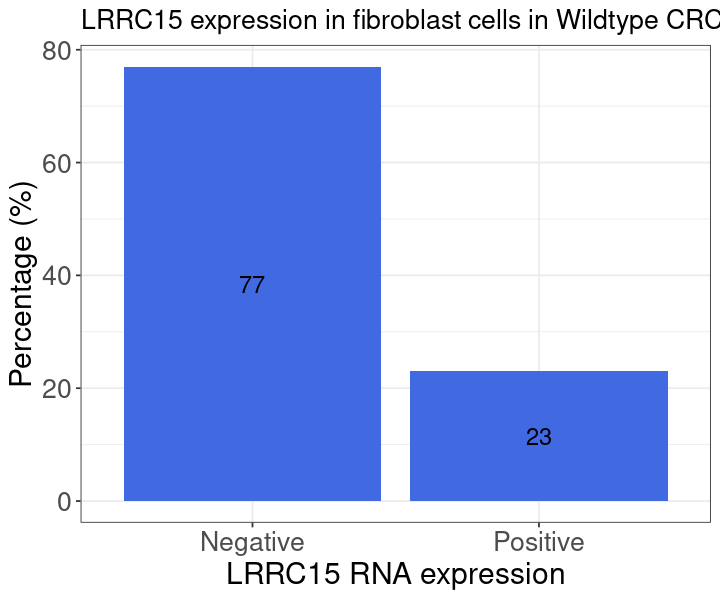

In [87]:
options(repr.plot.width = 6, repr.plot.height = 5)
# df.melanoma <-
gene_status <- 'Wildtype'

df.m1 <- df %>% filter(SMAD4 == gene_status) %>% filter(Cell_subtype == 'Myofibroblasts') %>% {table(.$Gene_cat)} %>%
prop.table() %>% as.data.frame()

plot.df2 <- df.m1
plot.df2$Freq <- round(plot.df2$Freq * 100, 0)

ggplot(plot.df2, aes(x = Var1, y = Freq, label = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(size = 5, position = position_stack(vjust = 0.5)) +
scale_fill_manual(values=c( "tomato", "royalblue"))+
# coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 16),
        axis.text.y = element_text(size = 16),  
        axis.title.x = element_text( size = 18),
        axis.title.y = element_text(size = 18), 
          plot.title = element_text(size=16),
          legend.position="none") +
    labs(title = glue('LRRC15 expression in fibroblast cells in {gene_status} CRC'),
        x = "LRRC15 RNA expression",
        y = "Percentage (%)")

In [23]:
table(df$Class)


Normal  Tumor 
     0   7442 

In [23]:
# mss_obj <- subset(seu_obj_filtered, MSI == 'MSS' )
# mss_obj

mss_obj <- subset(seu_obj_filtered, (MSI == 'MSS') & (Class == 'Tumor'))
msi_obj <- subset(seu_obj_filtered, (MSI == 'MSI-H') & (Class == 'Tumor'))

In [24]:
length(unique(mss_obj$Patient))

[1] 19

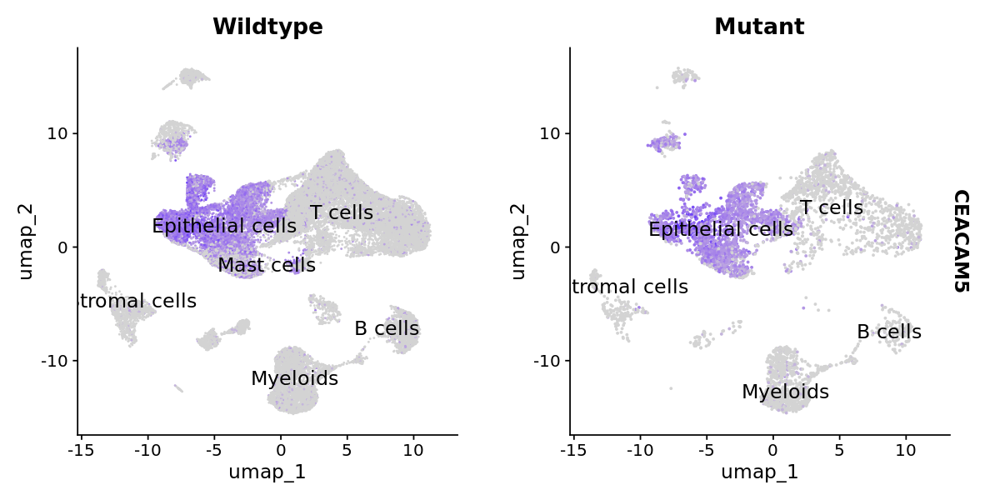

In [25]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(mss_obj) <- 'Cell_type'
mss_obj$SMAD4 <- factor(mss_obj$SMAD4, levels = c('Wildtype', 'Mutant'))
for(gene in  c( 'CEACAM5')){
  
  print(FeaturePlot(mss_obj, features = gene, split.by = 'SMAD4',  label = T, label.size = 5))
  
}

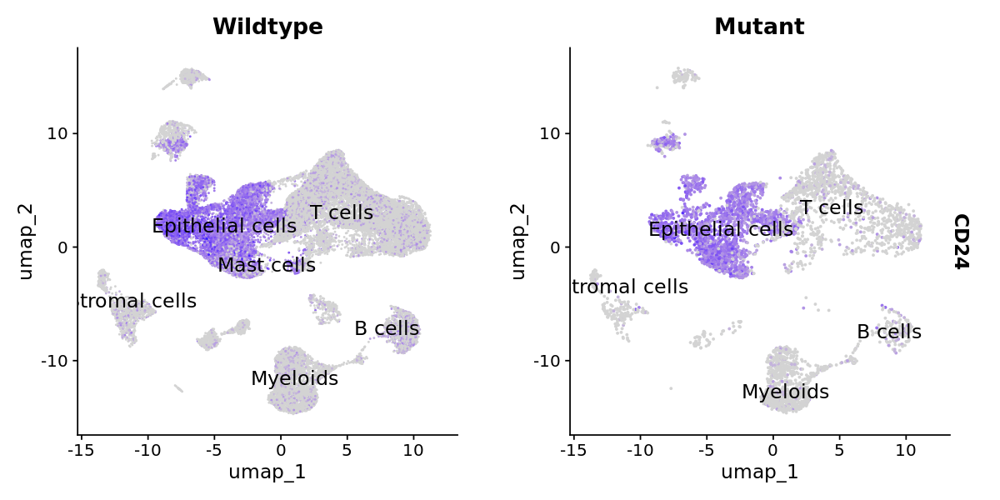

In [21]:
options(repr.plot.width = 10, repr.plot.height = 5)
Idents(mss_obj) <- 'Cell_type'
mss_obj$SMAD4 <- factor(mss_obj$SMAD4, levels = c('Wildtype', 'Mutant'))
for(gene in  c( 'CD24')){
  
  print(FeaturePlot(mss_obj, features = gene, split.by = 'SMAD4',  label = T, label.size = 5))
  
}

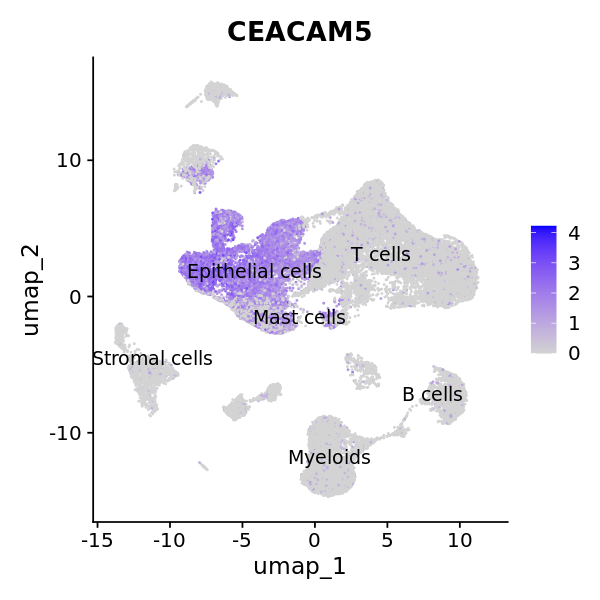

In [26]:
options(repr.plot.width = 5, repr.plot.height = 5)


for(gene in  c( 'CEACAM5')){
  
  print(FeaturePlot(mss_obj, features = gene,  label = T, label.size = 4))
  
}

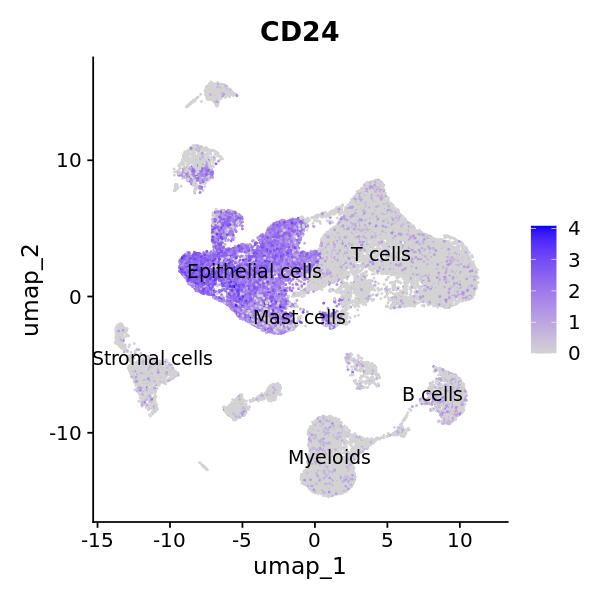

In [24]:
options(repr.plot.width = 5, repr.plot.height = 5)


for(gene in  c( 'CD24')){
  
  print(FeaturePlot(mss_obj, features = gene,  label = T, label.size = 4))
  
}

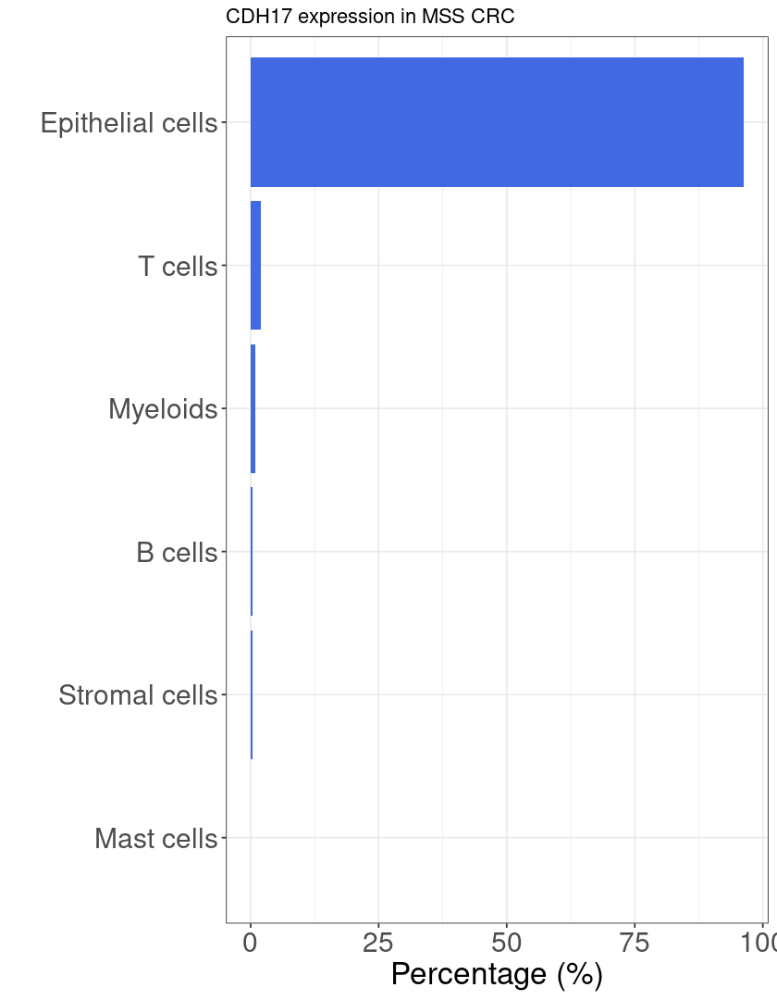

In [24]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'CDH17'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSS CRC'),
        x = "",
        y = "Percentage (%)")


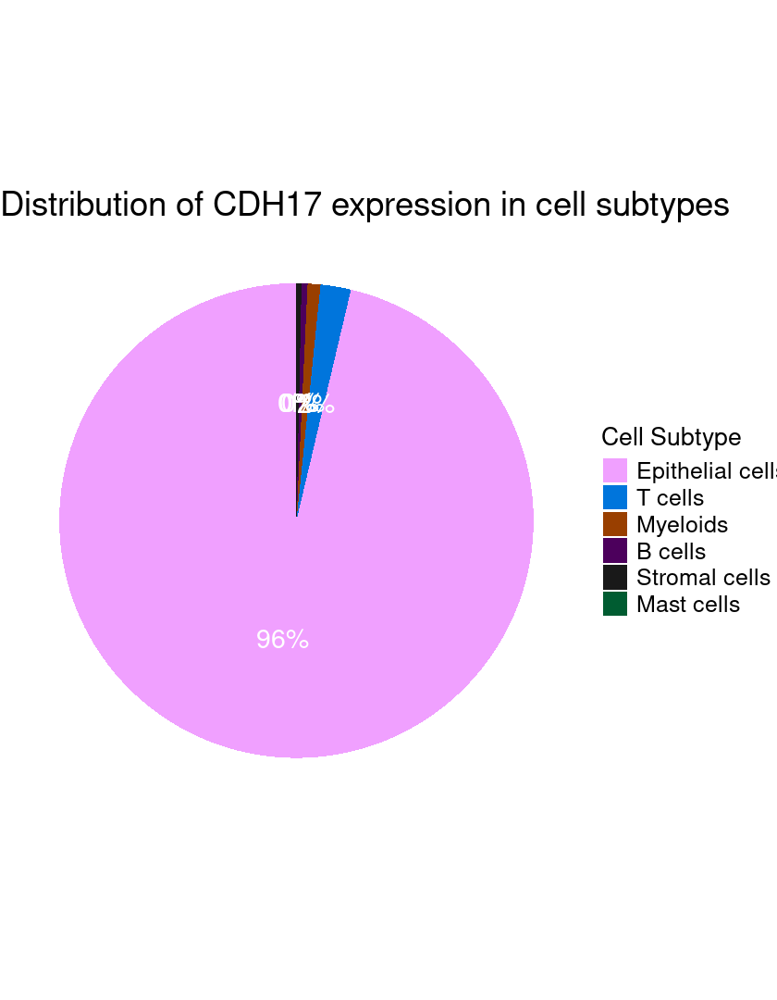

In [25]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

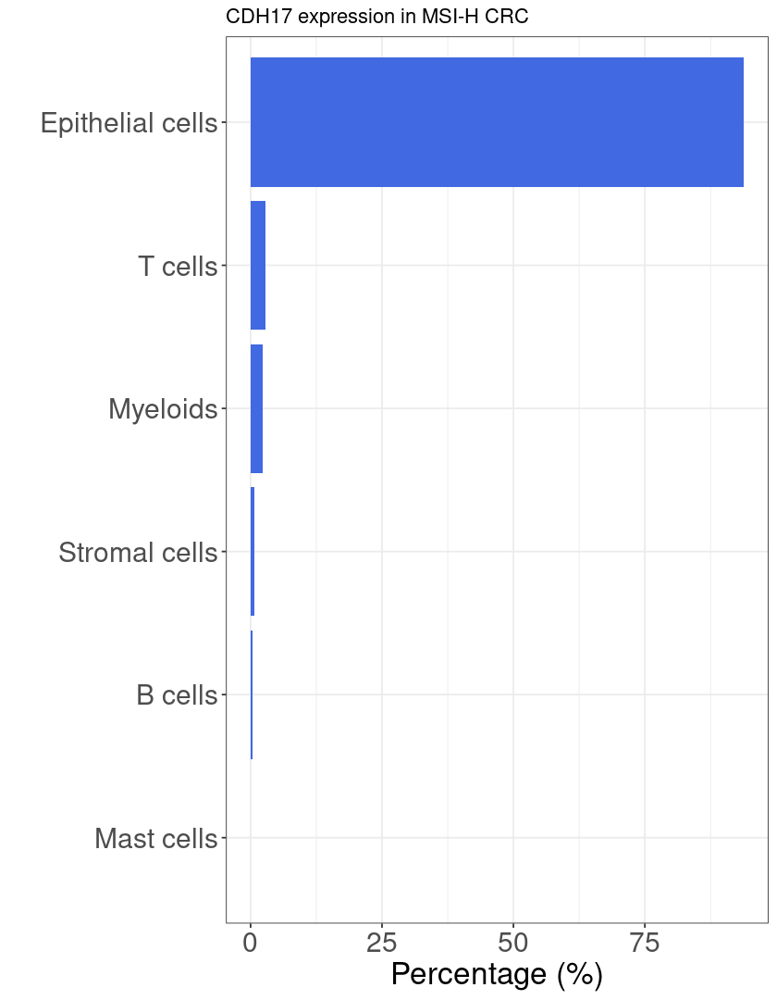

In [26]:
gene_exp <- GetAssayData(object = msi_obj, slot = "data")
# gene_exp <- GetAssayData(object = msi_obj, slot = "data")
gene_of_interest <- 'CDH17'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(msi_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSI-H CRC'),
        x = "",
        y = "Percentage (%)")


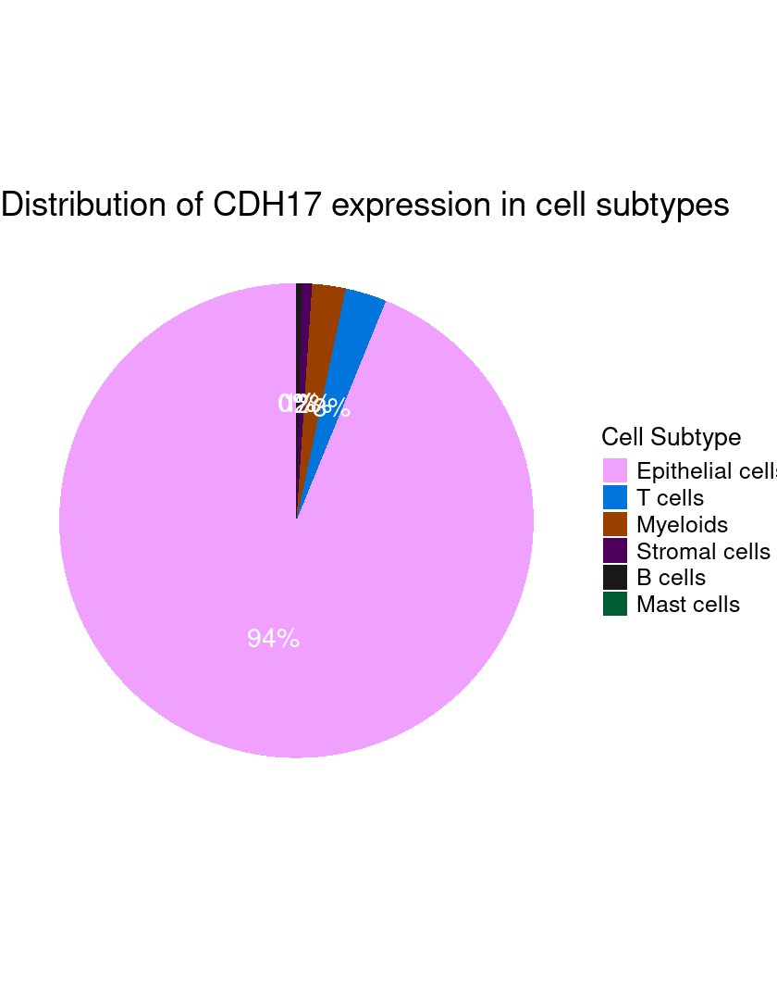

In [27]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

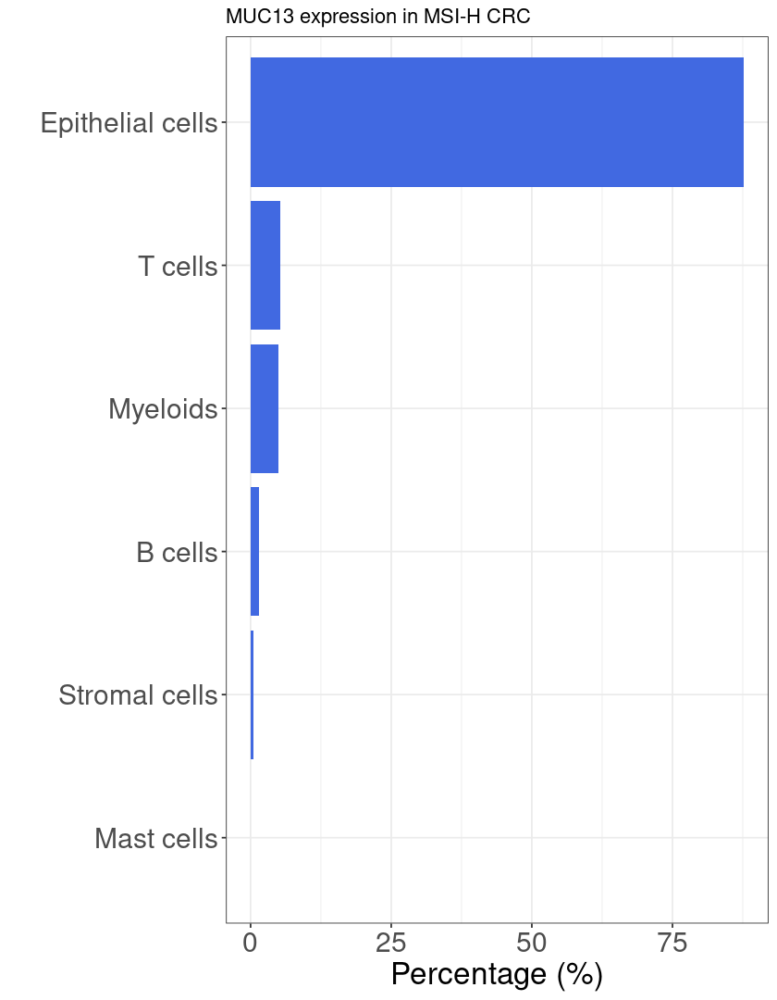

In [60]:
gene_exp <- GetAssayData(object = msi_obj, slot = "data")
# gene_exp <- GetAssayData(object = msi_obj, slot = "data")
gene_of_interest <- 'MUC13'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(msi_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSI-H CRC'),
        x = "",
        y = "Percentage (%)")

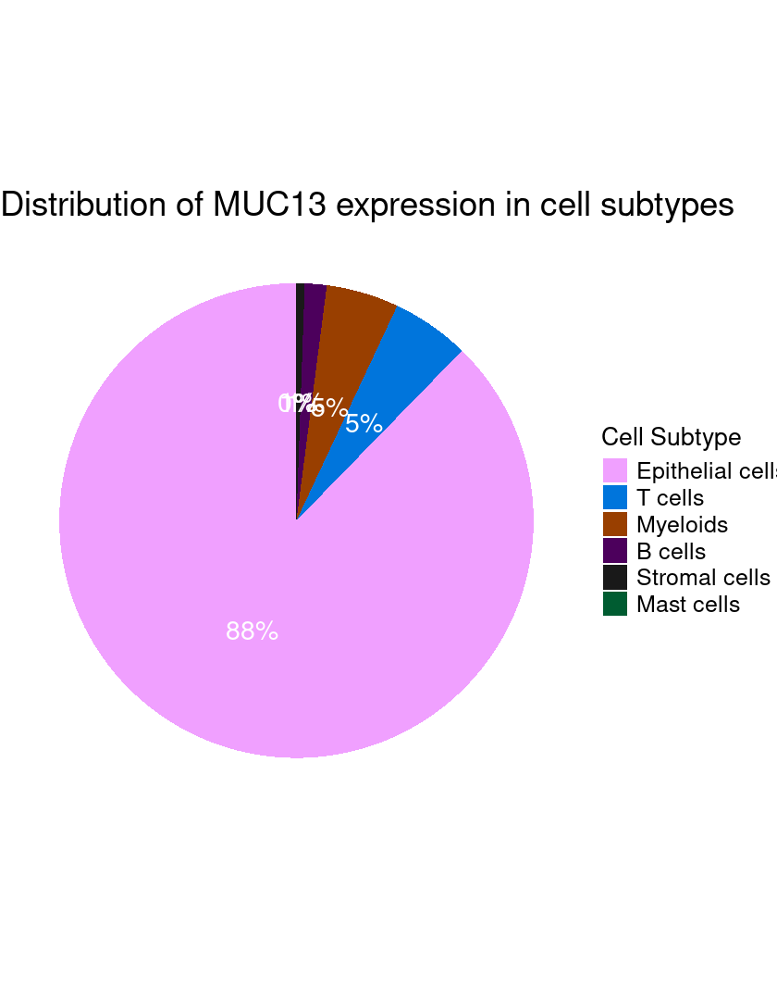

In [61]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

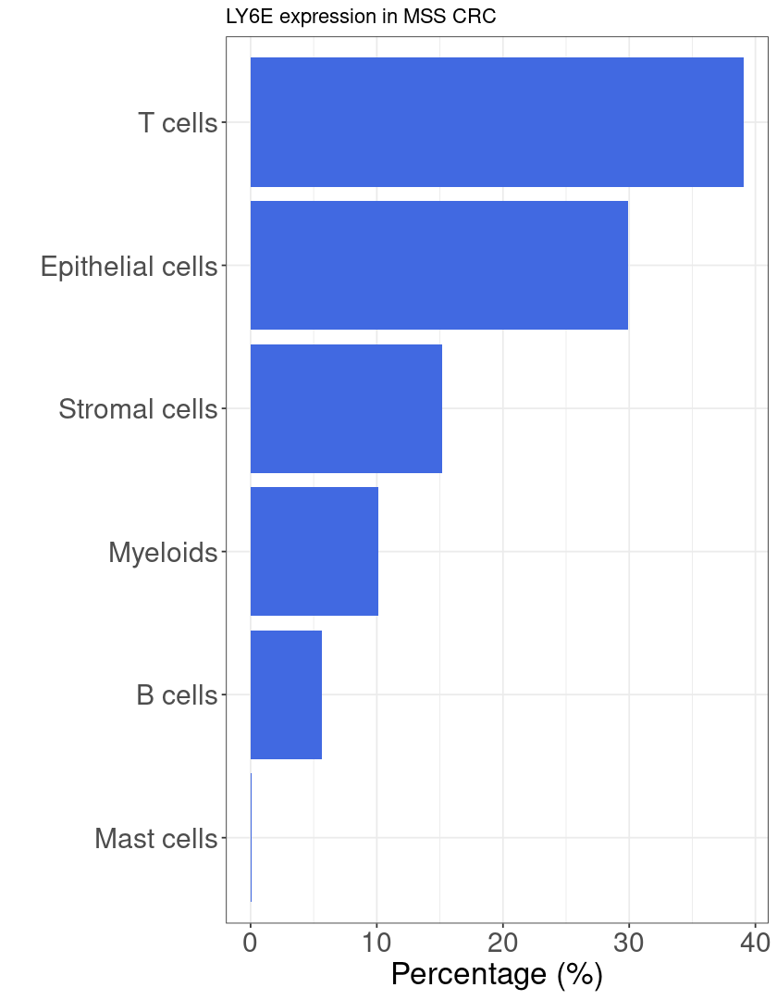

In [37]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'LY6E'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSS CRC'),
        x = "",
        y = "Percentage (%)")


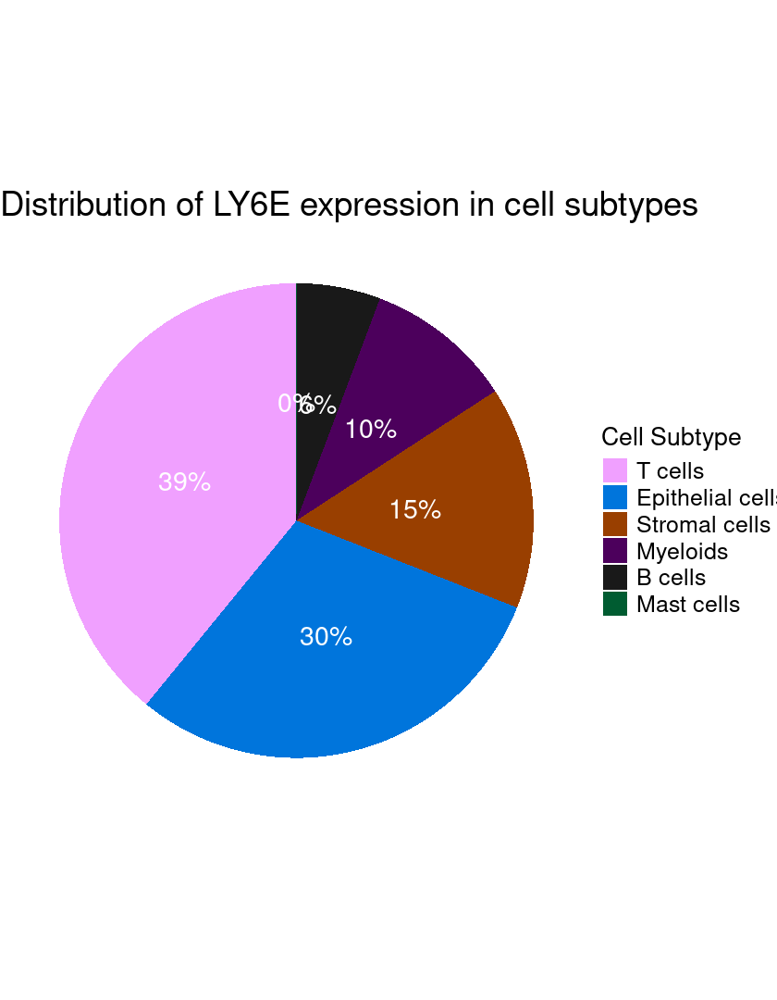

In [38]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

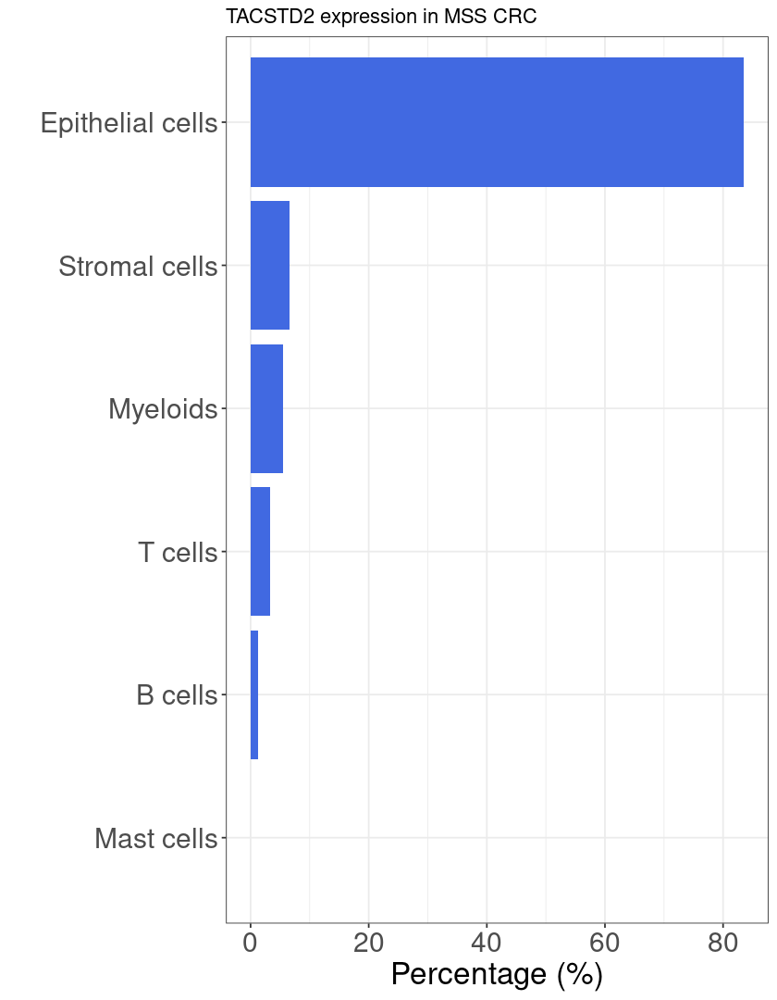

In [39]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'TACSTD2'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSS CRC'),
        x = "",
        y = "Percentage (%)")


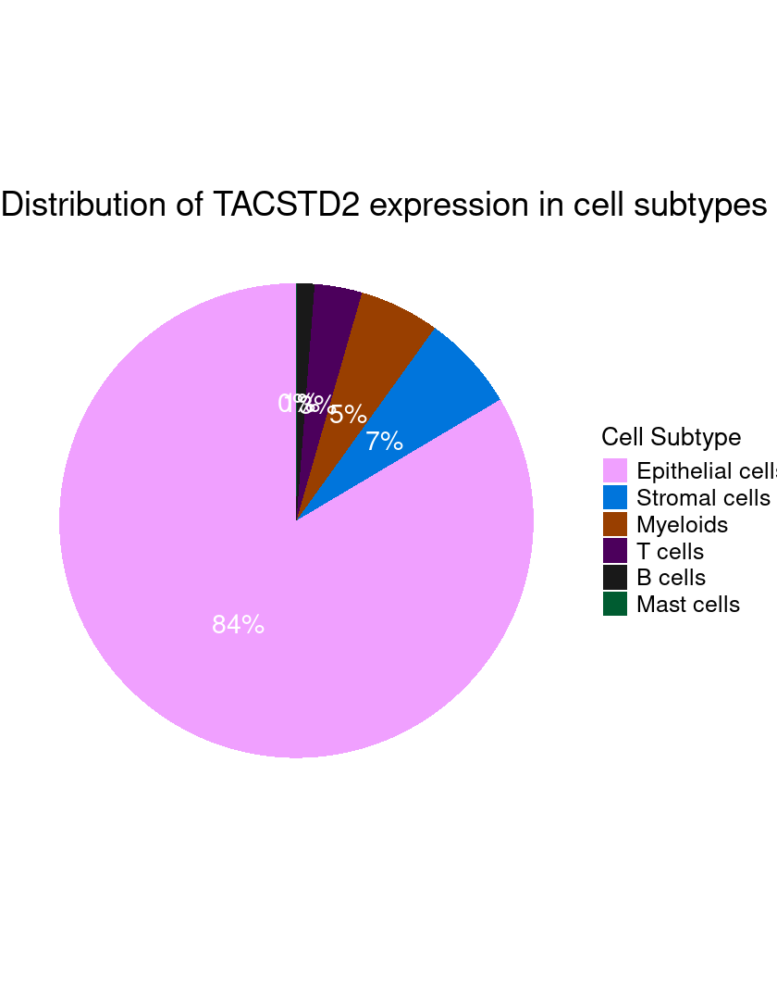

In [40]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

In [41]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LY6E', 'TACSTD2')

cnt <- GetAssayData(object = mss_obj, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(mss_obj@meta.data, cnt, by = 'row.names')


write.table(df, "data/MSS_count_matrix.LY6E_TROP2.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

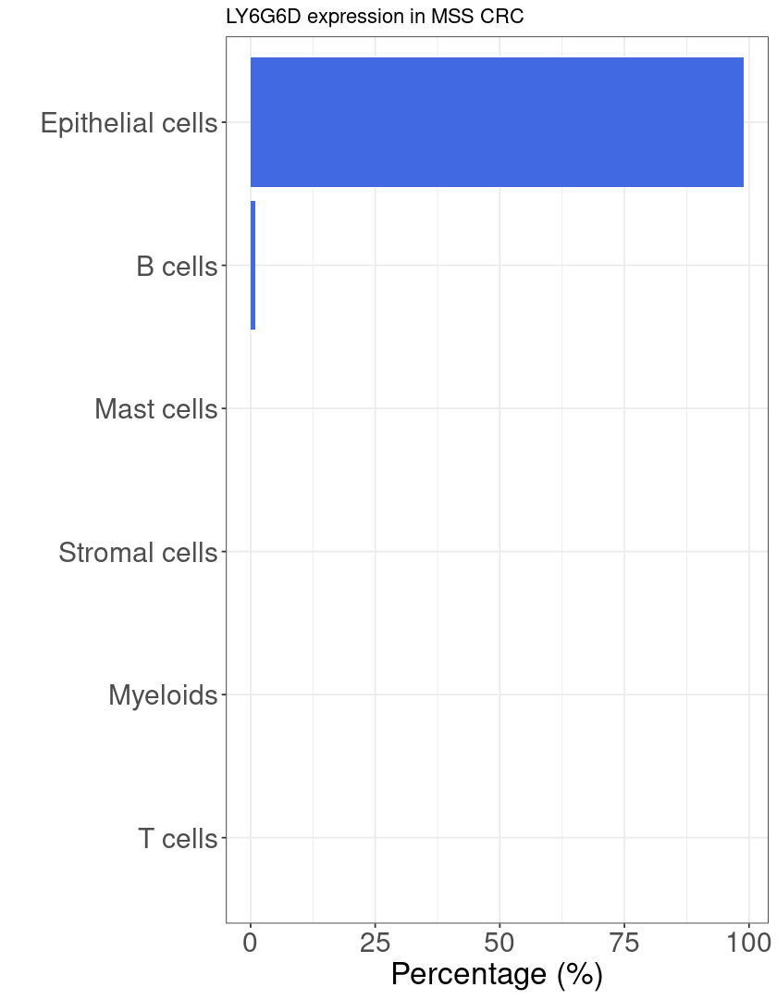

In [42]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'LY6G6D'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSS CRC'),
        x = "",
        y = "Percentage (%)")


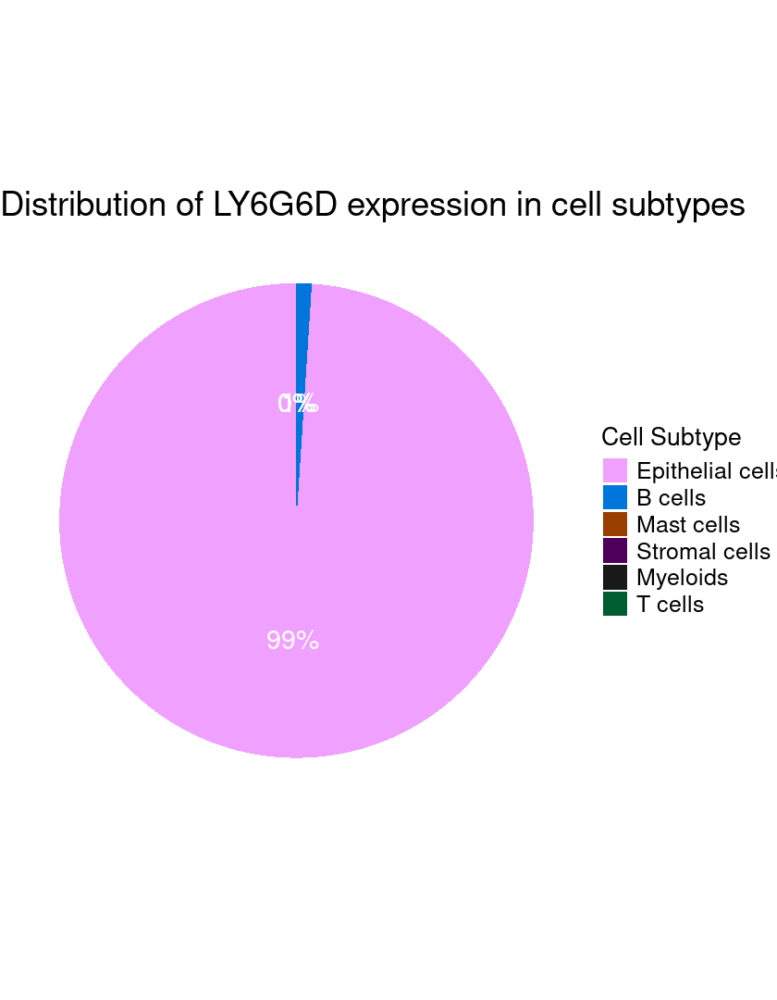

In [43]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

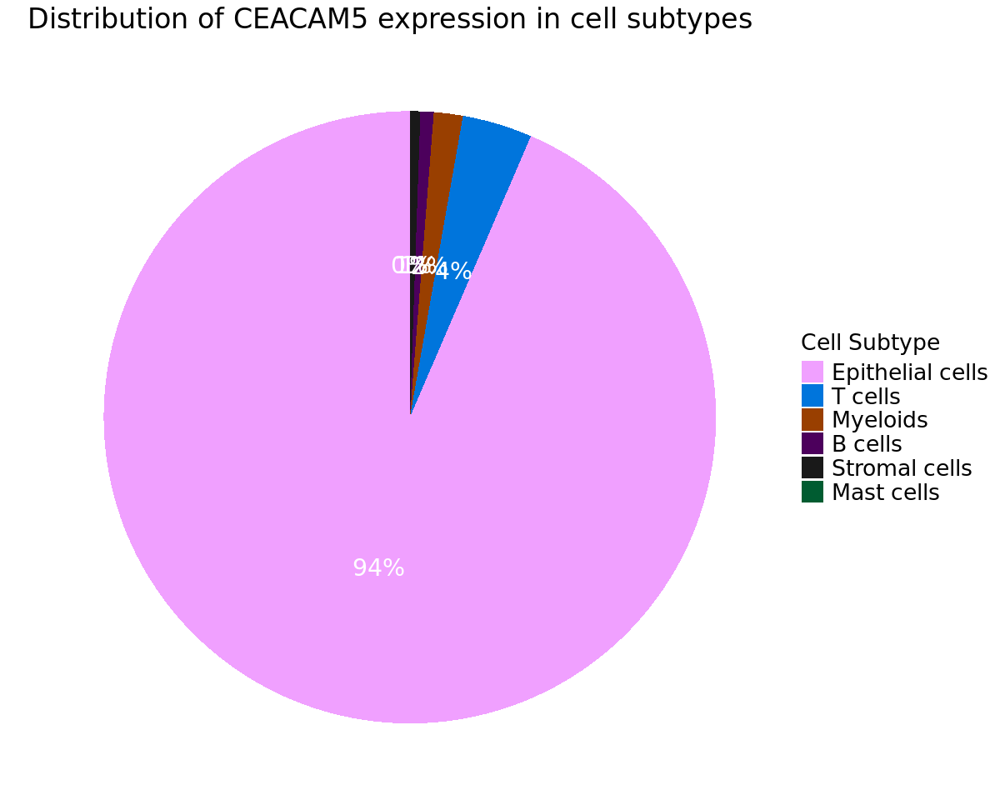

In [33]:
options(repr.plot.width = 10, repr.plot.height = 8)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'CEACAM5'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)


plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)


# plot.df <- plot.df %>% filter(Freq > 0.5)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=20),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=16)) 
 
print(p1) 

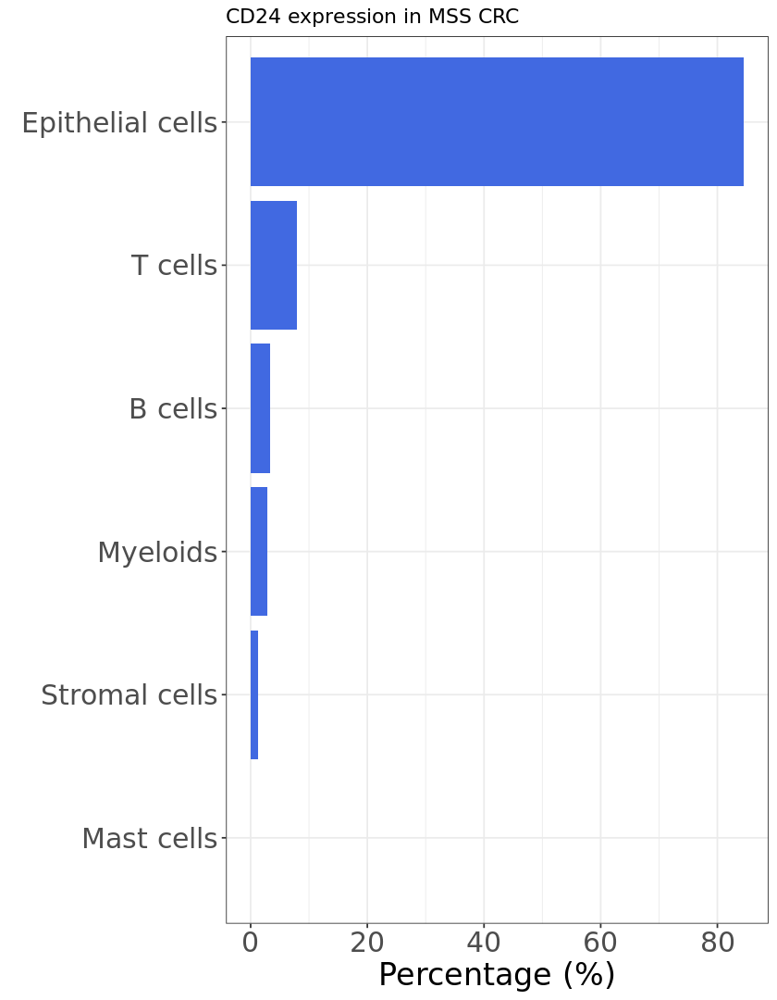

In [26]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'CD24'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSS CRC'),
        x = "",
        y = "Percentage (%)")


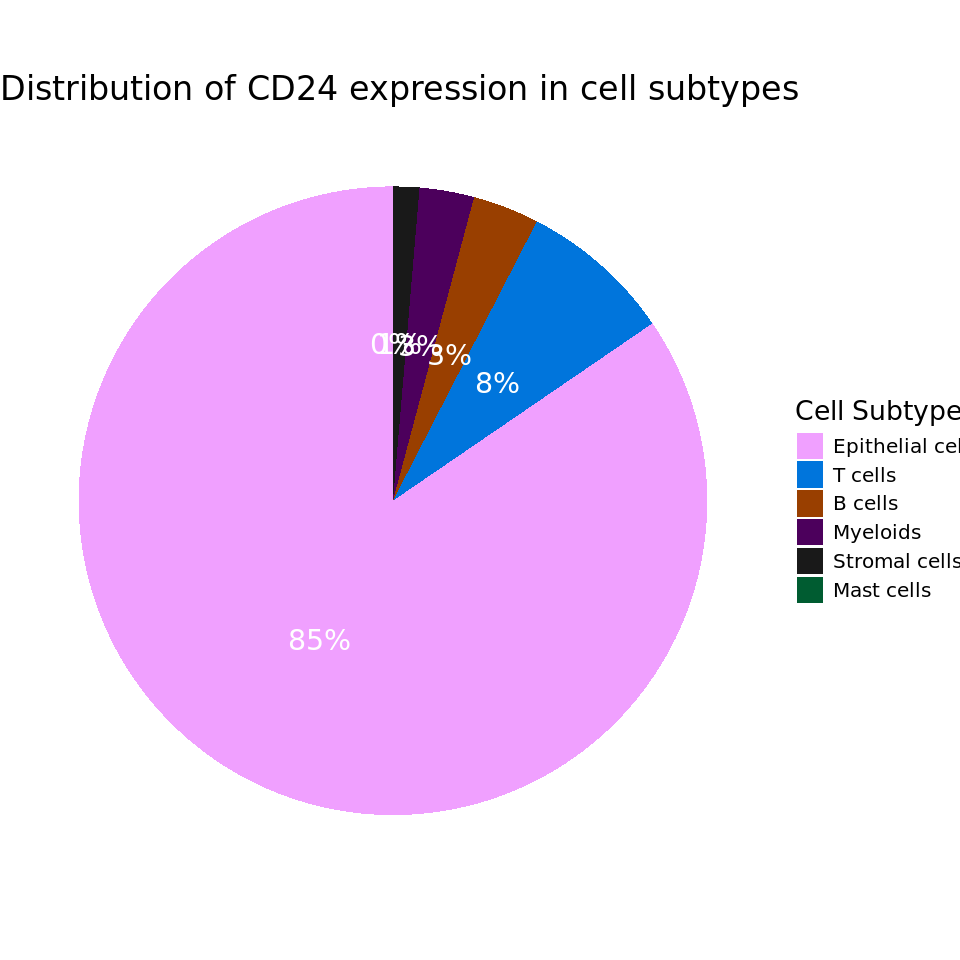

In [29]:
# plot.df <- plot.df %>% filter(Freq > 0.5)
options(repr.plot.width = 8, repr.plot.height = 8)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=20),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=12)) 
 
print(p1) 

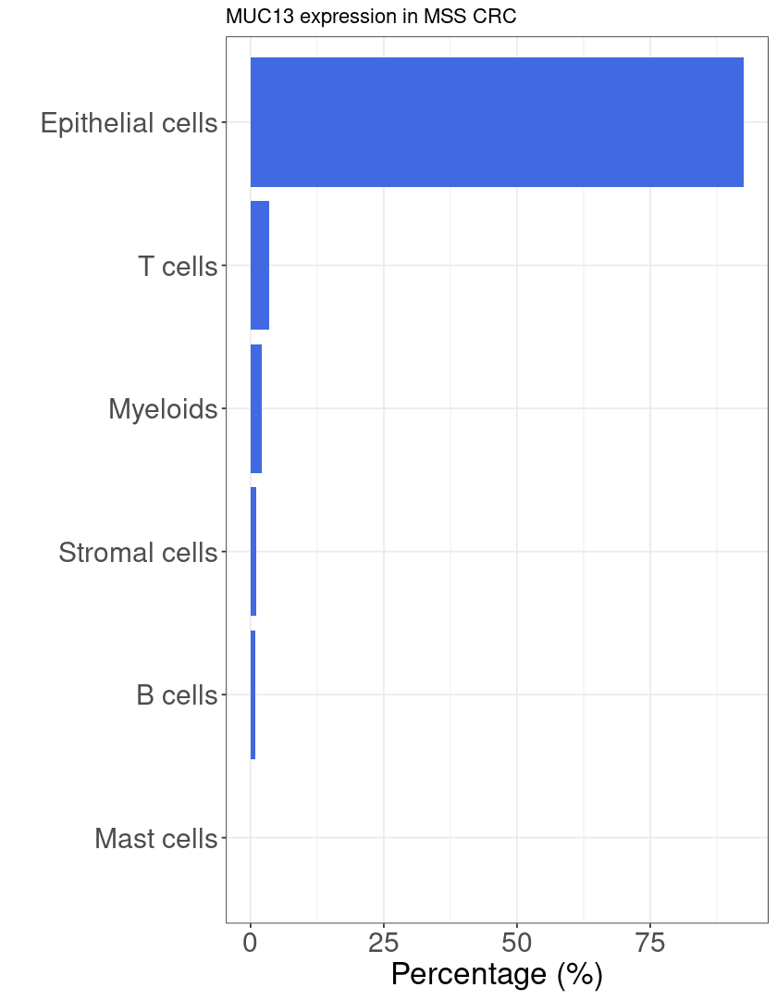

In [56]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'MUC13'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 9)

df.Cancer <- df %>%   
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)

# df.Cancer$Var1 <- gsub('CMS2|CMS3', 'Cancer Epithelial', df.Cancer$Var1)


# cell.sorted <- levels(df.Cancer$Cell_type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100


cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)

ggplot(plot.df, aes(x = Var1, y = Freq)) +
geom_bar(stat = 'identity', fill = 'royalblue') + 
coord_flip() +
theme_bw() +
    theme(axis.text.x = element_text(size = 18),
        axis.text.y = element_text(size = 18),  
        axis.title.x = element_text( size = 20),
        axis.title.y = element_text(size = 20), 
          legend.position="none") +
    labs(title = glue('{gene_of_interest} expression in MSS CRC'),
        x = "",
        y = "Percentage (%)")


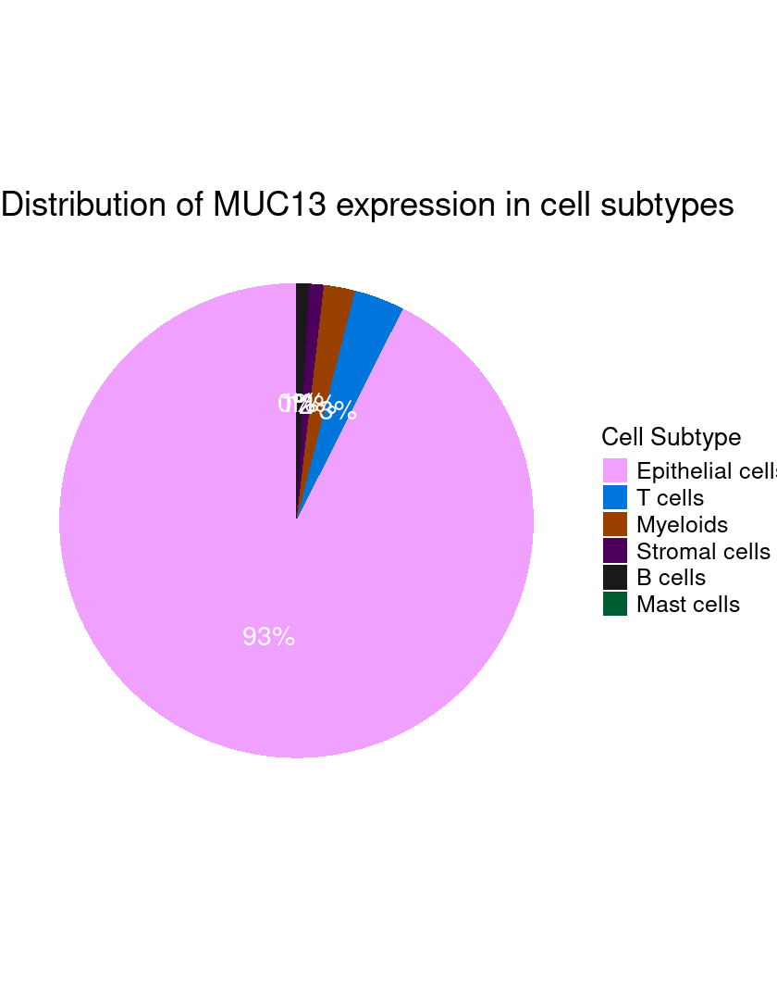

In [57]:
# plot.df <- plot.df %>% filter(Freq > 0.5)

plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")


p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

In [62]:
table(seu_obj_filtered$MSI)


MSI-H   MSS 
12198 51440 

`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


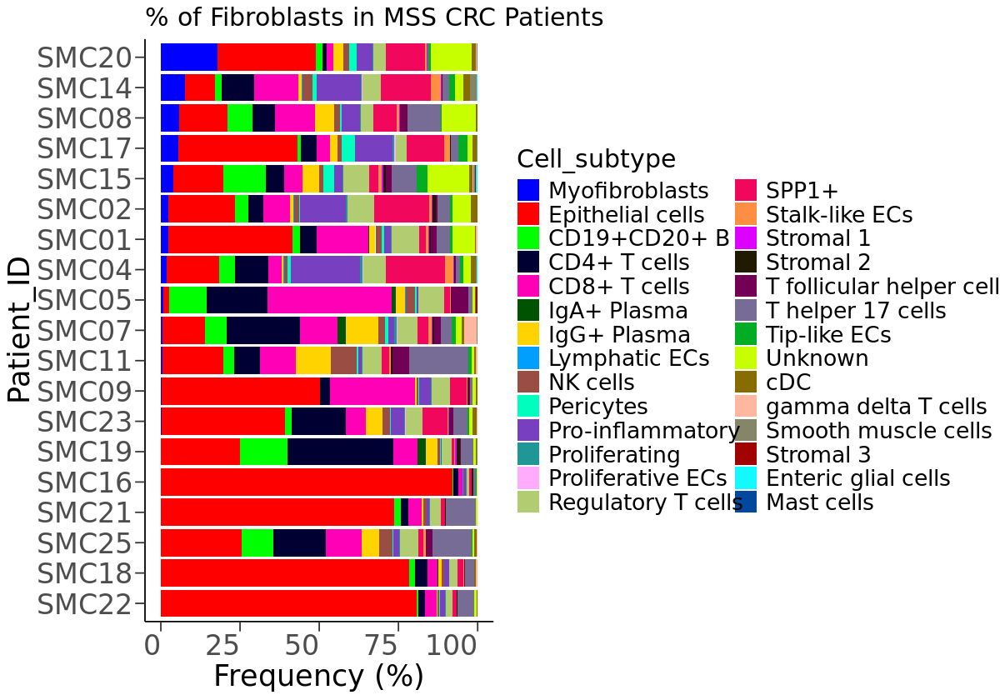

In [35]:
meta.df <- mss_obj@meta.data
plot.df <- meta.df %>% filter(Class == 'Tumor') %>%  group_by(Patient, Cell_subtype) %>%
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))
plot.df$freq <- 100 * plot.df$freq
plot.df$Cell_subtype <- gsub('CMS1|CMS2|CMS3|CMS4', 'Epithelial cells', plot.df$Cell_subtype)
patients.sorted <- plot.df %>% filter(Cell_subtype == 'Myofibroblasts') %>% arrange(freq) %>% pull(Patient)
plot.df$Patient <- factor(plot.df$Patient, levels = patients.sorted)

options(repr.plot.width = 10, repr.plot.height = 7)
cell.types <- unique(plot.df$Cell_subtype)

cell.type.factors <- rev(unique(c('Myofibroblasts', 'Epithelial cells', cell.types)))

n_colors <- length(cell.type.factors)
colors <- rev(DiscretePalette(n_colors, palette = "glasbey"))
plot.df$Cell_subtype <- factor(plot.df$Cell_subtype, levels = cell.type.factors)

ggplot(plot.df, aes(x = Patient, y = freq, fill = Cell_subtype)) +
       geom_bar(stat = 'identity') + 
scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts in MSS CRC Patients'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18)) +
  guides(fill = guide_legend(reverse = TRUE))


`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


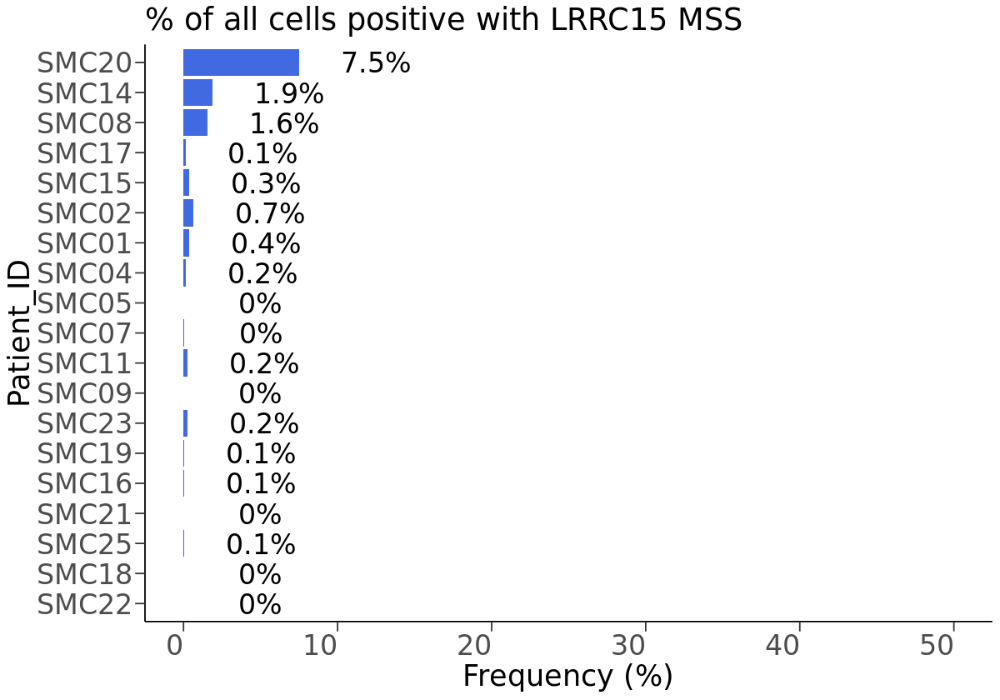

In [36]:
subtype = 'MSS'

gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

tmp.df <- df %>% filter(Class == 'Tumor') %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n))
tmp.df <- tmp.df[, 'Patient', drop = F] %>% unique()

df.all.cells <- df %>% filter(Class == 'Tumor') %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n)) %>% filter(Gene_cat == 'Positive') 
df.all.cells <- merge(tmp.df, df.all.cells, by = 'Patient', all.x = T) %>% arrange(freq)
df.all.cells$freq[is.na(df.all.cells$freq)] <- 0
rio::export(df.all.cells, 'LRRC15_positivity_all_cells.MSS_CRC.csv')
# patients.sorted <- df.all.cells$Patient
df.all.cells$Patient <- factor(df.all.cells$Patient, levels = patients.sorted)
df.all.cells$freq <- df.all.cells$freq *100
df.all.cells$label <- paste0(round(df.all.cells$freq, 1), '%')

ggplot(df.all.cells, aes(x = Patient, y = freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(aes(label= label), nudge_y = 5, size = 7) +
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 50)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of all cells positive with LRRC15 {subtype}'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

In [74]:
plot.mss.df1 <- plot.df %>% filter(Cell_subtype == 'Myofibroblasts')
head(plot.mss.df1, 2)

Patient,Cell_subtype,n,freq
<fct>,<fct>,<int>,<dbl>
SMC01,Myofibroblasts,69,2.474005
SMC02,Myofibroblasts,42,2.497027


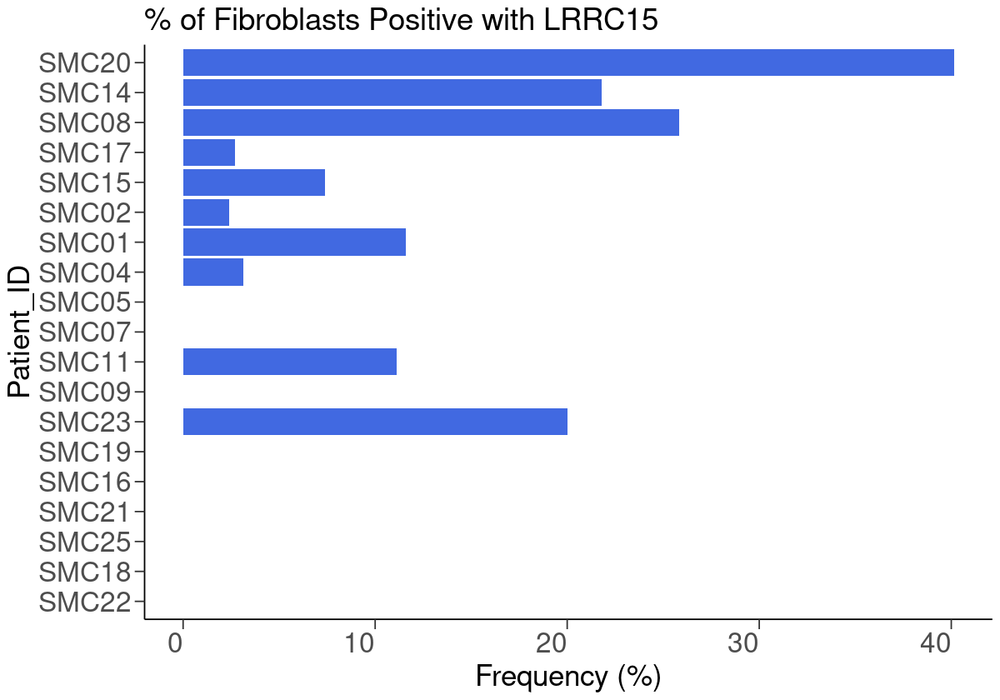

In [75]:
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_subtype == 'Myofibroblasts') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100
plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

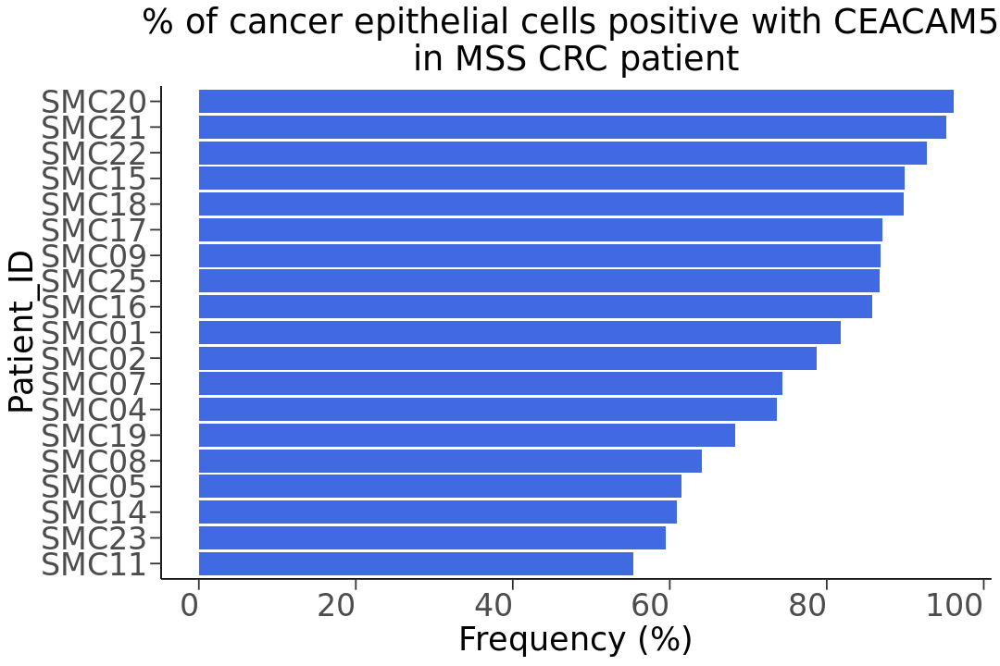

In [38]:
options(repr.plot.width = 9, repr.plot.height = 6)

gene_of_interest <- 'CEACAM5'

gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

patients.sorted <- plot.mss.df2 %>% arrange(Freq) %>% pull(Patient)

plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# ylim(0, 110) +
scale_y_continuous(breaks = seq(0, 100, by = 20)) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with {gene_of_interest} \nin MSS CRC patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 0.5)) 

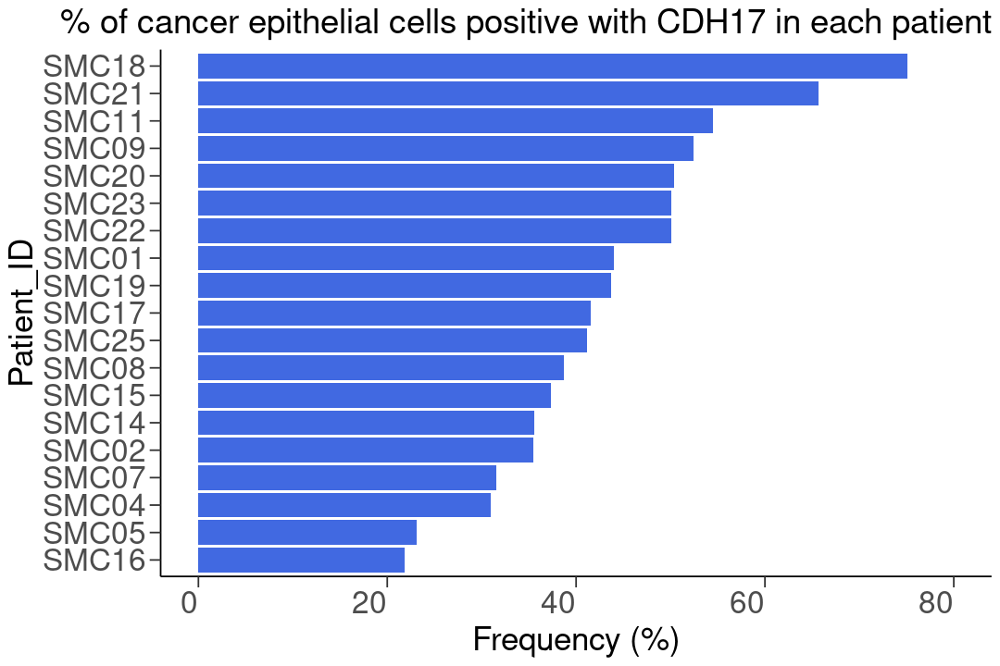

In [48]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'CDH17'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

patients.sorted <- plot.mss.df2 %>% arrange(Freq) %>% pull(Patient)

plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
ylim(0, 80) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with CDH17 in each patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

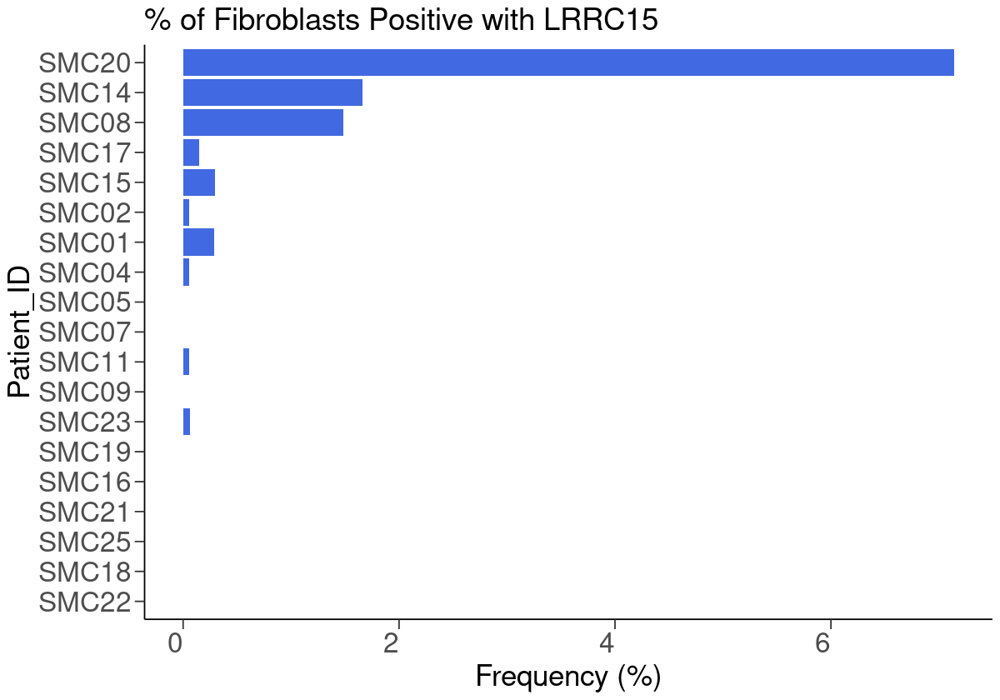

In [76]:
plot.mss.df3 <- merge(plot.mss.df1, plot.mss.df2, by = 'Patient')
plot.mss.df3$Freq2 <- (plot.mss.df3$freq * plot.mss.df3$Freq)/100
plot.mss.df3$Patient <- factor(plot.mss.df3$Patient, levels = patients.sorted)
plot.mss.df3$Cell_subtype <- gsub('CMS1|CMS2|CMS3|CMS4', 'Epithelial cells', plot.mss.df3$Cell_subtype)

ggplot(plot.mss.df3, aes(x = Patient, y = Freq2)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


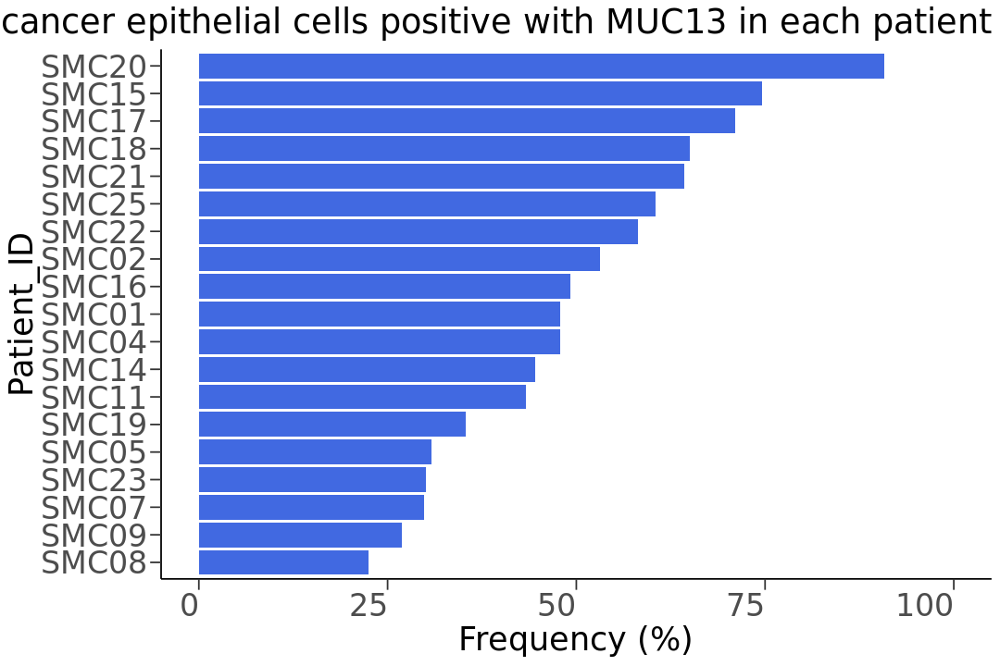

In [23]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'MUC13'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

patients.sorted <- plot.mss.df2 %>% arrange(Freq) %>% pull(Patient)

plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
ylim(0, 100) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with MUC13 in each patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

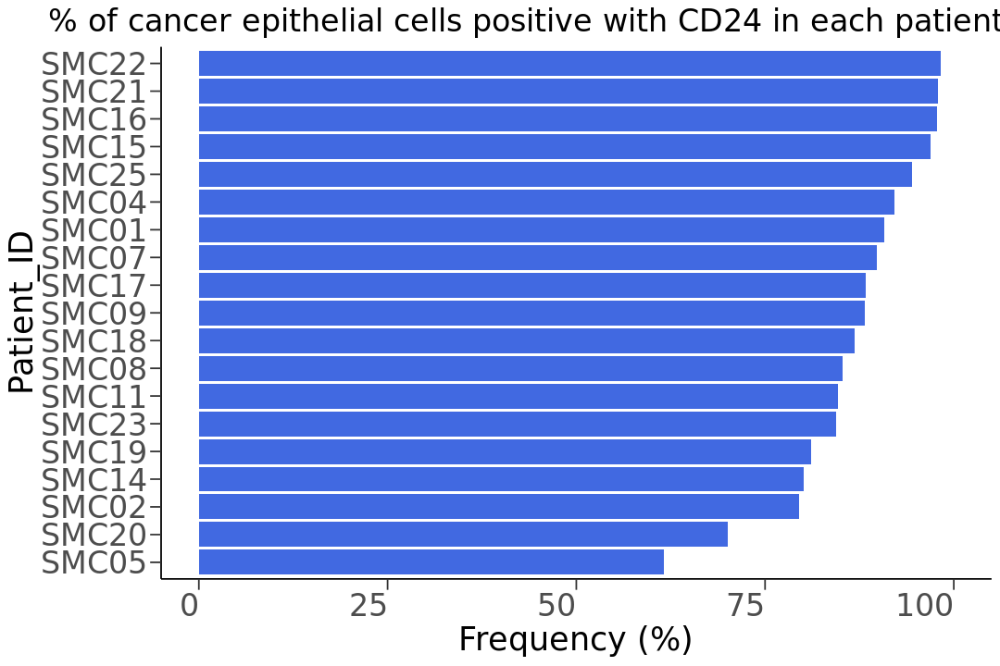

In [36]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
gene_of_interest <- 'CD24'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

patients.sorted <- plot.mss.df2 %>% arrange(Freq) %>% pull(Patient)

plot.mss.df2$Patient <- factor(plot.mss.df2$Patient, levels = patients.sorted)

ggplot(plot.mss.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
ylim(0, 100) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with {gene_of_interest} in each patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=20, hjust = 0.9))

In [37]:
mss_obj

An object of class Seurat 
50207 features across 39811 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


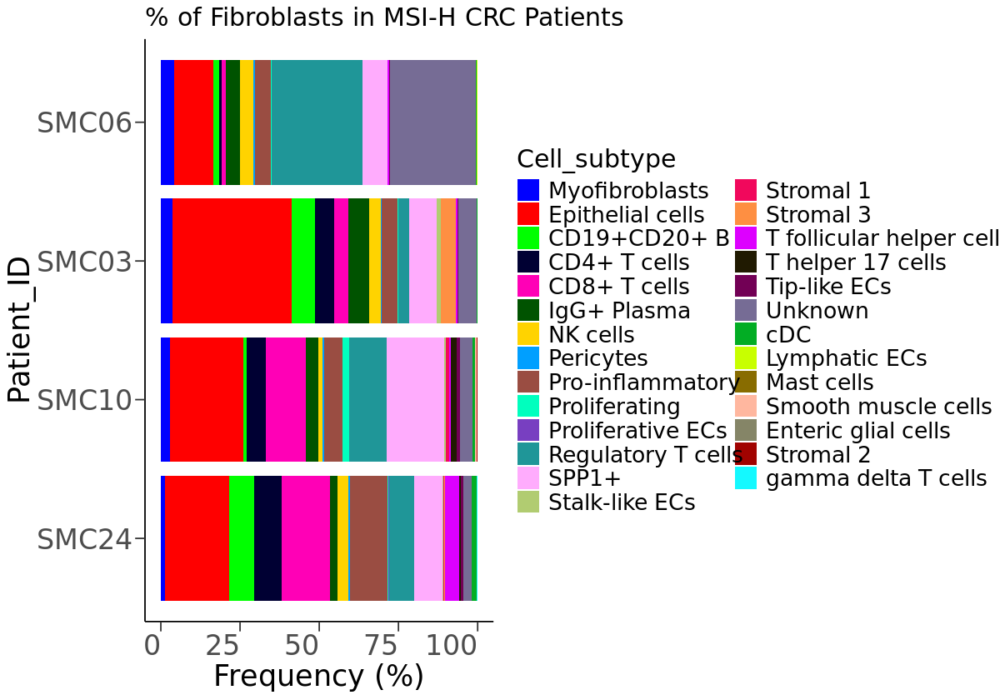

In [37]:
meta.df <- msi_obj@meta.data
plot.msi.df1 <- meta.df %>% filter(Class == 'Tumor') %>%  group_by(Patient, Cell_subtype) %>%
  summarise(n = n()) %>%
  mutate(freq = n / sum(n))
plot.msi.df1$freq <- 100 * plot.msi.df1$freq

plot.msi.df1$Cell_subtype <- gsub('CMS1|CMS2|CMS3|CMS4', 'Epithelial cells', plot.msi.df1$Cell_subtype)


patients.sorted <- plot.msi.df1 %>% filter(Cell_subtype == 'Myofibroblasts') %>% arrange(freq) %>% pull(Patient)
plot.msi.df1$Patient <- factor(plot.msi.df1$Patient, levels = patients.sorted)

options(repr.plot.width = 10, repr.plot.height = 7)
cell.types <- unique(plot.msi.df1$Cell_subtype)

cell.type.factors <- rev(unique(c('Myofibroblasts', 'Epithelial cells', cell.types)))

n_colors <- length(cell.type.factors)
colors <- rev(DiscretePalette(n_colors, palette = "glasbey"))
plot.msi.df1$Cell_subtype <- factor(plot.msi.df1$Cell_subtype, levels = cell.type.factors)

ggplot(plot.msi.df1, aes(x = Patient, y = freq, fill = Cell_subtype)) +
       geom_bar(stat = 'identity') + 
scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts in MSI-H CRC Patients'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18)) +
guides(fill = guide_legend(reverse = TRUE))


`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.
`summarise()` has grouped output by 'Patient'. You can override using the
`.groups` argument.


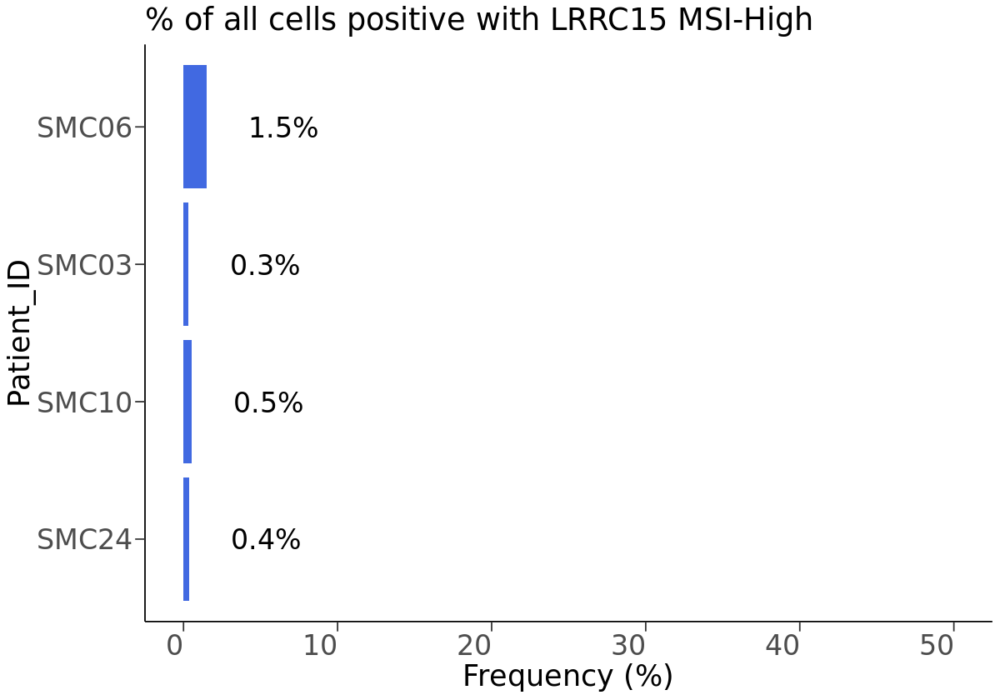

In [38]:
subtype = 'MSI-High'

gene_exp <- GetAssayData(object = msi_obj, slot = "data")
# gene_exp <- GetAssayData(object = seu_obj_filtered, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(msi_obj@meta.data, gene_exp_sub, by = 'row.names')

tmp.df <- df %>% filter(Class == 'Tumor') %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n))
tmp.df <- tmp.df[, 'Patient', drop = F] %>% unique()

df.all.cells <- df %>% filter(Class == 'Tumor') %>% group_by(Patient, Gene_cat) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n)) %>% filter(Gene_cat == 'Positive') 
df.all.cells <- merge(tmp.df, df.all.cells, by = 'Patient', all.x = T) %>% arrange(freq)
df.all.cells$freq[is.na(df.all.cells$freq)] <- 0
rio::export(df.all.cells, 'LRRC15_positivity_all_cells.MSI-h_CRC.csv')
# patients.sorted <- df.all.cells$Patient
df.all.cells$Patient <- factor(df.all.cells$Patient, levels = patients.sorted)
df.all.cells$freq <- df.all.cells$freq *100
df.all.cells$label <- paste0(round(df.all.cells$freq, 1), '%')

ggplot(df.all.cells, aes(x = Patient, y = freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
geom_text(aes(label= label), nudge_y = 5, size = 7) +
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 50)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of all cells positive with LRRC15 {subtype}'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

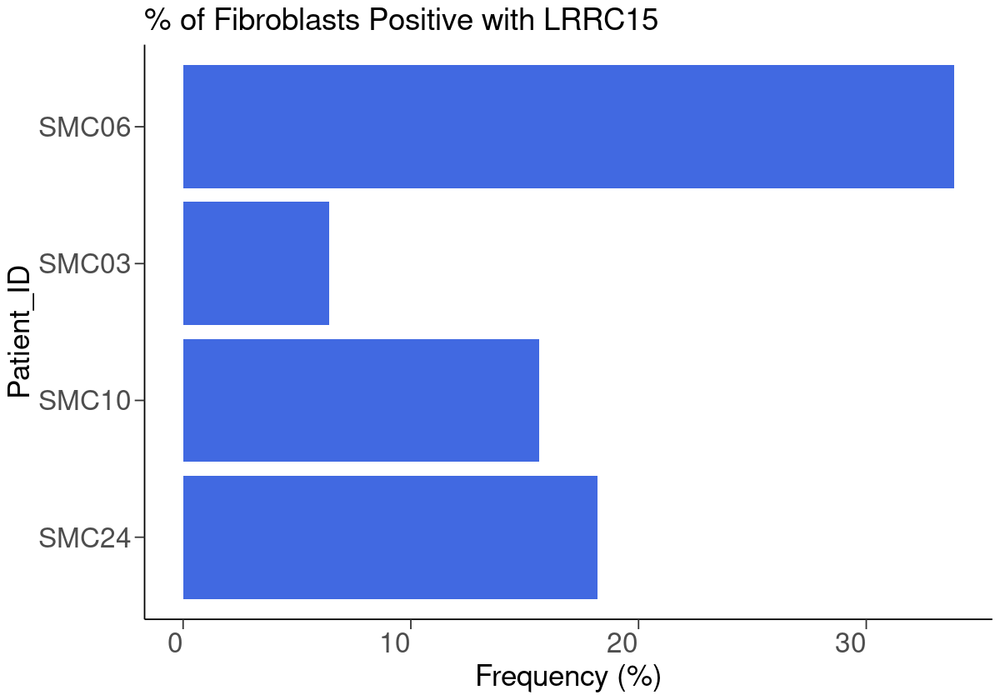

In [80]:
gene_exp <- GetAssayData(object = msi_obj, slot = "data")
# gene_exp <- GetAssayData(object = msi_obj, slot = "data")
gene_of_interest <- 'LRRC15'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(msi_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.msi.df2 <- df %>% filter(Cell_subtype == 'Myofibroblasts') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.msi.df2$Freq <- plot.msi.df2$Freq *100
plot.msi.df2$Patient <- factor(plot.msi.df2$Patient, levels = patients.sorted)

ggplot(plot.msi.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_subtype", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

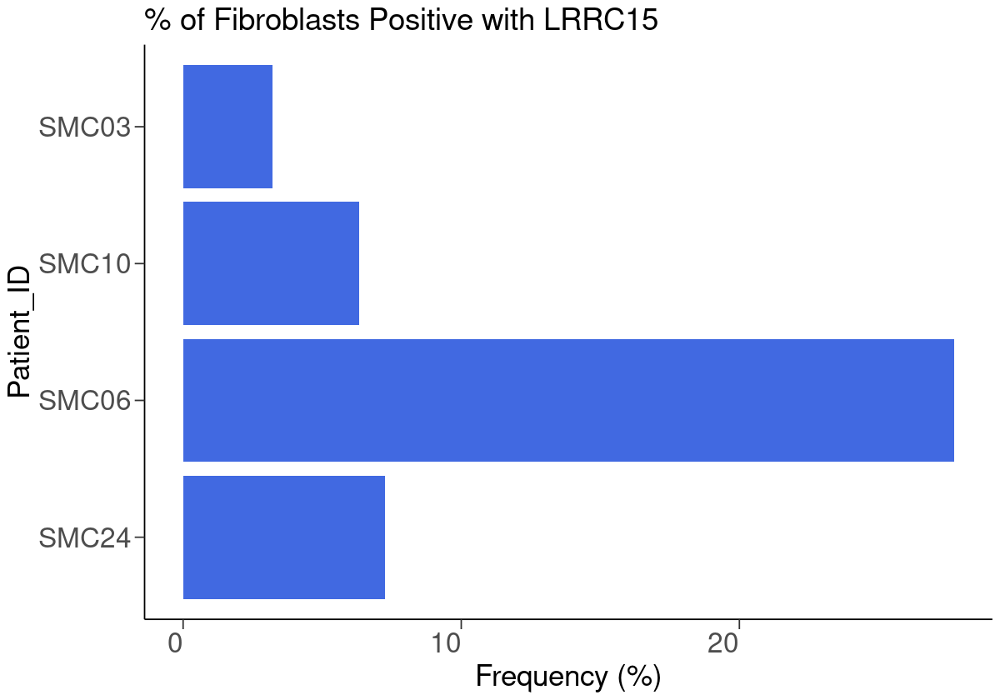

In [49]:
plot.msi.df3 <- merge(plot.msi.df1, plot.msi.df2, by = 'Patient')
plot.msi.df3$Freq2 <- (plot.msi.df3$freq * plot.msi.df3$Freq)/100
plot.msi.df3$Patient <- factor(plot.msi.df3$Patient, levels = patients.sorted)


ggplot(plot.msi.df3, aes(x = Patient, y = Freq2)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_Type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with LRRC15'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22)) 

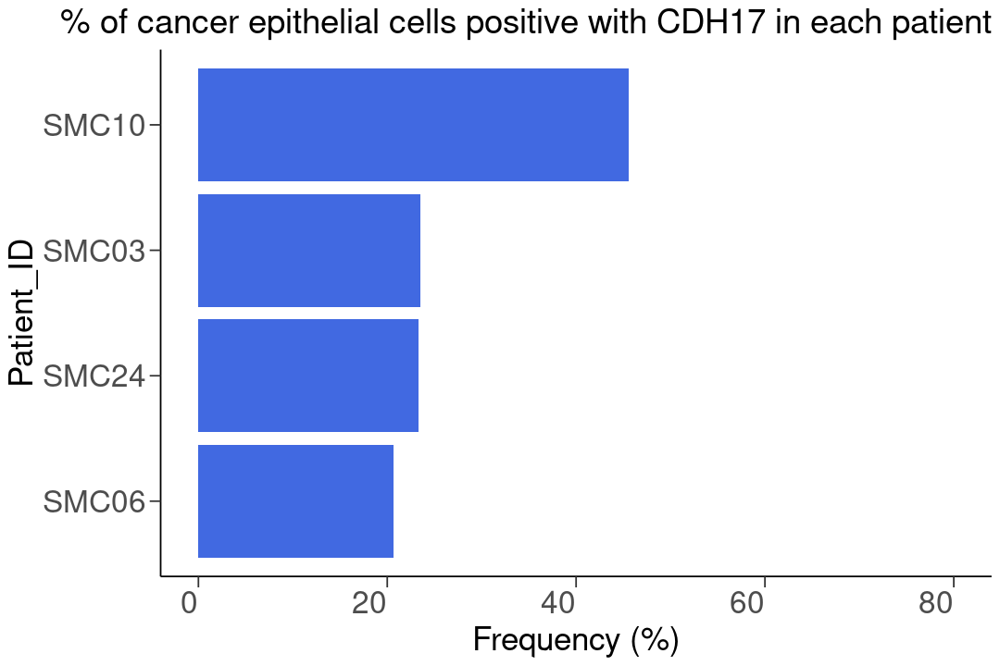

In [49]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = msi_obj, slot = "data")
# gene_exp <- GetAssayData(object = msi_obj, slot = "data")
gene_of_interest <- 'CDH17'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(msi_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.msi.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.msi.df2$Freq <- plot.msi.df2$Freq *100

patients.sorted <- plot.msi.df2 %>% arrange(Freq) %>% pull(Patient)

plot.msi.df2$Patient <- factor(plot.msi.df2$Patient, levels = patients.sorted)

ggplot(plot.msi.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
ylim(0, 80) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with CDH17 in each patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

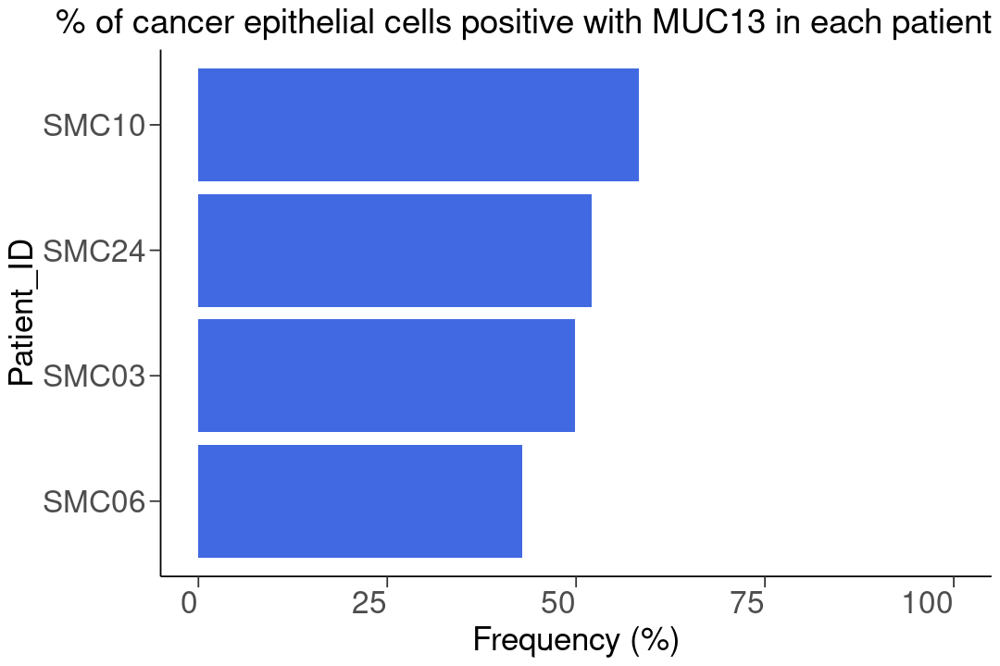

In [63]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = msi_obj, slot = "data")
# gene_exp <- GetAssayData(object = msi_obj, slot = "data")
gene_of_interest <- 'MUC13'
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(msi_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.msi.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.msi.df2$Freq <- plot.msi.df2$Freq *100

patients.sorted <- plot.msi.df2 %>% arrange(Freq) %>% pull(Patient)

plot.msi.df2$Patient <- factor(plot.msi.df2$Patient, levels = patients.sorted)

ggplot(plot.msi.df2, aes(x = Patient, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
ylim(0, 100) +
# scale_fill_manual(name="Cell_type", values=colors) + 
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer epithelial cells positive with MUC13 in each patient'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

In [64]:
summary(plot.mss.df2$Freq)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  22.50   33.05   47.89   49.79   62.38   90.84 

In [65]:
summary(plot.msi.df2$Freq)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  42.86   48.12   50.96   50.77   53.62   58.32 

In [54]:
wilcox.test(plot.mss.df2$Freq, plot.msi.df2$Freq)


	Wilcoxon rank sum exact test

data:  plot.mss.df2$Freq and plot.msi.df2$Freq
W = 60, p-value = 0.08108
alternative hypothesis: true location shift is not equal to 0


In [55]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LRRC15', 'ACTA2')

cnt <- GetAssayData(object = seu_obj_filtered, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(seu_obj_filtered@meta.data, cnt, by = 'row.names')


write.table(df, "data/CRC_count_matrix.LRRC15_ACTA2.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

In [ ]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LRRC15', 'CTSB', 'CTSL', 'FAP', 'MKI67', 'CD274', 'PDCD1')

cnt <- GetAssayData(object = seu_obj_filtered, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(seu_obj_filtered@meta.data, cnt, by = 'row.names')


write.table(df, "data/CRC_count_matrix.LRRC15_Cathepsins_FAP_KI67_CD274_PDCD1.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


In [18]:
# Extract the lognormazed expression matrix for CCR8 and FOXP3
gene_list <- c('LRRC15', 'MKI67')

cnt <- GetAssayData(object = seu_obj_filtered, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(seu_obj_filtered@meta.data, cnt, by = 'row.names')


write.table(df, "data/CRC_count_matrix.LRRC15_MKI67.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

Warning message:
"The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead."


In [20]:
tumor_obj <- subset(seu_obj_filtered, Class == 'Tumor')

In [29]:
target_dir <- '~/github/Bioinformatics/Target_review/Membrane_protein_selections'
# gene_list <- rio::import(glue('{target_dir}/DEGs.upregulated_in_both_CRC_and_PDAC.log2FC_greater_2.csv'))
gene_list <- rio::import(glue('{target_dir}/DEGs.upregulated_in_both_CRC_and_PDAC.log2FC_greater_1.5.csv'))
gene_list <- gene_list$Gene
gene_list <- unique(c('MUC13', gene_list))
all_genes <- rownames(GetAssayData(object = tumor_obj, slot = "data"))
gene_list <- intersect(all_genes, gene_list)
# head(gene_list, 2)
# Extract the lognormazed expression matrix for CCR8 and FOXP3
# gene_list <- c('LRRC15', 'ACTA2')

cnt <- GetAssayData(object = tumor_obj, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(tumor_obj@meta.data, cnt, by = 'row.names')


# write.table(df, "data/CRC_count_matrix.MUC13_and_other_membrane_genes.tsv", quote = F,
#            col.names =T, row.names = F, append = F, sep = "\t")
write.table(df, "data/CRC_count_matrix.MUC13_and_other_membrane_genes.logFC_1.5.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

In [30]:
target_dir <- '~/github/Bioinformatics/Target_review/Membrane_protein_selections'
# gene_list <- rio::import(glue('{target_dir}/DEGs.upregulated_in_both_CRC_and_PDAC.log2FC_greater_2.csv'))
gene_list <- rio::import(glue('{target_dir}/DEGs.upregulated_in_CRC.log2FC_greater_1.5.csv'))
gene_list <- gene_list$Gene
gene_list <- unique(c('MUC13', gene_list))
all_genes <- rownames(GetAssayData(object = tumor_obj, slot = "data"))
gene_list <- intersect(all_genes, gene_list)
# head(gene_list, 2)
# Extract the lognormazed expression matrix for CCR8 and FOXP3
# gene_list <- c('LRRC15', 'ACTA2')

cnt <- GetAssayData(object = tumor_obj, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(tumor_obj@meta.data, cnt, by = 'row.names')


# write.table(df, "data/CRC_count_matrix.MUC13_and_other_membrane_genes.tsv", quote = F,
#            col.names =T, row.names = F, append = F, sep = "\t")
write.table(df, "data/CRC_count_matrix.MUC13_and_other_membrane_genes.logFC_1.5.CRC.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

In [32]:
target_dir <- '~/github/Bioinformatics/Target_review/Membrane_protein_selections'
# gene_list <- rio::import(glue('{target_dir}/DEGs.upregulated_in_both_CRC_and_PDAC.log2FC_greater_2.csv'))
gene_list <- rio::import(glue('{target_dir}/DEGs.DESeq2.upregulated_in_CRC.log2FC_greater_1.csv'))
gene_list <- gene_list$Gene
gene_list <- unique(c('MUC13', gene_list))
all_genes <- rownames(GetAssayData(object = tumor_obj, slot = "data"))
gene_list <- intersect(all_genes, gene_list)
# head(gene_list, 2)
# Extract the lognormazed expression matrix for CCR8 and FOXP3
# gene_list <- c('LRRC15', 'ACTA2')

cnt <- GetAssayData(object = tumor_obj, slot = "data")[gene_list, ]

cnt <- as.data.frame(t(cnt))

df = merge(tumor_obj@meta.data, cnt, by = 'row.names')


# write.table(df, "data/CRC_count_matrix.MUC13_and_other_membrane_genes.tsv", quote = F,
#            col.names =T, row.names = F, append = F, sep = "\t")
write.table(df, "data/CRC_count_matrix.MUC13_and_other_membrane_genes.DESeq2_logFC_1.CRC.tsv", quote = F,
           col.names =T, row.names = F, append = F, sep = "\t")

In [24]:
mss_obj

An object of class Seurat 
50207 features across 39811 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [26]:
table(mss_obj$Patient)


SMC01 SMC02 SMC04 SMC05 SMC07 SMC08 SMC09 SMC11 SMC14 SMC15 SMC16 SMC17 SMC18 
 2789  1682  1840   660  4068  2086  3789  1697  1749  2026  2956  1339  1933 
SMC19 SMC20 SMC21 SMC22 SMC23 SMC25 
 1540  1681  2348  2360  1638  1630 

In [27]:
length(unique(mss_obj$Patient))

[1] 19

In [51]:
options(repr.plot.width = 9, repr.plot.height = 6)
gene_exp <- GetAssayData(object = mss_obj, slot = "data")
# gene_exp <- GetAssayData(object = mss_obj, slot = "data")
G <- 'MUC13'
gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.mss.df2$Freq <- plot.mss.df2$Freq *100

plot.mss.df2$hgnc_symbol <- G
plot.mss.df2 <- plot.mss.df2 %>% select(Patient, hgnc_symbol, Freq)

plot.mss.df2


Patient,hgnc_symbol,Freq
<chr>,<chr>,<dbl>
SMC01,MUC13,47.89377
SMC02,MUC13,53.12500
SMC04,MUC13,47.88274
SMC05,MUC13,30.76923
SMC07,MUC13,29.88930
SMC08,MUC13,22.50000
SMC09,MUC13,26.86804
SMC11,MUC13,43.38462
SMC14,MUC13,44.57831


In [42]:
genes <- c('CEACAM5', 
         'EGFR', 'VEGFA', 'KDR', 'ERBB2', 
         'MET', 
         'LAG3', 'CD276')
gene_exp <- GetAssayData(object = mss_obj, slot = "data")



In [43]:
plot_df <- NULL

for(G in genes){
    # G <- 'MUC13'
    gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
    names(gene_exp_sub) <- 'Gene_exp'
    gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
    df = merge(mss_obj@meta.data, gene_exp_sub, by = 'row.names')
    
    plot.mss.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(Patient) %>%
    summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
    plot.mss.df2$Freq <- plot.mss.df2$Freq *100
    
    plot.mss.df2$hgnc_symbol <- G
    plot.mss.df2 <- plot.mss.df2 %>% select(Patient, hgnc_symbol, Freq)
    plot_df <- rbind(plot_df, plot.mss.df2)
    }

In [44]:
head(plot_df)

Patient,hgnc_symbol,Freq
<chr>,<chr>,<dbl>
SMC01,CEACAM5,81.77656
SMC02,CEACAM5,78.69318
SMC04,CEACAM5,73.61564
SMC05,CEACAM5,61.53846
SMC07,CEACAM5,74.35424
SMC08,CEACAM5,64.06250


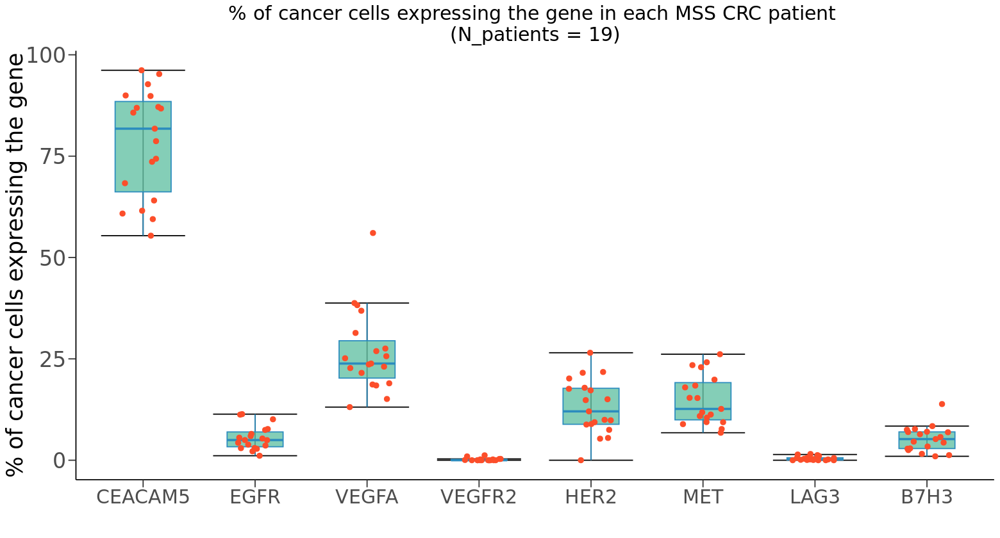

In [49]:
options(repr.plot.width = 13, repr.plot.height = 7)
genes <- gsub('KDR', 'VEGFR2', genes)
genes <- gsub('ERBB2', 'HER2', genes)
genes <- gsub('CD276', 'B7H3', genes)

plot_df$hgnc_symbol <- gsub('KDR', 'VEGFR2', plot_df$hgnc_symbol)
plot_df$hgnc_symbol <- gsub('ERBB2', 'HER2', plot_df$hgnc_symbol)
plot_df$hgnc_symbol <- gsub('CD276', 'B7H3', plot_df$hgnc_symbol)

plot_df$hgnc_symbol <- factor(plot_df$hgnc_symbol, levels = genes)

ggplot(plot_df, aes(x = hgnc_symbol, y = Freq)) +
stat_boxplot(geom ='errorbar') + 
       geom_boxplot(fill="#66C2A5", color="#2B8CBE", alpha=0.8, width = 0.5, outliers = F) + 
  geom_jitter(width=0.2, colour = "#FC4E2A", size = 2) +

# coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer cells expressing the gene in each MSS CRC patient \n(N_patients = 19)'),
        x = "",
        y = "% of cancer cells expressing the gene") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 18),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18, hjust = 0.5)) +
guides(fill = guide_legend(reverse = TRUE))

In [18]:
# tumor_obj <- subset(seu_obj_filtered, Class == 'Tumor')

In [23]:
tumor_obj 

An object of class Seurat 
50207 features across 47253 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [19]:
Idents(tumor_obj) <- "Cell_type"

Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


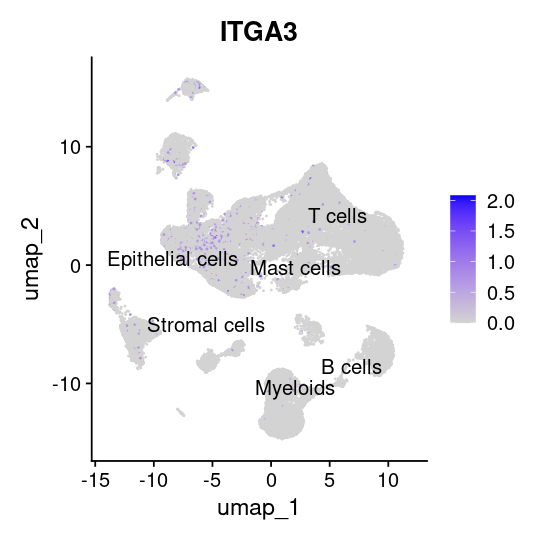

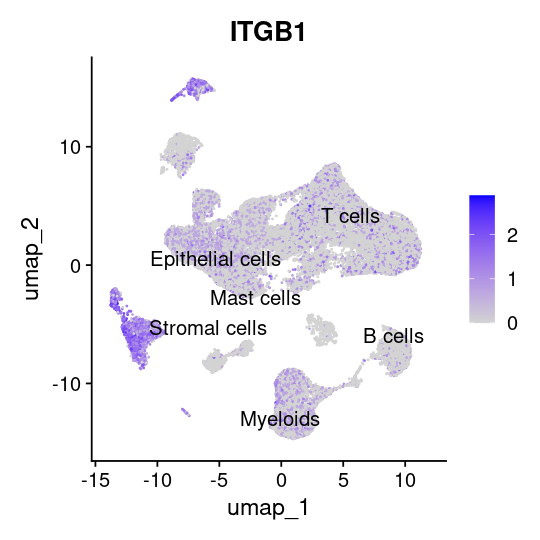

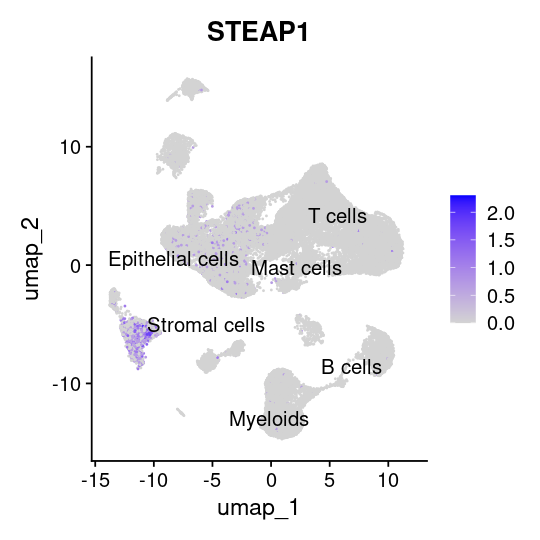

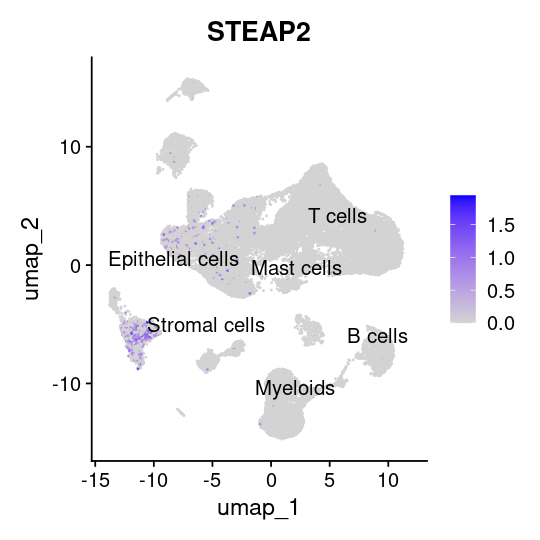

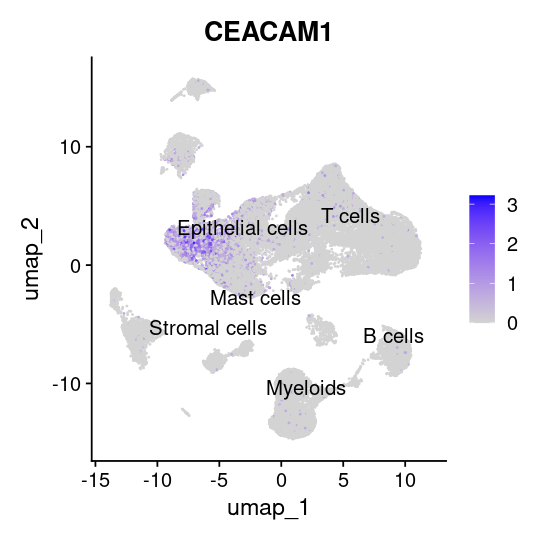

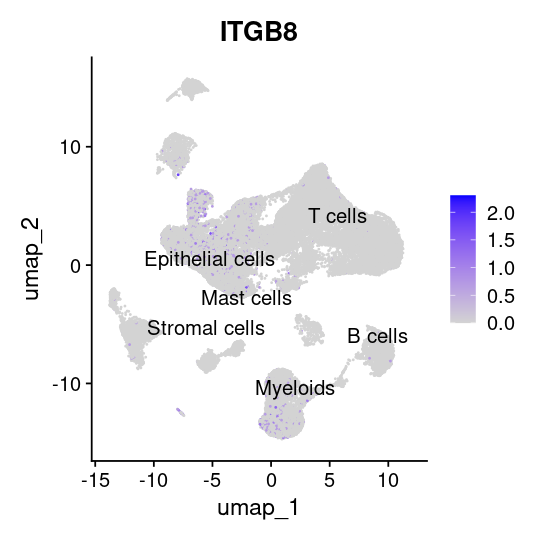

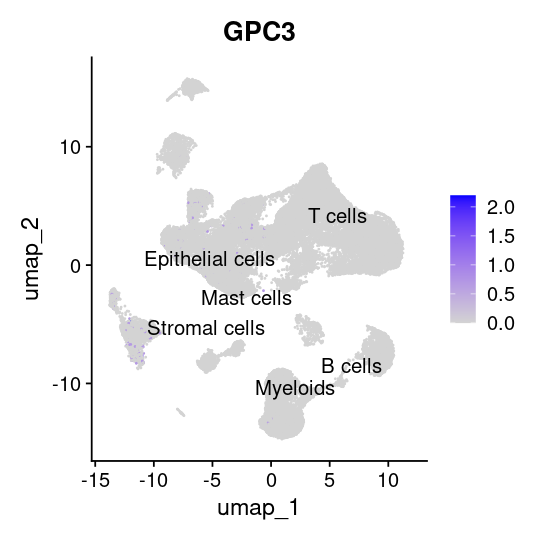

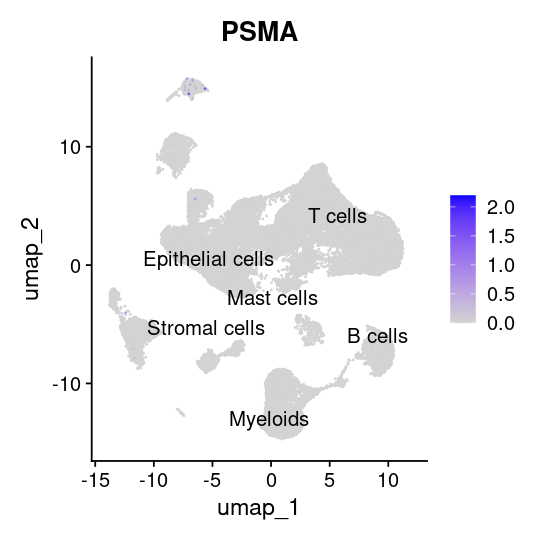

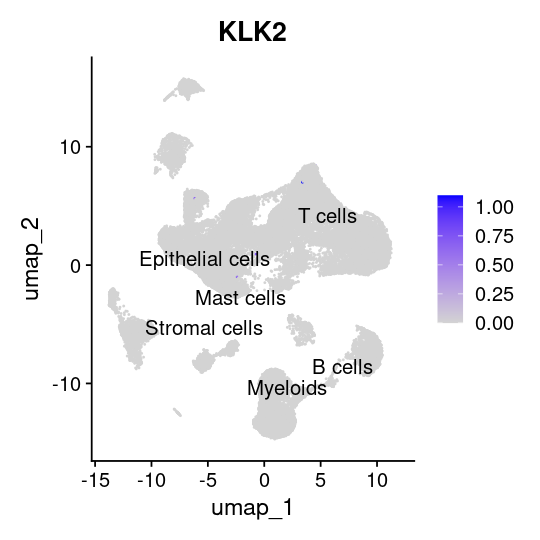

In [21]:
options(repr.plot.width = 4.5, repr.plot.height = 4.5)
options(ggrepel.max.overlap = 25)

for(gene in c('ITGA3', 'ITGB1', 'STEAP1', 'STEAP2', 'CEACAM1', 
               'ITGB8', 'GPC3', 'FOLH1', 'KLK2')){
  p <- FeaturePlot(tumor_obj, features = gene, label = TRUE, repel = TRUE, label.size = 4.3)
  
  if(gene == 'FOLH1') {
    p <- p + ggtitle('PSMA')
  } else if(gene == 'TPBG') {
    p <- p + ggtitle('5T4')
  }
  
  print(p) # This explicit print is crucial
     # Sys.sleep(0.1)
  
}

Warning message:
“The `slot` argument of `FetchData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.
ℹ The deprecated feature was likely used in the Seurat package.
  Please report the issue at <https://github.com/satijalab/seurat/issues>.”


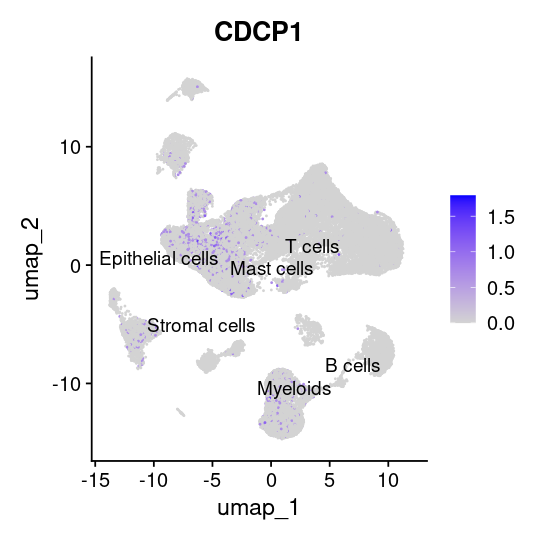

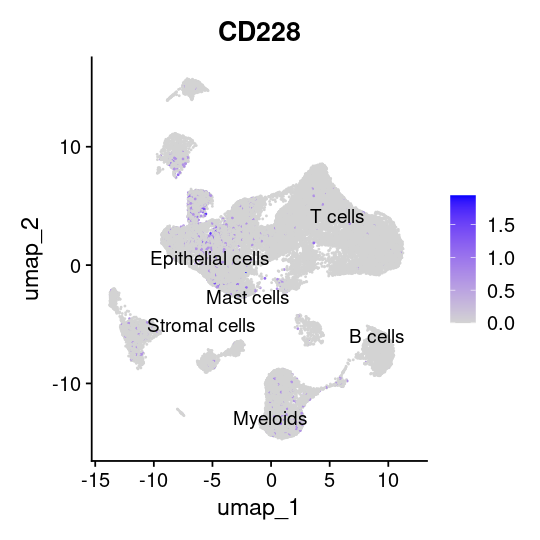

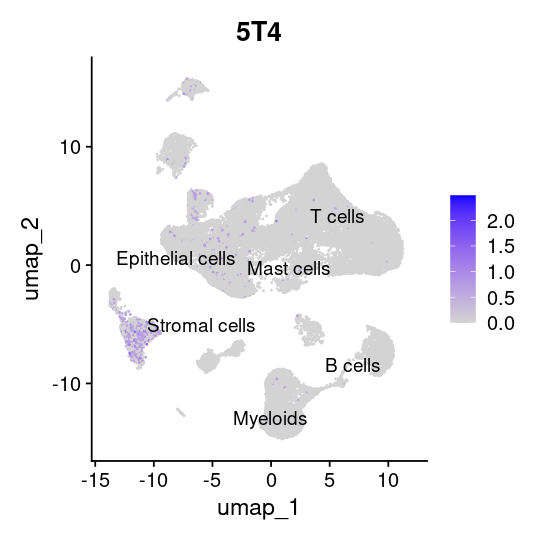

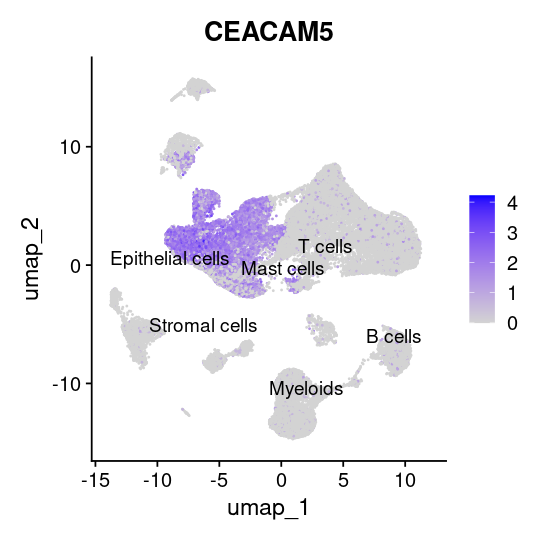

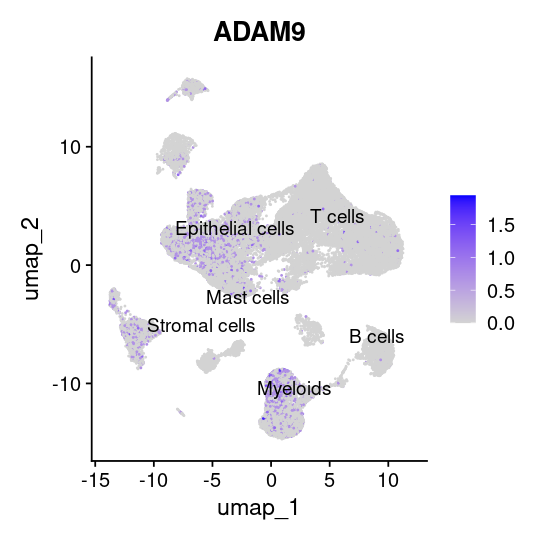

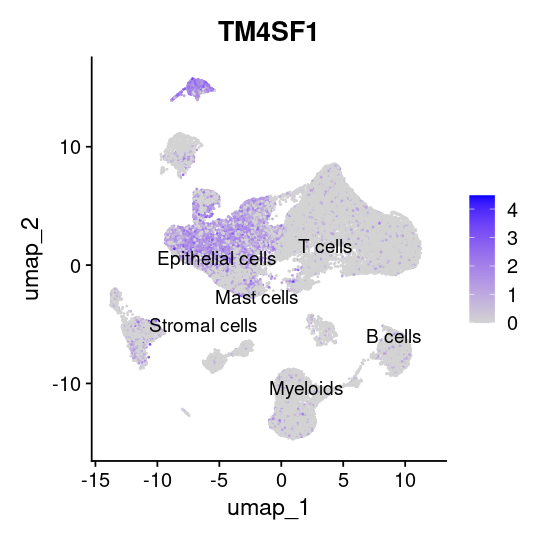

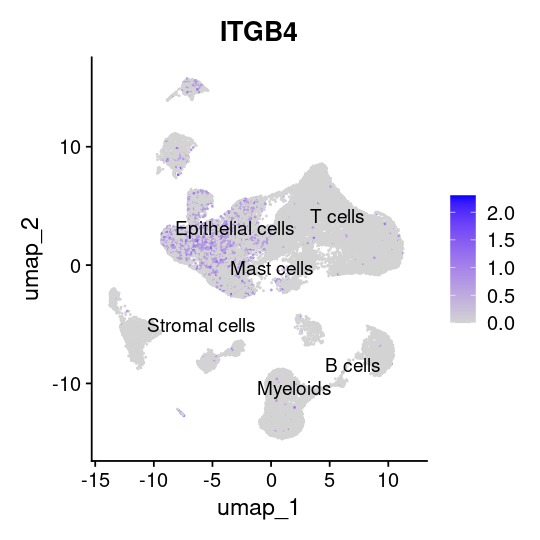

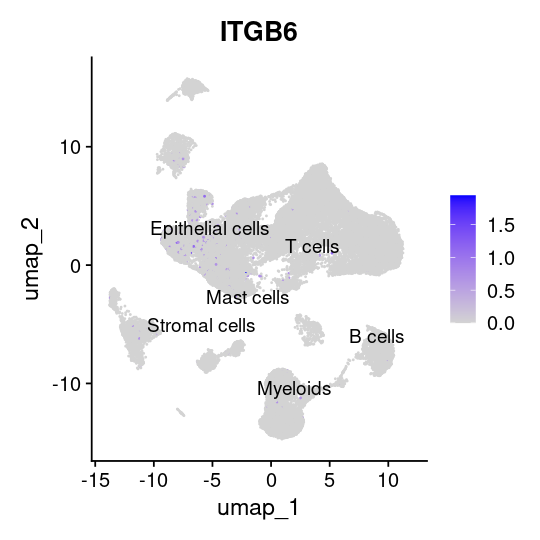

In [15]:
options(repr.plot.width = 4.5, repr.plot.height = 4.5)
options(ggrepel.max.overlap = 25)

for(gene in c('CDCP1', 'MFI2', 'TPBG', 'CEACAM5', 'ADAM9', 'TM4SF1', 'ITGB4', 'ITGB6')){
  p <- FeaturePlot(tumor_obj, features = gene, label = TRUE, repel = TRUE)
  
  if(gene == 'MFI2') {
    p <- p + ggtitle('CD228')
  } else if(gene == 'TPBG') {
    p <- p + ggtitle('5T4')
  }
  
  print(p) # This explicit print is crucial
     # Sys.sleep(0.1)
  
}

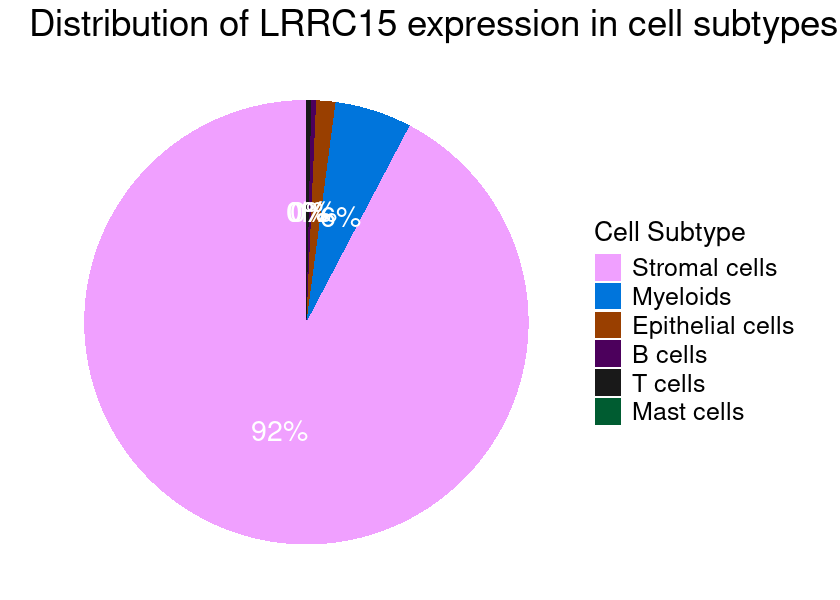

In [26]:
gene_of_interest <- 'LRRC15'

gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% 
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)
# cell.sorted <- levels(df.Cancer$Cell_Type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")

p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


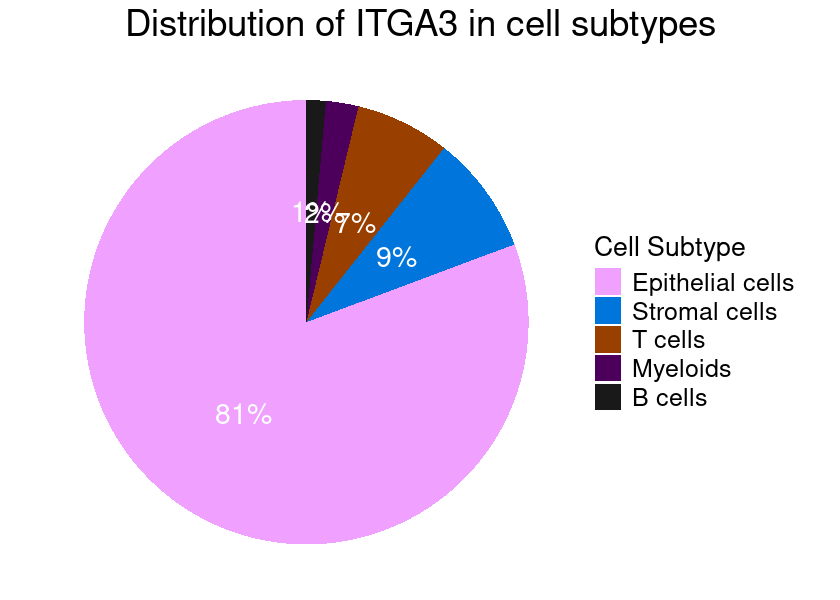

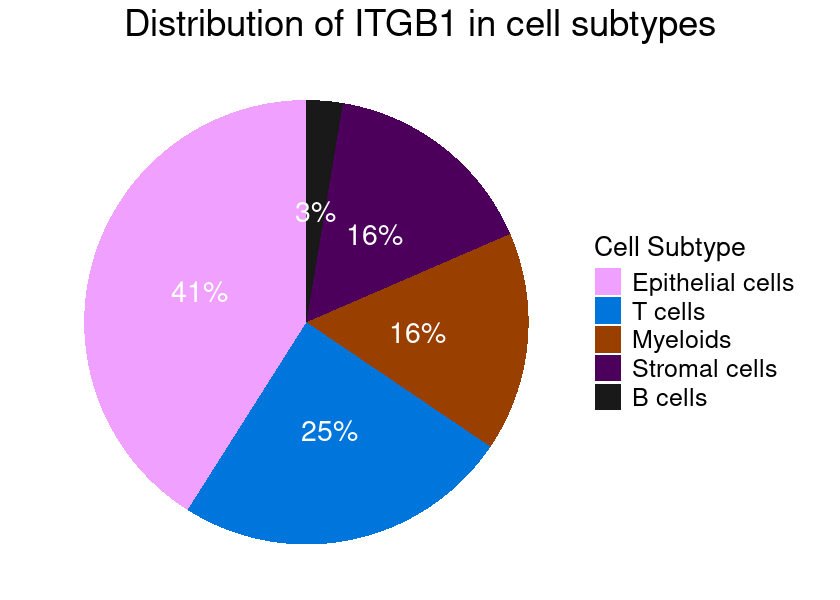

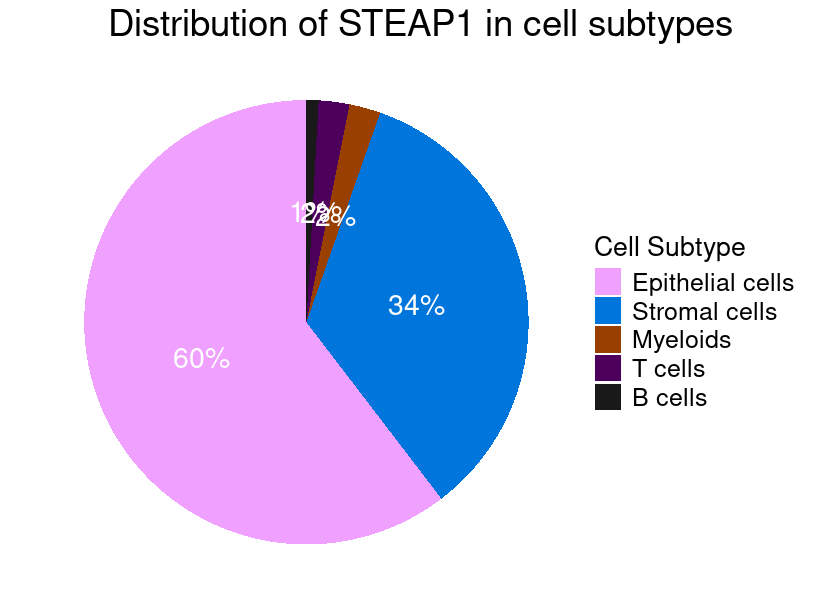

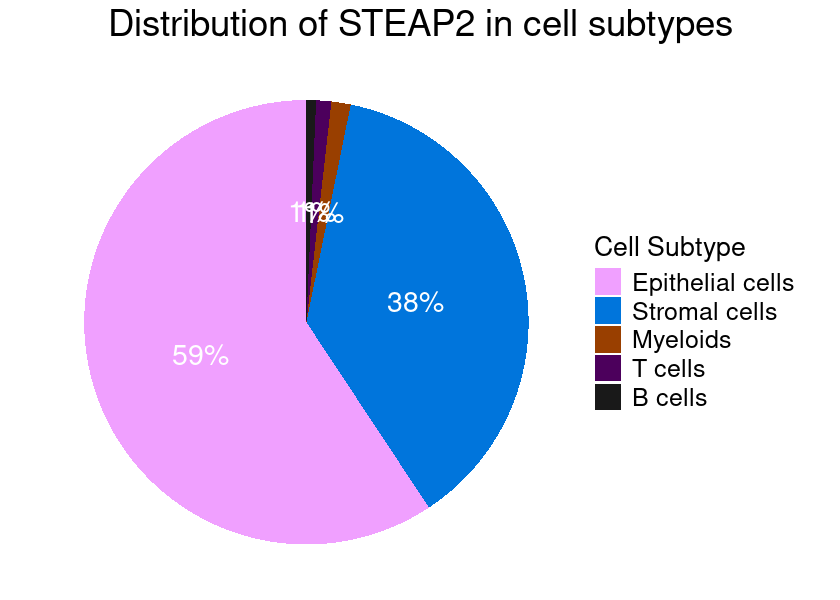

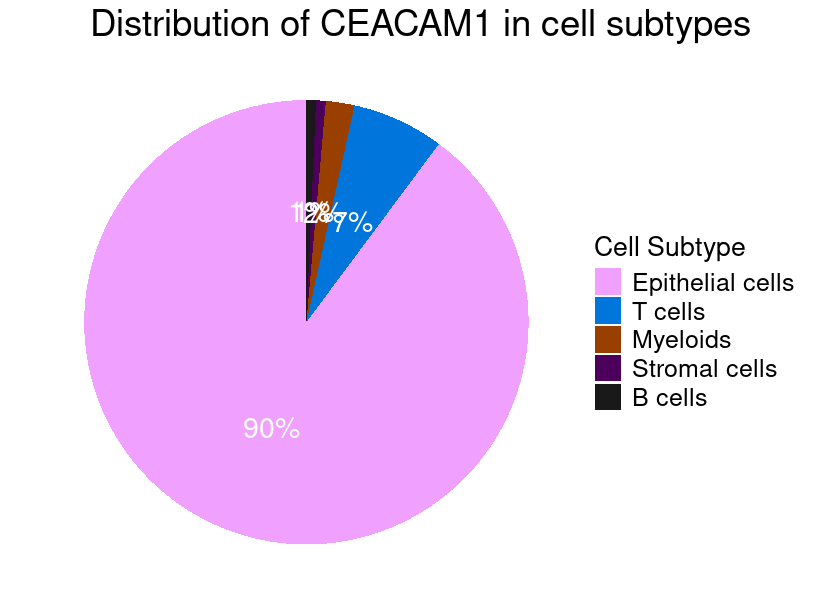

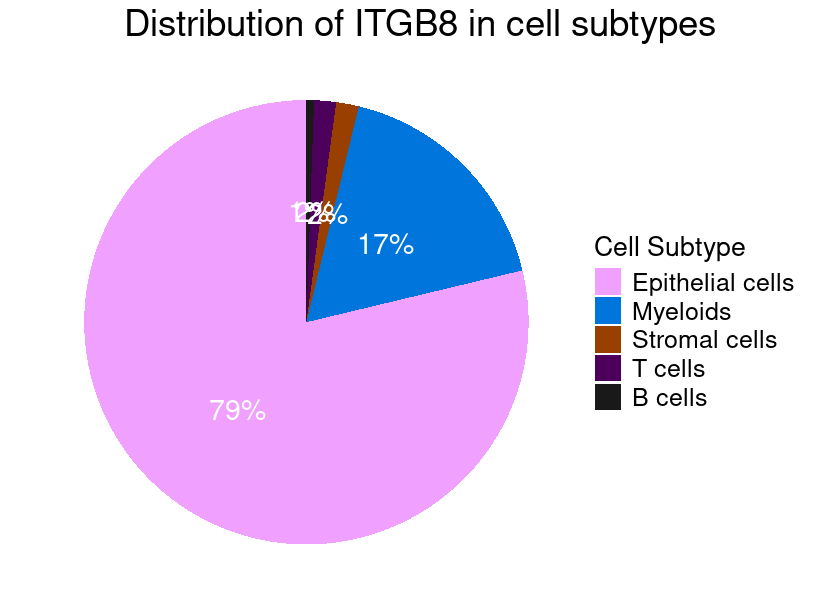

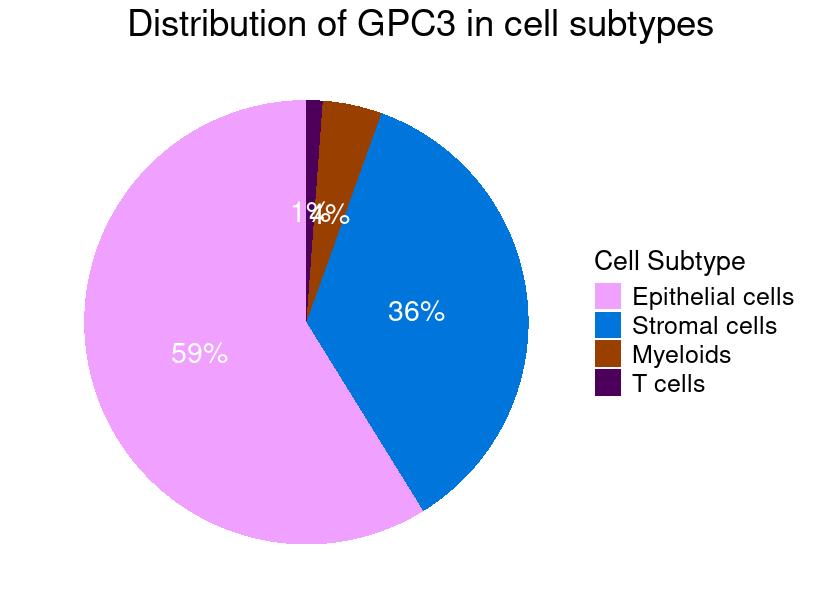

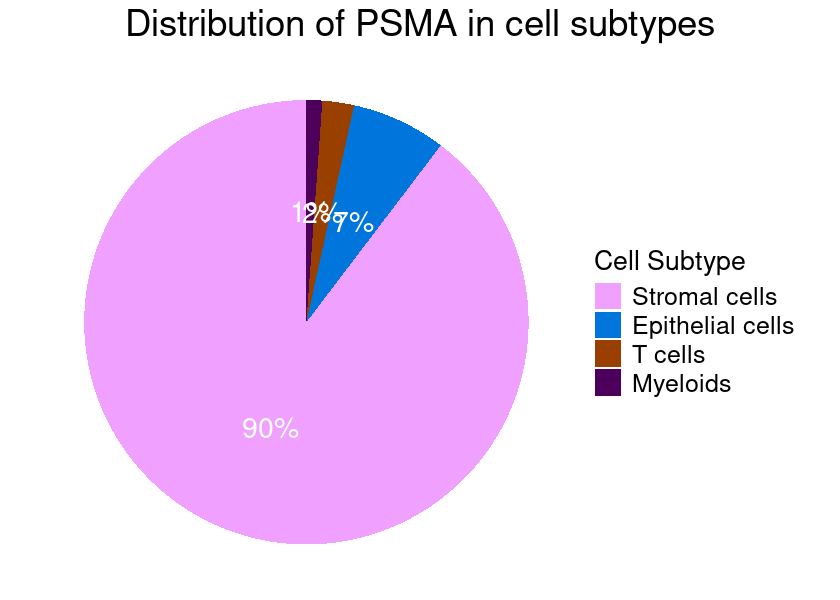

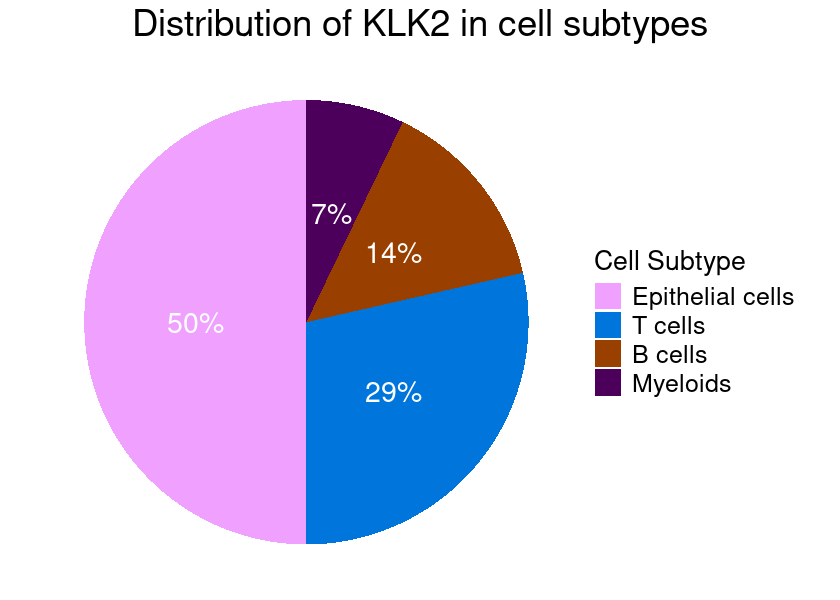

In [22]:
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

for(gene_of_interest in c('ITGA3', 'ITGB1', 'STEAP1', 'STEAP2', 'CEACAM1', 
               'ITGB8', 'GPC3', 'FOLH1', 'KLK2')){
# cell_type <- ''
    if(gene_of_interest == 'FOLH1'){
        gene_label <- 'PSMA'
    }else if(gene_of_interest == 'TPBG'){
        gene_label <- '5T4'
    }else{
        gene_label <- gene_of_interest
    }
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% 
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)
# cell.sorted <- levels(df.Cancer$Cell_Type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")

p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_label} in cell subtypes')) +
            theme(plot.title = element_text(size=22, hjust = 0.5), plot.title.position = "plot", 
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 
    }

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


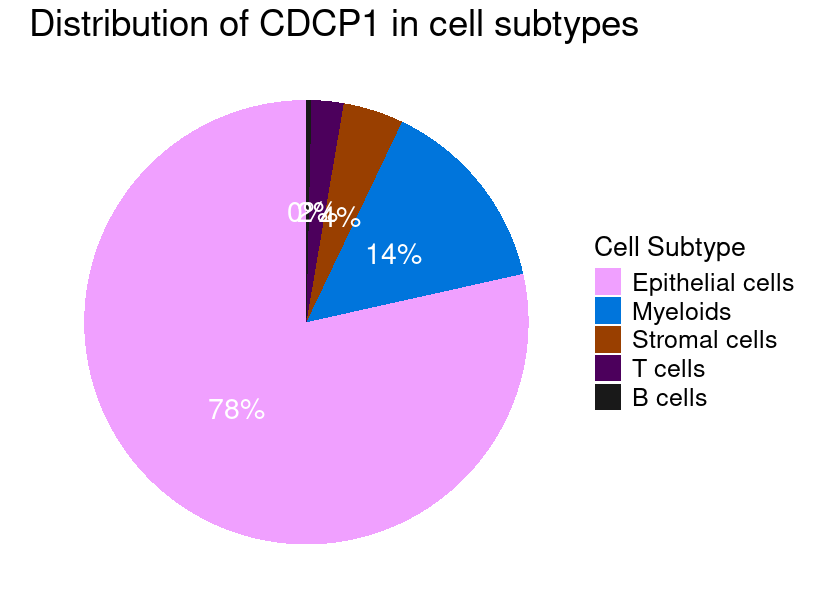

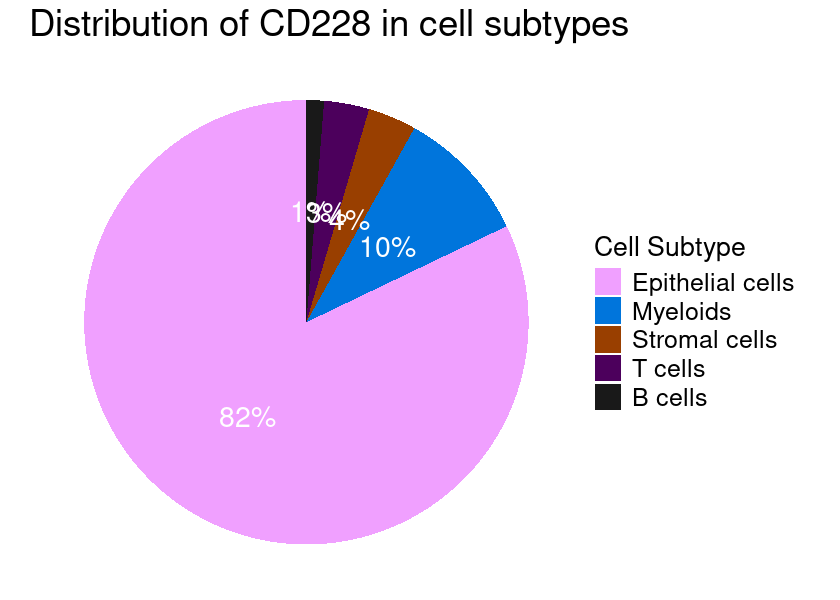

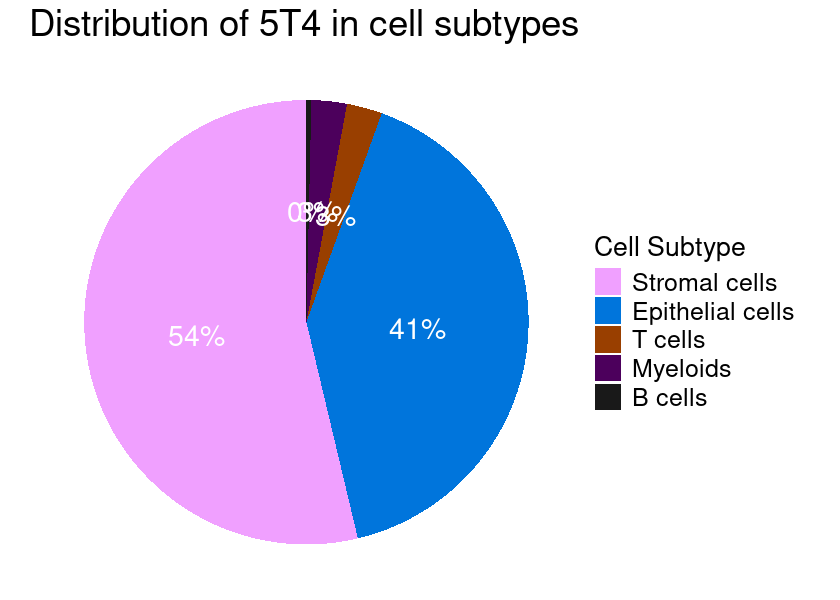

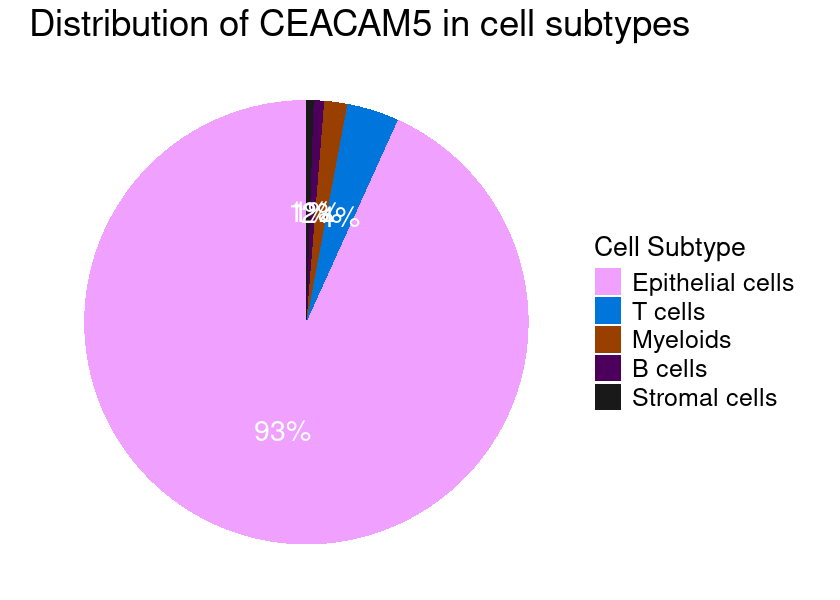

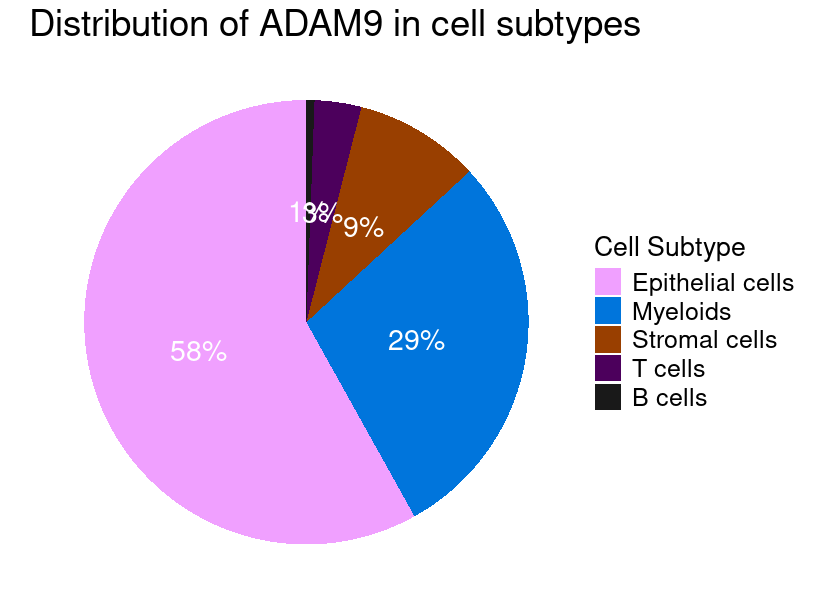

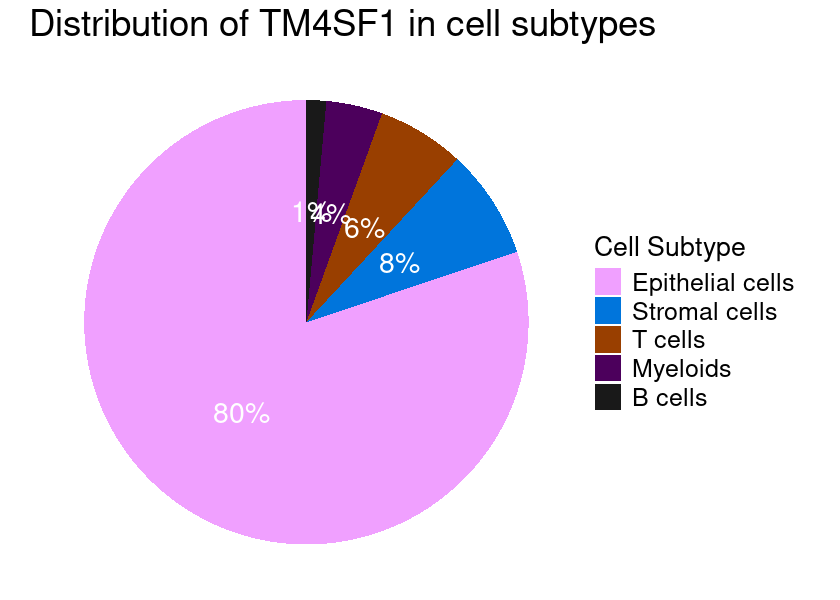

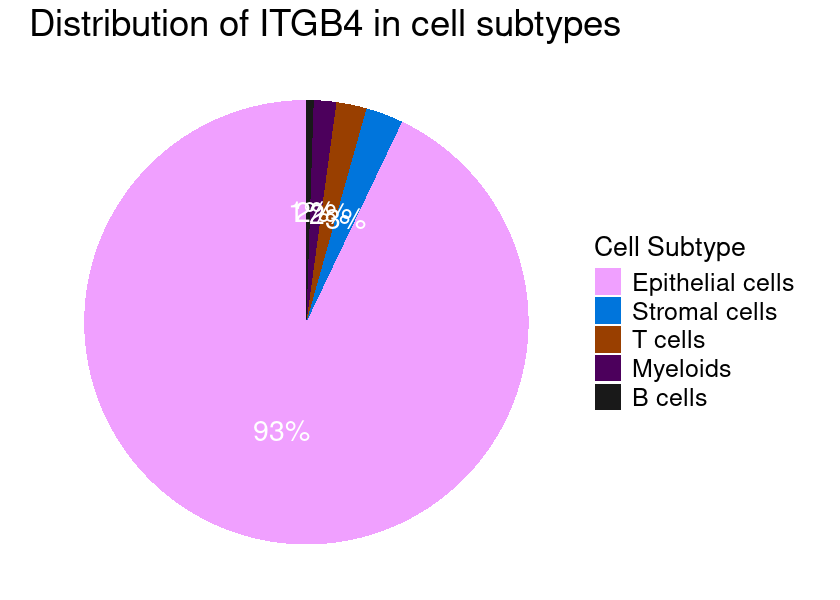

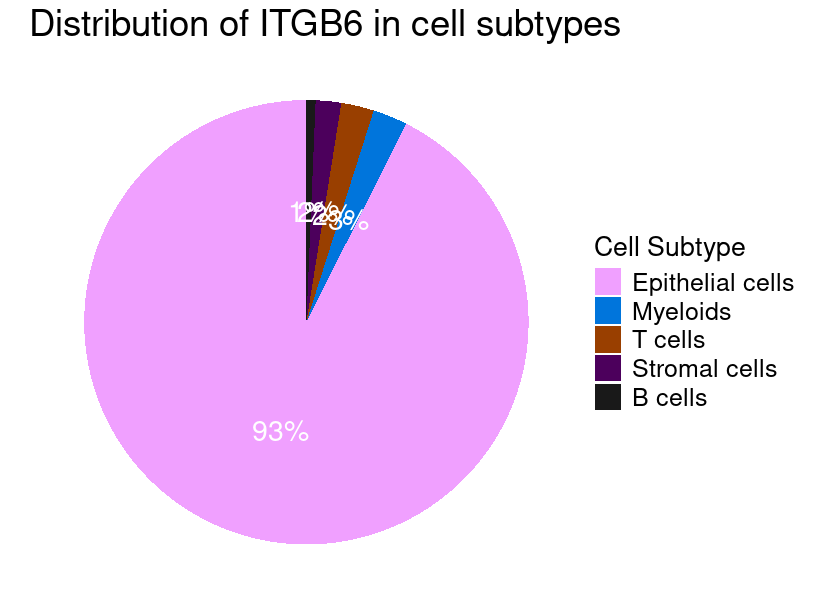

In [16]:
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

for(gene_of_interest in c('CDCP1', 'MFI2', 'TPBG', 'CEACAM5', 'ADAM9', 'TM4SF1', 'ITGB4', 'ITGB6')){
# cell_type <- ''
    if(gene_of_interest == 'MFI2'){
        gene_label <- 'CD228'
    }else if(gene_of_interest == 'TPBG'){
        gene_label <- '5T4'
    }else{
        gene_label <- gene_of_interest
    }
gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% 
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)
# cell.sorted <- levels(df.Cancer$Cell_Type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")

p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_label} in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 
    }

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


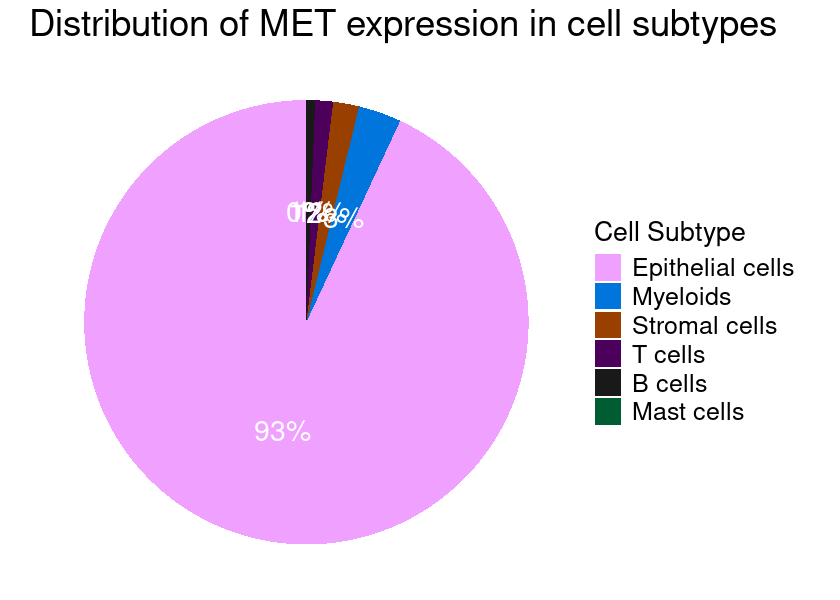

In [25]:
gene_of_interest <- 'MET'

gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% 
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)
# cell.sorted <- levels(df.Cancer$Cell_Type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")

p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

Warning message:
“The `slot` argument of `GetAssayData()` is deprecated as of SeuratObject 5.0.0.
ℹ Please use the `layer` argument instead.”


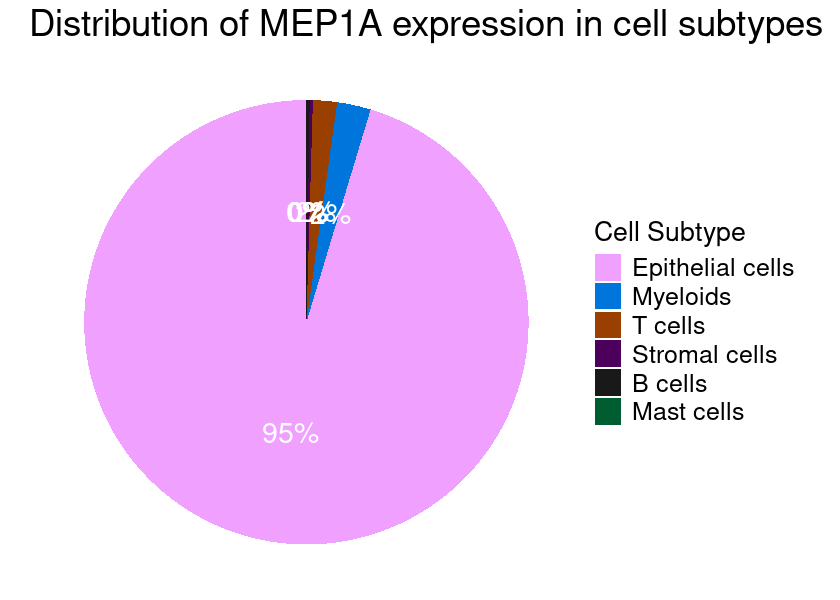

In [29]:
gene_of_interest <- 'MEP1A'

gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')


options(repr.plot.width = 7, repr.plot.height = 5)

df.Cancer <- df %>% 
filter(Gene_cat == 'Positive') %>% {table( .$Cell_type)} %>% 
prop.table() %>% as.data.frame() %>% arrange(Freq)
# cell.sorted <- levels(df.Cancer$Cell_Type)

plot.df <- df.Cancer %>% arrange(Freq) 
plot.df$Freq <- plot.df$Freq * 100
cell.sorted <- unique(plot.df$Var1)
plot.df$Var1 <- factor(plot.df$Var1, levels = cell.sorted)
plot.df$Var2 <- factor(plot.df$Var1, levels = rev(cell.sorted))

plot.df$Freq2 <- plot.df$Freq/100

n_colors <- length(levels(as.factor(plot.df$Var2)))
# alphabet", "alphabet2", "glasbey", "polychrome", "stepped", and "parade".
colors <- DiscretePalette(n_colors, palette = "alphabet")

p1 <- ggplot(plot.df, aes(x="", y= Freq2, fill=Var2)) +
 geom_col() +
scale_fill_manual(values=colors, name = 'Cell Subtype') +
 # geom_text_repel(aes(label = scales::percent(round(Freq2,3))), 
 #           position = position_stack(vjust = 0.5), 
 #           colour = 'white', size = 7, max.overlaps = 15)+
 geom_text(aes(label = scales::percent(round(Freq2,2))), 
           position = position_stack(vjust = 0.5), 
           colour = 'white', size = 6)+

# geom_text(aes(label = scales::percent(Freq2)), position = position_stack(vjust = 0.5), colour = 'white')+
 coord_polar(theta = "y") + 
 theme_void() +
labs( title = glue('Distribution of {gene_of_interest} expression in cell subtypes')) +
            theme(plot.title = element_text(size=22),
                #   axis.text.x = element_text(size = 16),
                # axis.text.y = element_text(size = 16),  
                # axis.title.x = element_text( size = 18),
                # axis.title.y = element_text(size = 18), 
                  legend.title=element_text(size=16), 
            legend.text=element_text(size=15)) 
 
print(p1) 

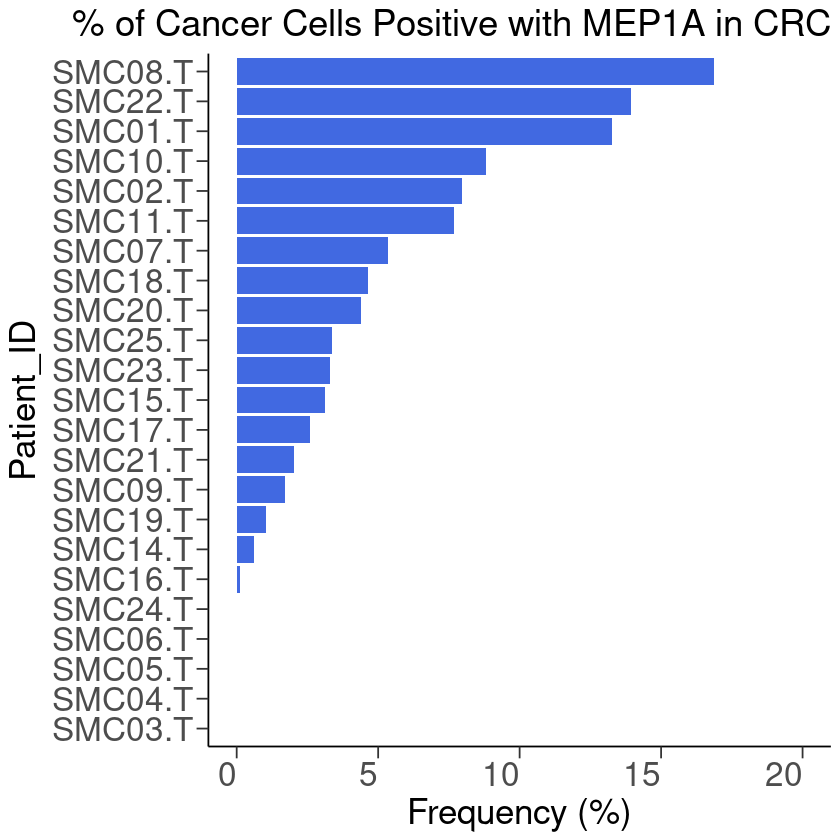

In [34]:
options(repr.plot.width = 7, repr.plot.height = 7)

gene_of_interest <- 'MEP1A'

cell_type <- c('Epithelial cells')
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.df2 <- df %>% filter(Cell_type %in% cell_type) %>% group_by(orig.ident) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.df2$Freq <- plot.df2$Freq *100
patients.sorted <- plot.df2 %>% arrange(Freq) %>% pull(orig.ident)
plot.df2$orig.ident <- factor(plot.df2$orig.ident, levels = patients.sorted)

ggplot(plot.df2, aes(x = orig.ident, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 20)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Cancer Cells Positive with {gene_of_interest} in CRC'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

In [33]:
summary(plot.df2$Freq)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.3564  3.1348  4.3806  6.5214 16.8750 

In [35]:
length(plot.df2$Freq)

[1] 23

In [36]:
seu_obj_cancer

An object of class Seurat 
50207 features across 47253 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

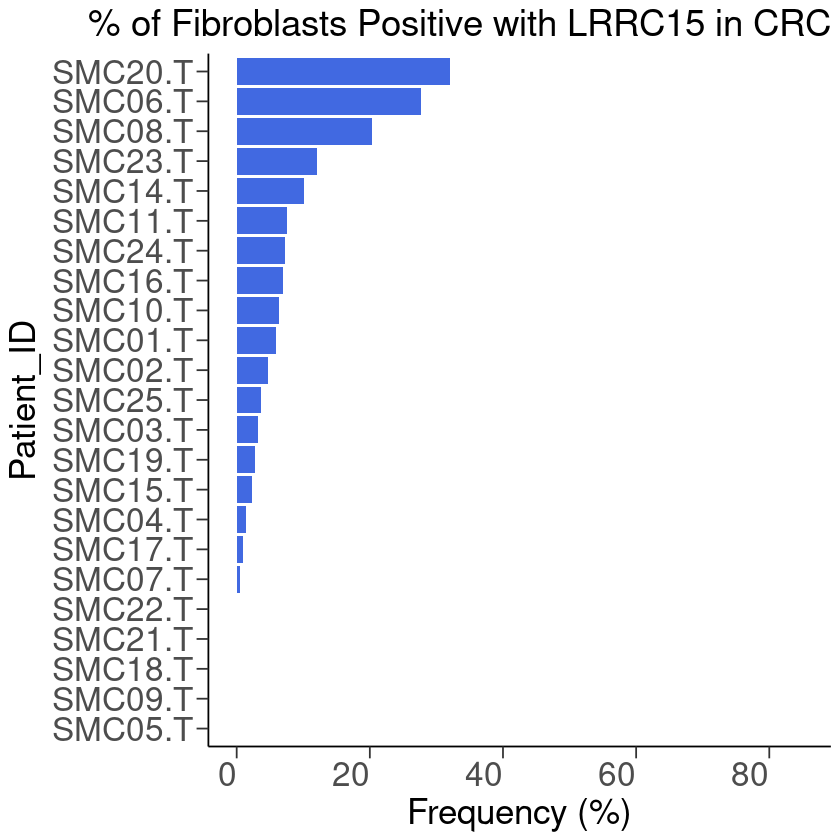

In [33]:
options(repr.plot.width = 7, repr.plot.height = 7)

gene_of_interest <- 'LRRC15'

cell_type <- c('Stromal cells')
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.df2 <- df %>% filter(Cell_type %in% cell_type) %>% group_by(orig.ident) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.df2$Freq <- plot.df2$Freq *100
patients.sorted <- plot.df2 %>% arrange(Freq) %>% pull(orig.ident)
plot.df2$orig.ident <- factor(plot.df2$orig.ident, levels = patients.sorted)

ggplot(plot.df2, aes(x = orig.ident, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 85)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Fibroblasts Positive with {gene_of_interest} in CRC'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

In [38]:
plot.df2 %>% arrange(Freq)

orig.ident,N,N_positive,Freq
<fct>,<int>,<int>,<dbl>
SMC03.T,796,0,0.0000000
SMC04.T,307,0,0.0000000
SMC05.T,13,0,0.0000000
SMC06.T,189,0,0.0000000
SMC24.T,317,0,0.0000000
SMC16.T,2720,3,0.1102941
SMC14.T,166,1,0.6024096
SMC19.T,382,4,1.0471204
SMC09.T,1887,32,1.6958135


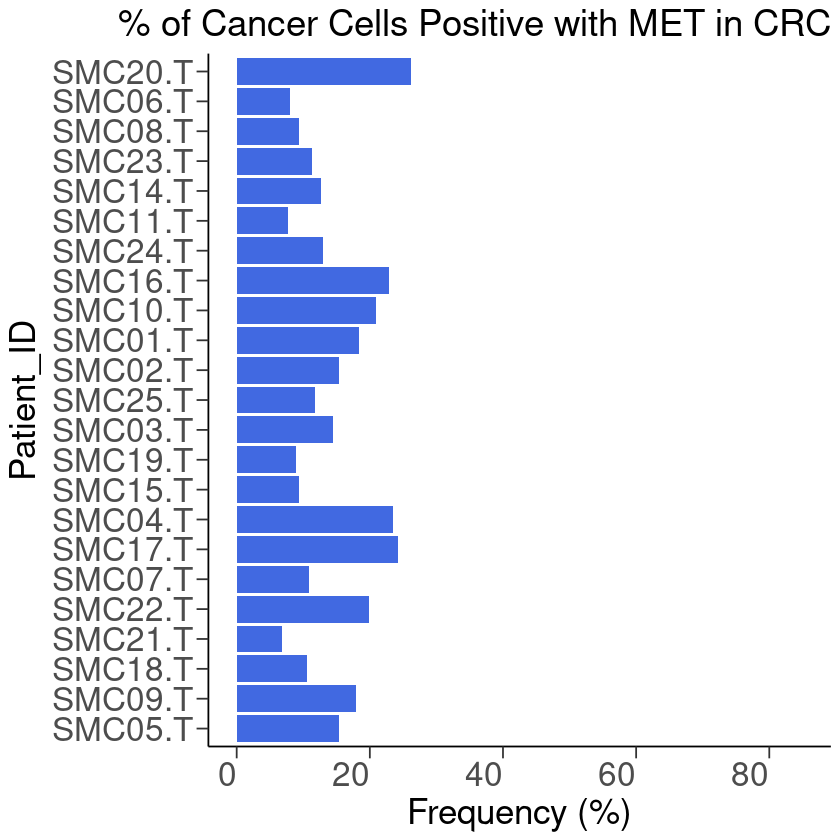

In [35]:
options(repr.plot.width = 7, repr.plot.height = 7)

gene_of_interest <- 'MET'

cell_type <- c('Epithelial cells')
gene_exp <- GetAssayData(object = tumor_obj, slot = "data")
# gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

gene_exp_sub <- gene_exp[gene_of_interest, ] %>% as.data.frame()
names(gene_exp_sub) <- 'Gene_exp'
gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')

plot.df2 <- df %>% filter(Cell_type %in% cell_type) %>% group_by(orig.ident) %>%
summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
plot.df2$Freq <- plot.df2$Freq *100
# patients.sorted <- plot.df2 %>% arrange(Freq) %>% pull(orig.ident)
plot.df2$orig.ident <- factor(plot.df2$orig.ident, levels = patients.sorted)

ggplot(plot.df2, aes(x = orig.ident, y = Freq)) +
       geom_bar(stat = 'identity', fill = 'royalblue') + 
# scale_fill_manual(name="Cell_Type", values=colors) + 
scale_y_continuous(limits = c(0, 85)) +
coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of Cancer Cells Positive with {gene_of_interest} in CRC'),
        x = "Patient_ID",
        y = "Frequency (%)") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 20,  hjust=1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=22, hjust = 1)) 

In [36]:
tumor_obj

An object of class Seurat 
50207 features across 47253 samples within 2 assays 
Active assay: SCT (24552 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, harmony, umap

In [37]:
head(tumor_obj@meta.data, 2)

,orig.ident,nCount_RNA,nFeature_RNA,Patient,Class,Sample,Cell_type,Cell_subtype,pMT,pHB,⋯,SCT_snn_res.1,SCT_snn_res.2,Stage,Anatomic region,MSI,KRAS,BRAF,TP53,APC,SMAD4
,<fct>,<dbl>,<int>,<chr>,<fct>,<chr>,<fct>,<chr>,<dbl>,<dbl>,⋯,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
SMC01.T_AAACCTGCATACGCCG,SMC01.T,38052,4866,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,12.921791,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype
SMC01.T_AAACCTGGTCGCATAT,SMC01.T,33750,5268,SMC01,Tumor,SMC01-T,Epithelial cells,CMS2,8.761481,0,⋯,7,8,IIA,rectum,MSS,Mutant,Wildtype,Mutant,Mutant,Wildtype


In [38]:
length(unique(tumor_obj$Sample))

[1] 23

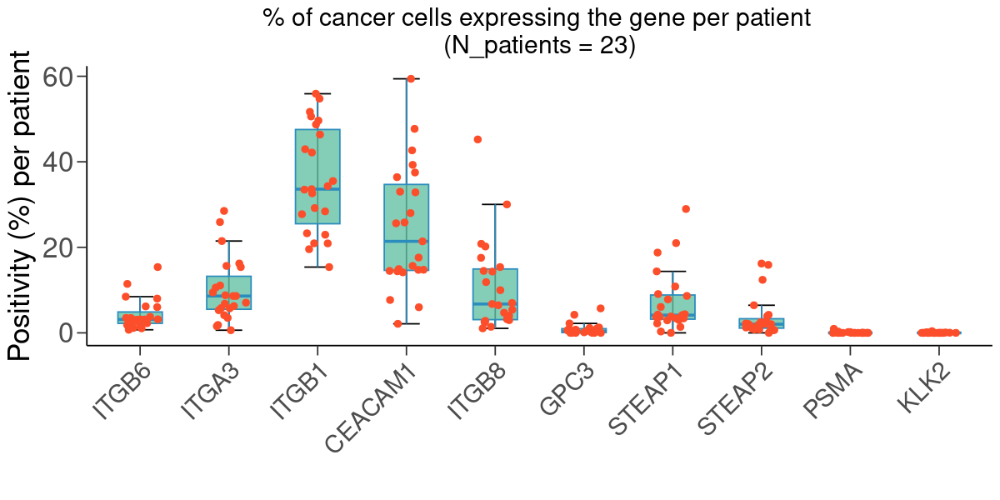

In [31]:

# genes <- c('ITGA3', 'ITGB1', 'STEAP1', 'STEAP2', 'CEACAM1', 
#                'ITGB8', 'GPC3', 'PSMA1', 'KLK2')
genes <- c('ITGB6', 'ITGA3', 'ITGB1', 'CEACAM1', 
               'ITGB8', 'GPC3', 'STEAP1', 'STEAP2', 'FOLH1', 'KLK2')
gene_dict <- c('FOLH1' = 'PSMA')

gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

plot_df <- NULL

for(G in genes){
    # G <- 'MUC13'
    if(G %in% rownames(gene_exp)){
    gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
    names(gene_exp_sub) <- 'Gene_exp'
    gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
    df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')
    
    plot.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(orig.ident) %>%
    summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
    plot.df2$Freq <- plot.df2$Freq *100
    
    plot.df2$hgnc_symbol <- G
    plot.df2 <- plot.df2 %>% select(orig.ident, hgnc_symbol, Freq)
    plot_df <- rbind(plot_df, plot.df2)
    }
}
n_patients <- length(unique(plot_df$orig.ident))

genes <- recode(genes, !!!gene_dict)
plot_df$hgnc_symbol <- dplyr::recode(plot_df$hgnc_symbol, !!!gene_dict)

plot_df$hgnc_symbol <- factor(plot_df$hgnc_symbol, levels = genes)

options(repr.plot.width = 10, repr.plot.height = 5)
ggplot(plot_df, aes(x = hgnc_symbol, y = Freq)) +
stat_boxplot(geom ='errorbar', width = 0.3) + 
       geom_boxplot(fill="#66C2A5", color="#2B8CBE", alpha=0.8, width = 0.5, outliers = F) + 
  geom_jitter(width=0.2, colour = "#FC4E2A", size = 2) +

# coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer cells expressing the gene per patient \n(N_patients = {n_patients})'),
        x = "",
        y = "Positivity (%) per patient") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 18, angle = 45, hjust = 1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18, hjust = 0.5)) +
guides(fill = guide_legend(reverse = TRUE))




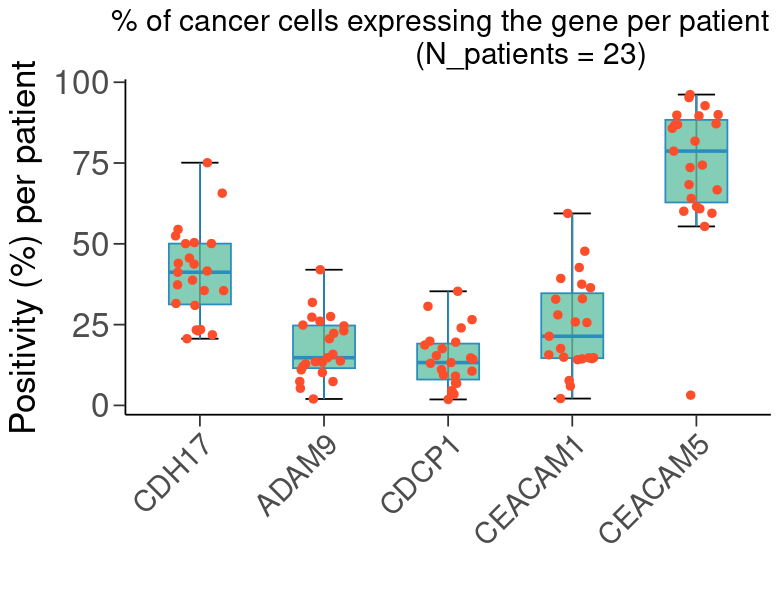

In [24]:
# CDH17, ADAM9, CDCP1, CEACAM1 RNA expression in CRC compared to CEACAM5
# genes <- c('ITGA3', 'ITGB1', 'STEAP1', 'STEAP2', 'CEACAM1', 
#                'ITGB8', 'GPC3', 'PSMA1', 'KLK2')
# genes <- c('ITGB6', 'ITGA3', 'ITGB1', 'CEACAM1', 
#                'ITGB8', 'GPC3', 'STEAP1', 'STEAP2', 'FOLH1', 'KLK2')
# gene_dict <- c('FOLH1' = 'PSMA')

genes <- c('CDH17', 'ADAM9', 'CDCP1', 'CEACAM1', 'CEACAM5')
gene_dict <- c('FOLH1' = 'PSMA')


gene_exp <- GetAssayData(object = tumor_obj, slot = "data")

plot_df <- NULL

for(G in genes){
    # G <- 'MUC13'
    if(G %in% rownames(gene_exp)){
    gene_exp_sub <- gene_exp[G, ] %>% as.data.frame()
    names(gene_exp_sub) <- 'Gene_exp'
    gene_exp_sub$Gene_cat <- ifelse((gene_exp_sub$Gene_exp > 0), 'Positive', 'Negative')
    df = merge(tumor_obj@meta.data, gene_exp_sub, by = 'row.names')
    
    plot.df2 <- df %>% filter(Cell_type == 'Epithelial cells') %>% group_by(orig.ident) %>%
    summarize(N = n(), N_positive =sum(Gene_cat == 'Positive'), Freq = N_positive/N )
    plot.df2$Freq <- plot.df2$Freq *100
    
    plot.df2$hgnc_symbol <- G
    plot.df2 <- plot.df2 %>% select(orig.ident, hgnc_symbol, Freq)
    plot_df <- rbind(plot_df, plot.df2)
    }
}
n_patients <- length(unique(plot_df$orig.ident))

genes <- recode(genes, !!!gene_dict)
plot_df$hgnc_symbol <- dplyr::recode(plot_df$hgnc_symbol, !!!gene_dict)

plot_df$hgnc_symbol <- factor(plot_df$hgnc_symbol, levels = genes)

options(repr.plot.width = 6.5, repr.plot.height = 5)
ggplot(plot_df, aes(x = hgnc_symbol, y = Freq)) +
stat_boxplot(geom ='errorbar', width = 0.3) + 
       geom_boxplot(fill="#66C2A5", color="#2B8CBE", alpha=0.8, width = 0.5, outliers = F) + 
  geom_jitter(width=0.2, colour = "#FC4E2A", size = 2) +

# coord_flip() +
    theme_classic() +
    labs(title = glue::glue('% of cancer cells expressing the gene per patient \n(N_patients = {n_patients})'),
        x = "",
        y = "Positivity (%) per patient") +
  theme(axis.ticks.length=unit(.25, "cm"),
    axis.text.x = element_text(size = 18, angle = 45, hjust = 1),
    axis.text.y = element_text(size = 20),  
    axis.title.x = element_text( size = 21),
    axis.title.y = element_text(size = 21), 
    axis.line = element_line( linewidth = 0.5), 
    legend.title=element_text(size=18),  
    legend.text=element_text(size=16), plot.title =element_text(size=18, hjust = 0.7)) +
guides(fill = guide_legend(reverse = TRUE))


